# Recommender Systems - Mini Challenge FS26

In this minichallenge we will explore a MovieLens dataset and implement several recommender systems and evaluation methods. Subsequently we will optimize these methods and compare the results. 

**Submission deadline:** Sunday of SW11 at 18:00 

## Guidelines for Implementation and Submission
- Code must be written in Python. The versions of all used packages must be given for reproducability.
- You may respond in English or German.
- We develop numerous algorithms ourselves. Unless explicitly stated otherwise, only the following libraries may be used in Python: numpy, matplotlib, seaborn, pandas. 
- Follow good coding practices and write modular, reusable code.
- The submitted solution must contain all codes and the results. No code may be outsourced.
- All pathes must be relative and just downloading your repo must be executable without modifications.
- Only fully running code is graded. The notebook must run sequential from start to end.
- During development, if computation time is too long for productive prototyping and debugging work, it is recommended to reduce the dataset to a fraction of its original. However, final results must be calculated on the full dataset. 
- All plots must be fully labeled (title, axes, labels, colorbar, etc.) so that the plot can be easily understood.
- Each plot must be accompanied by a brief discussion, which explains the plot and captures the key insights that become visible.
- Only fully labeled plots with an accompanying discussion will be assessed.
- The last commit in your fork of the repo before the submission deadline counts as the submission.
- Points will be deducted if you write inconsise (Denial of service will be punished) or if I read text not written for me but for the user of ChatGPT oir similar. 
- If you would like to submit and have the mini-challenge assessed, please send a short email to the subject expert (moritz.kirschmann@fhnw.ch) within 2 days after submission.
- Please do not delete, duplicate, or move the existing cells. This leads to problems during the correction. However, you may add as many additional cells as you like.

## Exercises

### Exercise 1 - A deep exploration of the dataset (17 points)
We will work with a subset of the MovieLens dataset. This subset is located under ``data/ml-latest-small``. Read the ``README.txt``carefully. 
Open the files. 

a) Describe the available data.

b) Find and fix bad data (e.g. duplicates, missing values, etc.).

Generate lists of

c) - Top 20 movies by average rating

d) - Top 20 movies by number of views

e) What is the range of the ratings? 

f) Which genre has be rated how many times?

g) How sparse is the User Rating Matrix?

Plot the following:

h) How many users have rated how many movies

i) Which rating is given how often over time with a time resolution of month 

j) Which rating is given how often per genre

k) The rating distributions of 10 random movies

l) The rating distributions of 3 movies that you have watched

m) How many users give which average rating

n) How often a movie was rated as a function of average rating

o) A heatmap of the User Item Matrix

p) A heatmap of the User Item Matrix for the 100 most rated movies for the 50 users with most ratings


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.lines import Line2D
import matplotlib.dates as mdates

#### a) Data Description

Zuerst laden wir die Daten in Panda-Df's.

In [2]:
ratings = pd.read_csv("data/ml-latest-small/ratings.csv")
movies = pd.read_csv("data/ml-latest-small/movies.csv")
tags = pd.read_csv("data/ml-latest-small/tags.csv")
links = pd.read_csv("data/ml-latest-small/links.csv")

Wir haben 4 .csv-Dateien:

##### `ratings.csv`

In [3]:
ratings.info()

<class 'pandas.DataFrame'>
RangeIndex: 100836 entries, 0 to 100835
Data columns (total 4 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   userId     100836 non-null  int64  
 1   movieId    100836 non-null  int64  
 2   rating     100836 non-null  float64
 3   timestamp  100836 non-null  int64  
dtypes: float64(1), int64(3)
memory usage: 3.1 MB


In [4]:
ratings.head()

,userId,movieId,rating,timestamp
0,1,1,4.0,964982703
1,1,3,4.0,964981247
2,1,6,4.0,964982224
3,1,47,5.0,964983815
4,1,50,5.0,964982931


In [5]:
print(f"Unique Users: {ratings['userId'].nunique()}")
print(f"Unique Movies: {ratings['movieId'].nunique()}")

Unique Users: 610
Unique Movies: 9724


Dies ist das "Herzstück", welches für das Aufbauen der User-Rating-Matrix dient (URM).

Es wurden Total 9724 Filme bewertet. Wir haben insgesamt 100'836 Einträge bzw. Ratings über diese Filme, welche durch Total 610 einzigartigen User verursacht wurden.

Die Datei bzw. das Dataframe besteht aus den Spalten:
- `userId`: Unique-Wert für den User im int-Format (dies wären die Zeilen in der URM)
- `movieId`: Unique-Wert für den Film im int-Format (dies wären die Spalten in der URM)
- `rating`: Das vom User vergebene Rating für einen Film im float-Format (dies wären die Einträge in der URM)
- `timestamp`: Der Zeitpunkt des Ratings im int-Format als Unix-Timestamp also Anzahl Sekunden seit dem 01.01.1970 UTC (dies könnten wir evtl. als Side Information verwenden)

Die Datei ist im Grunde genommen ein COO-Format (Coordinate Format). Heisst jede Zeile speichert ein Tripel (exkl. Timestamp) mit user, movie, rating.

Wir konvertieren noch kurz die timestamp-Spalte in ein leichter interpretierbareres Format.

In [6]:
ratings['timestamp'] = pd.to_datetime(ratings['timestamp'], unit='s')

In [7]:
ratings.head()

,userId,movieId,rating,timestamp
0,1,1,4.0,2000-07-30 18:45:03
1,1,3,4.0,2000-07-30 18:20:47
2,1,6,4.0,2000-07-30 18:37:04
3,1,47,5.0,2000-07-30 19:03:35
4,1,50,5.0,2000-07-30 18:48:51


Die Konvertierung hat funktioniert. Die timestamps liegen nun im Format `YYYY-MM-DD hh:mm:ss` vor. Nun untersuchen wir die Wertebereiche der ratings und der timestamps um die Daten interpretieren zu können und eventuelle unsinnige Daten ausfindig zu machen.

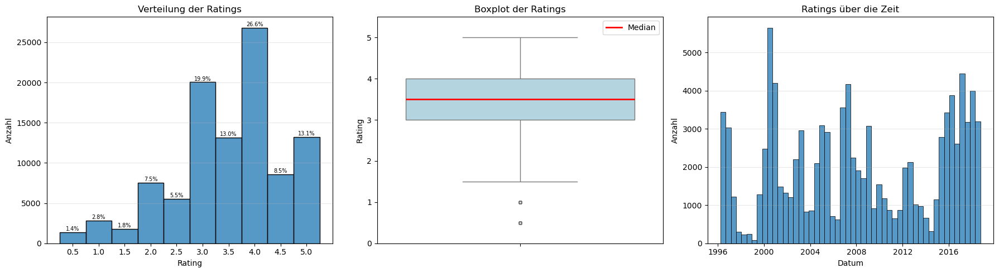

In [8]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# 1) Rating-Verteilung mit Prozent
sns.histplot(data=ratings, x='rating', bins=np.arange(0.25, 5.75, 0.5), ax=axes[0])
counts = ratings['rating'].value_counts().sort_index()
pct = (counts / len(ratings) * 100)
for i, p in enumerate(pct.values):
    axes[0].text(counts.index[i], counts.values[i] + 200, f'{p:.1f}%', ha='center', fontsize=7)
axes[0].set_title('Verteilung der Ratings')
axes[0].set_xlabel('Rating')
axes[0].set_ylabel('Anzahl')
axes[0].set_xticks(np.arange(0.5, 5.5, 0.5))
axes[0].grid(axis='y', alpha=0.3)

# 2) Boxplot
sns.boxplot(y=ratings['rating'], ax=axes[1], color='lightblue',
            medianprops=dict(color='red', linewidth=2),
            flierprops=dict(marker='o', markersize=4, alpha=0.5))
axes[1].set_title('Boxplot der Ratings')
axes[1].set_ylabel('Rating')
axes[1].set_ylim(0, 5.5)
axes[1].legend(handles=[
    Line2D([0], [0], color='red', linewidth=2, label='Median')
])

# 3) Timestamps
sns.histplot(data=ratings, x='timestamp', bins=50, ax=axes[2])
axes[2].set_title('Ratings über die Zeit')
axes[2].set_xlabel('Datum')
axes[2].set_ylabel('Anzahl')
axes[2].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

In [9]:
# Rating-Statistiken
print("Rating")
print(ratings['rating'].describe())

# Timestamp-Statistiken
print("\nTimestamp")
print(ratings['timestamp'].describe())

Rating
count    100836.000000
mean          3.501557
std           1.042529
min           0.500000
25%           3.000000
50%           3.500000
75%           4.000000
max           5.000000
Name: rating, dtype: float64

Timestamp
count                 100836
mean     2008-03-19 17:01:27
min      1996-03-29 18:36:55
25%      2002-04-18 09:57:46
50%      2007-08-02 20:31:02
75%      2015-07-04 07:15:44
max      2018-09-24 14:27:30
Name: timestamp, dtype: object


Die Daten sehen sinnvoll aus.

Die Ratings gehen in 0.5-Schritten von 0.5 bis 5.0. Der Durchschnitt liegt bei 3.5 mit einer Standardabweichung von 1.0. Die Ratings sind klar linksschief verteilt; d.h. die User bewerten tendenziell grosszügiger. Ca. 48.2% der Ratings also fast die Hälfte befindet sich im Intervall [4.0, 5.0]. Dies liegt wohl an einem positiven Bias. Heisst, User bewerten Filme eher wenn sie diese mögen und lassen schlechte Filme aus, da sie diese gar nicht erst anschauen oder abbrechen und dann nicht bewerten.

Das Rating der Filme begann am 29.03.1996 und reichte bis 24.09.2018. Also haben wir einen Zeitstrahl von knapp 22 Jahren. Interessant sind die hohe Anzahl an Ratings, welche immer wieder mit der Zeit abnehmen und dann wieder sprunghaft ansteigen. Dies wiederholt sich fast periodisch bzw. folgt einem Zyklus (mit Abstand von ca. 2-4 Jahren).

Wir wollen nun noch schauen ob es möglich ist, dass ein User einem Film zweimal ein Rating geben kann.

In [10]:
# Duplikate in Ratings: gleicher User, gleicher Film
rating_dupes = ratings[ratings.duplicated(subset=['userId', 'movieId'], keep=False)]
print(f"Doppelte User-Movie Paare: {len(rating_dupes)}")
print(rating_dupes.to_string(index=False))

Doppelte User-Movie Paare: 0
Empty DataFrame
Columns: [userId, movieId, rating, timestamp]
Index: []


Wir sehen, dass es keinen User gibt, welcher einer Movie-ID mehr als ein Rating geben kann.

##### `movies.csv`

In [11]:
movies.info()

<class 'pandas.DataFrame'>
RangeIndex: 9742 entries, 0 to 9741
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype
---  ------   --------------  -----
 0   movieId  9742 non-null   int64
 1   title    9742 non-null   str  
 2   genres   9742 non-null   str  
dtypes: int64(1), str(2)
memory usage: 228.5 KB


In [12]:
movies.head()

,movieId,title,genres
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,2,Jumanji (1995),Adventure|Children|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance
4,5,Father of the Bride Part II (1995),Comedy


In [13]:
print(f"Unique Movies: {movies['movieId'].nunique()}")
print(f"Unique Titel: {movies['title'].nunique()}")

Unique Movies: 9742
Unique Titel: 9737


Hier haben wir die Filme abgespeichert, welche wir für den Aufbau einer Item-Conten-Matrix (ICM) verwenden könnten.

Wir haben insgesamt 9742 Einträge bzw. Filme.

Die Datei bzw. das Dataframe besteht aus den Spalten:
- `movieId`: Unique-Wert für den Film im int-Format (dies wären die Zeilen in der ICM, besser als `title` da die Id Unique ist)
- `title`: Name des Filmes im str-Format (es scheint, dass im Anschluss des Titels immer noch in Klammern das Jahr aufgeführt ist)
- `genres`: Das Genre des Filmes im str-Format getrennt mittels `|` (dies wären die Features in der ICM)

Wir haben bei den Ratings insgesamt 9724 unique Movies. Beim Movie-DF haben wir jedoch 9742 unique ID's. D.h. wir haben gewisse Movies (total 18 Filme), welche gar nicht bewertet wurden. Das schauen wir uns nachher an.

Spannend ist, dass es jedoch nur 9737 unique Titel gibt. D.h. es gibt Filme mit unterschiedlichen ID's aber es teilen sich gewisse Filme den Titel obwohl es unterschiedliche Filme sind (Unterschied von 5). Das untersuchen wir folgend.

Auch hier untersuchen wir die Werte um einen Überblick zu erhalten.

Zuerst untersuchen wir die Filme, welche im Movies-DF vorkommen aber im Ratings-DF nicht (also keine Bewertung vorliegt).

In [14]:
unrated = movies[~movies['movieId'].isin(ratings['movieId'])]
print(f"Anzahl unbewerteter Filme: {len(unrated)}")
print(unrated[['movieId', 'title', 'genres']].to_string(index=False))

Anzahl unbewerteter Filme: 18
 movieId                                        title                   genres
    1076                        Innocents, The (1961)    Drama|Horror|Thriller
    2939                               Niagara (1953)           Drama|Thriller
    3338                       For All Mankind (1989)              Documentary
    3456 Color of Paradise, The (Rang-e khoda) (1999)                    Drama
    4194               I Know Where I'm Going! (1945)        Drama|Romance|War
    5721                           Chosen, The (1981)                    Drama
    6668  Road Home, The (Wo de fu qin mu qin) (1999)            Drama|Romance
    6849                               Scrooge (1970)    Drama|Fantasy|Musical
    7020                                 Proof (1991)     Comedy|Drama|Romance
    7792                    Parallax View, The (1974)                 Thriller
    8765                     This Gun for Hire (1942) Crime|Film-Noir|Thriller
   25855              

Wie vorhin vermutet sind es 18 Filme, welche nicht bewertet wurden.

Wir untersuchen nun die Verteilung der Genres.

Anzahl unique Genres: 20

genres
Drama                 4361
Comedy                3756
Thriller              1894
Action                1828
Romance               1596
Adventure             1263
Crime                 1199
Sci-Fi                 980
Horror                 978
Fantasy                779
Children               664
Animation              611
Mystery                573
Documentary            440
War                    382
Musical                334
Western                167
IMAX                   158
Film-Noir               87
(no genres listed)      34
Name: count, dtype: int64


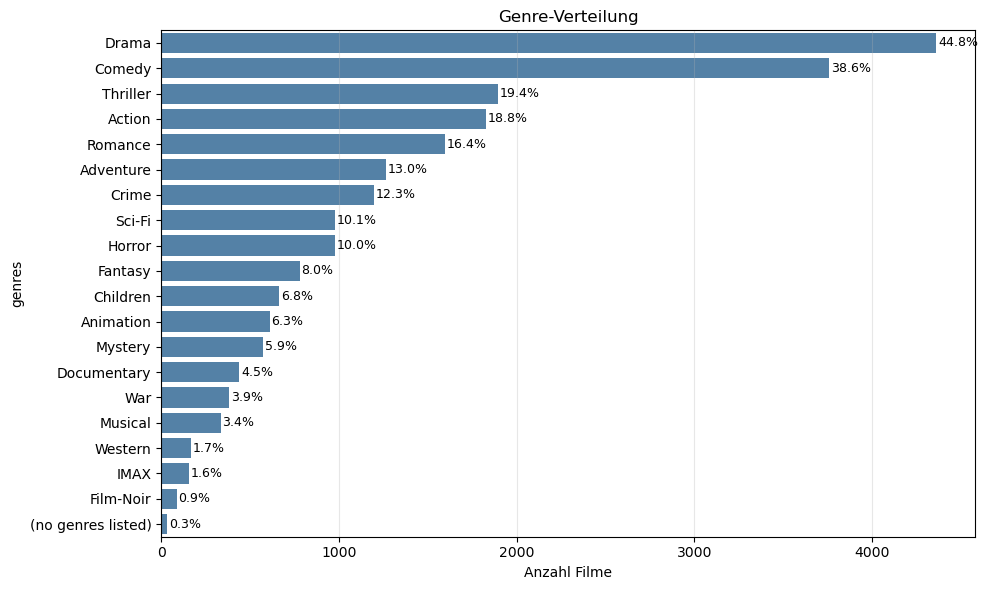

In [15]:
all_genres = movies['genres'].str.split('|').explode()
genre_counts = all_genres.value_counts()
genre_pct = (genre_counts / len(movies) * 100)
print(f"Anzahl unique Genres: {all_genres.nunique()}")
print(f"\n{all_genres.value_counts()}")

fig, ax = plt.subplots(figsize=(10, 6))
sns.barplot(x=genre_counts.values, y=genre_counts.index, ax=ax, color='steelblue')
for i, p in enumerate(genre_pct.values):
    ax.text(genre_counts.values[i] + 10, i, f'{p:.1f}%', va='center', fontsize=9)
ax.set_title('Genre-Verteilung')
ax.set_xlabel('Anzahl Filme')
ax.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

Wir sehen, dass es Total 20 Genres gibt. Drama und Comedy sind mit Abstand am häufigsten (44.8% bzw. 38.6% aller Filme). Da ein Film mehrere Genres haben kann summieren sich die Prozentwerte nicht auf 100%; effektiv haben 72.9% der Filme Drama oder Comedy als (eines ihrer) Genre.

Ein "Genre" heisst `(no genres listed)` (34 Filme). Das ist ein fehlender Wert, nicht ein echtes Genre und wird in Aufgabe 1b explizit als `NaN` markiert.

Nun untersuchen wir die Anzahl Genres die ein Film besitzt.

count    9742.000000
mean        2.263396
std         1.128720
min         0.000000
25%         1.000000
50%         2.000000
75%         3.000000
max        10.000000
Name: genres, dtype: float64


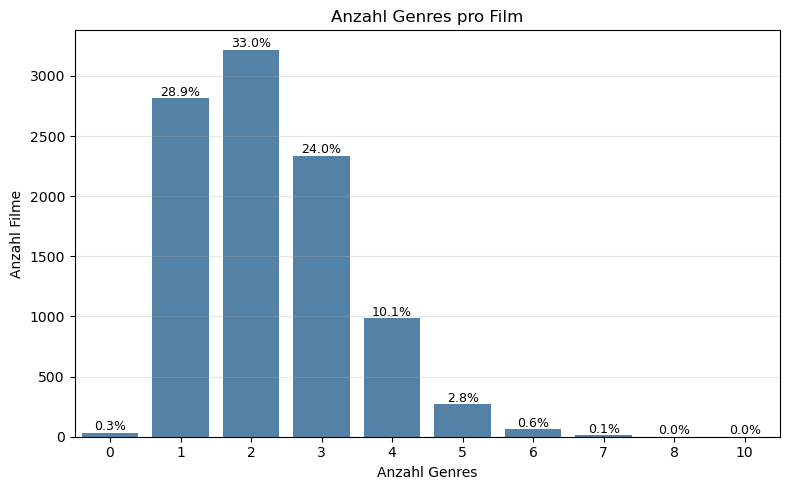

In [16]:
# (no genres listed) zählt als 0 Genres (echter Fehlwert, vgl. Aufgabe 1b)
n_genres = movies['genres'].apply(
    lambda g: 0 if g == '(no genres listed)' else len(g.split('|'))
)
print(n_genres.describe())

fig, ax = plt.subplots(figsize=(8, 5))
genre_per_movie = n_genres.value_counts().sort_index()
genre_per_movie_pct = (genre_per_movie / len(movies) * 100)
sns.barplot(x=genre_per_movie.index, y=genre_per_movie.values, ax=ax, color='steelblue')
for i, p in enumerate(genre_per_movie_pct.values):
    ax.text(i, genre_per_movie.values[i] + 20, f'{p:.1f}%', ha='center', fontsize=9)
ax.set_title('Anzahl Genres pro Film')
ax.set_xlabel('Anzahl Genres')
ax.set_ylabel('Anzahl Filme')
ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

Wir sehen, dass die Anzahl Genres die ein Film hat stark rechtsschief ist. Über 86% der Filme haben 1-3 Genres.

Wir hatten noch eine Ungleichheit in der Anzahl der movieId und title vorhin gefunden. Dies untersuchen wir nun.

In [17]:
dupes = movies[movies['title'].duplicated(keep=False)].sort_values('title')
print(f"\n=== Duplikat-Titel ({len(dupes)} Einträge, {dupes['title'].nunique()} Titel) ===")
print(dupes[['movieId', 'title', 'genres']].to_string(index=False))


=== Duplikat-Titel (10 Einträge, 5 Titel) ===
 movieId                                  title                              genres
    6003 Confessions of a Dangerous Mind (2002)         Comedy|Crime|Drama|Thriller
  144606 Confessions of a Dangerous Mind (2002) Comedy|Crime|Drama|Romance|Thriller
     838                            Emma (1996)                Comedy|Drama|Romance
   26958                            Emma (1996)                             Romance
   32600                            Eros (2004)                               Drama
  147002                            Eros (2004)                       Drama|Romance
    2851                        Saturn 3 (1980)           Adventure|Sci-Fi|Thriller
  168358                        Saturn 3 (1980)                     Sci-Fi|Thriller
   34048               War of the Worlds (2005)    Action|Adventure|Sci-Fi|Thriller
   64997               War of the Worlds (2005)                       Action|Sci-Fi


Wir haben 5 Titel, welche denselben Titel haben aber unterschiedliche movieId's. Dies müssen wir später adressieren.

Nun schauen wir noch bei den Titeln, die in Klammern stehenden Jahre an. Eine kurze Recherche hat ergeben, dass es sich bei diesem Jahr um das Erscheinungsjahr handeln muss.

Filme mit Jahr: 9729
Filme ohne Jahr: 13

count    9729.000000
mean     1994.613629
std        18.535219
min      1902.000000
25%      1988.000000
50%      1999.000000
75%      2008.000000
max      2018.000000
Name: 0, dtype: float64

Filme ohne Jahr im Titel:
 movieId                                               title
   40697                                           Babylon 5
  140956                                    Ready Player One
  143410                                          Hyena Road
  147250 The Adventures of Sherlock Holmes and Doctor Watson
  149334                                   Nocturnal Animals
  156605                                            Paterson
  162414                                           Moonlight
  167570                                              The OA
  171495                                              Cosmos
  171631                             Maria Bamford: Old Baby
  171749                   Death Note: Desu nôto (2006–2007)
  17189

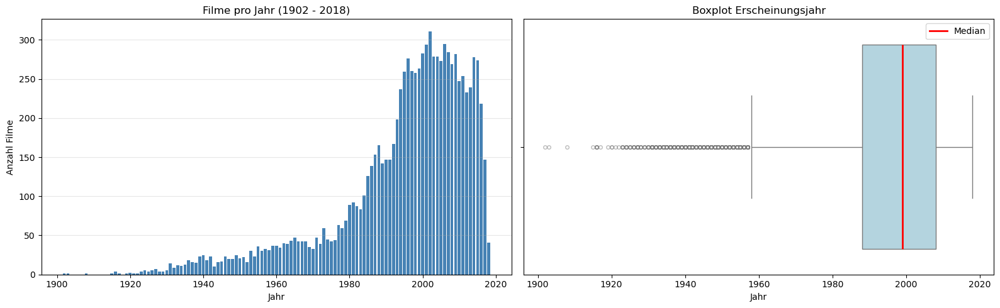

In [18]:
years = movies['title'].str.extract(r'\((\d{4})\)')[0].astype(float)

print(f"Filme mit Jahr: {years.notna().sum()}")
print(f"Filme ohne Jahr: {years.isna().sum()}")
print(f"\n{years.describe()}")

missing_year = movies[years.isna()]
if len(missing_year) > 0:
    print(f"\nFilme ohne Jahr im Titel:")
    print(missing_year[['movieId', 'title']].to_string(index=False))

fig, axes = plt.subplots(1, 2, figsize=(16, 5))

# 1) Filme pro Jahr
year_counts = years.dropna().astype(int).value_counts().sort_index()
axes[0].bar(year_counts.index, year_counts.values, color='steelblue')
axes[0].set_title(f'Filme pro Jahr ({int(years.min())} - {int(years.max())})')
axes[0].set_xlabel('Jahr')
axes[0].set_ylabel('Anzahl Filme')
axes[0].grid(axis='y', alpha=0.3)

# 2) Boxplot
sns.boxplot(x=years, ax=axes[1], color='lightblue',
            medianprops=dict(color='red', linewidth=2),
            flierprops=dict(marker='o', markersize=4, alpha=0.5))
axes[1].set_title('Boxplot Erscheinungsjahr')
axes[1].set_xlabel('Jahr')
axes[1].legend(handles=[
    Line2D([0], [0], color='red', linewidth=2, label='Median')
])

plt.tight_layout()
plt.show()

12 Filme weisen kein Jahr auf und ein Film hat eine Zeitspanne statt eines einzelnen Jahres (Death Note). Dies könnte daran liegen, dass es sich um Serien handelt oder einfach keine Jahreszuweisung gemacht wurde aus welchen Gründen auch immer. Die Verteilung der Erscheinungsjahre ist stark linksschief. Der Median liegt bei 1999. 75% der Filme sind nach 1988 erschienen. Wir haben also tendenziell neuere Filme im Datensatz. Dies liegt evtl. auch daran, dass es für ältere Filme eher keine Ratings gibt.

##### `tags.csv`

In [19]:
tags.info()

<class 'pandas.DataFrame'>
RangeIndex: 3683 entries, 0 to 3682
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype
---  ------     --------------  -----
 0   userId     3683 non-null   int64
 1   movieId    3683 non-null   int64
 2   tag        3683 non-null   str  
 3   timestamp  3683 non-null   int64
dtypes: int64(3), str(1)
memory usage: 115.2 KB


In [20]:
tags.head()

,userId,movieId,tag,timestamp
0,2,60756,funny,1445714994
1,2,60756,Highly quotable,1445714996
2,2,60756,will ferrell,1445714992
3,2,89774,Boxing story,1445715207
4,2,89774,MMA,1445715200


In [21]:
print(f"Unique Users: {tags['userId'].nunique()}")
print(f"Unique Movies: {tags['movieId'].nunique()}")
print(f"Unique Tags: {tags['tag'].nunique()}")

Unique Users: 58
Unique Movies: 1572
Unique Tags: 1589


Hier haben wir die Tags abgespeichert. Tags können von einem User selbstständig vergeben werden um weitere Informationen über den Film zu geben.
Wir haben insgesamt 3683 Einträge bzw. Tags.

Die Datei bzw. das Dataframe besteht aus den Spalten:
- `userId`: Unique-Wert für den User im int-Format
- `movieId`: Unique-Wert für den Film im int-Format
- `tag`: Der vom User vergebene Tag im str-Format
- `timestamp`: Der Zeitpunkt der Erstellung des Tags im int-Format als Unix-Timestamp also Anzahl Sekunden seit dem 01.01.1970 UTC

Wir haben 58 unique User, welche Total 3683 Tags gesetzt haben. Es sind jedoch nur 1572 unique Movies. D.h. wir haben User, welche mehrere Tags für denselben Film gesetzt haben. Diese unterschiedlichen Tags werden einzeln in einer Zeile gespeichert.

Also nur knapp 9.5% aller User setzen überhaupt Tags.

Zudem haben wir auch doppelte Tag-Werte. Von den 3683 Tags sind nur 1589 unique. Also kommen gewisse Tags mehrfach vor.

Auch hier haben wir wieder eine timestamp-Spalte, welche wir in ein interpretierbareres Format konvertieren.

In [22]:
tags['timestamp'] = pd.to_datetime(tags['timestamp'], unit='s')

In [23]:
print(tags.head())

   userId  movieId              tag           timestamp
0       2    60756            funny 2015-10-24 19:29:54
1       2    60756  Highly quotable 2015-10-24 19:29:56
2       2    60756     will ferrell 2015-10-24 19:29:52
3       2    89774     Boxing story 2015-10-24 19:33:27
4       2    89774              MMA 2015-10-24 19:33:20


Auch das hat funktioniert. Wir untersuchen noch kurz die Verteilung der Tag-Zeitsetzungen und machen eine Top 20-Rangliste der fleissigsten Tagsetzer.

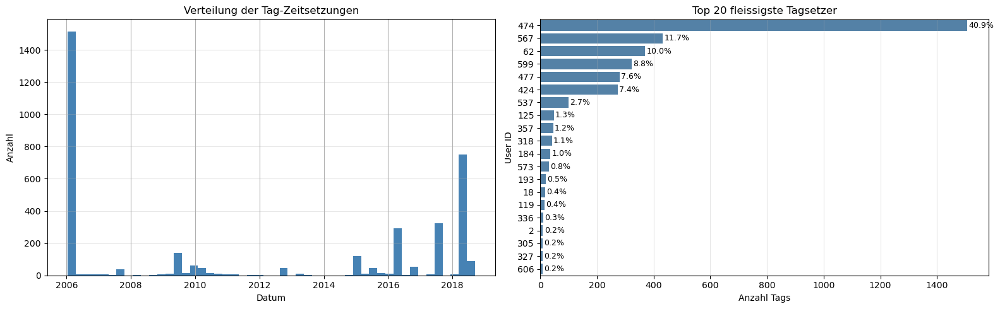

In [24]:
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

tags['timestamp'].hist(bins=50, ax=axes[0], color='steelblue')
axes[0].set_title('Verteilung der Tag-Zeitsetzungen')
axes[0].set_xlabel('Datum')
axes[0].set_ylabel('Anzahl')
axes[0].grid(axis='y', alpha=0.3)

top_taggers = tags['userId'].value_counts().head(20)
top_taggers_pct = (top_taggers / len(tags) * 100)
sns.barplot(x=top_taggers.values, y=top_taggers.index.astype(str), ax=axes[1], color='steelblue')
for i, p in enumerate(top_taggers_pct.values):
    axes[1].text(top_taggers.values[i] + 5, i, f'{p:.1f}%', va='center', fontsize=9)
axes[1].set_title('Top 20 fleissigste Tagsetzer')
axes[1].set_xlabel('Anzahl Tags')
axes[1].set_ylabel('User ID')
axes[1].grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.show()

Wir sehen, dass ein grosser Teil der Tagsetzung im Jahr 2006 und teilweise im Jahr 2018 gemacht wurden.

Und wir haben einen Super-Tag-User mit der ID 474, welcher für fast 41% der Tags verantwortlich ist.

##### `links.csv`

In [25]:
links.info()

<class 'pandas.DataFrame'>
RangeIndex: 9742 entries, 0 to 9741
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   movieId  9742 non-null   int64  
 1   imdbId   9742 non-null   int64  
 2   tmdbId   9734 non-null   float64
dtypes: float64(1), int64(2)
memory usage: 228.5 KB


In [26]:
links.head()

,movieId,imdbId,tmdbId
0,1,114709,862.0
1,2,113497,8844.0
2,3,113228,15602.0
3,4,114885,31357.0
4,5,113041,11862.0


In [27]:
print(f"Unique Movies: {links['movieId'].nunique()}")
print(f"Unique IMDB-ID: {links['imdbId'].nunique()}")
print(f"Unique TMdb-ID: {links['tmdbId'].nunique()}")

Unique Movies: 9742
Unique IMDB-ID: 9742
Unique TMdb-ID: 9733


Hier haben wir die Verlinkung zu dem Movie-Datenbanken abgespeichert. Sie bestehen aus den Id's, welche uns auf die Webseite des Datenbankeintrages führt.
Wir haben insgesamt 9742 Einträge bzw. Verlinkungen (entspricht der Anzahl Filme im Movies-DF).

Die Datei bzw. das Dataframe besteht aus den Spalten:
- `movieId`: Unique-Wert für den Film (Primärschlüssel) im int-Format
- `imdbId`: Die ID für die Filmdatenbank IMDb (imdb.com)
- `tmdbId`: Die ID für die Filmdatenbank The Movie Database (themoviedb.org)

Jeder Film hat sicherlich eine IMDB-Verknüpfung. Bei der TMDB fehlen jedoch wohl 9 Verknüpfungen. Wir schauen das an.

In [28]:
missing_tmdb = links[links['tmdbId'].isna()]
print(f"Filme ohne TMDB-Verknüpfung: {len(missing_tmdb)}")
print(missing_tmdb.merge(movies[['movieId', 'title']], on='movieId')[['movieId', 'title', 'imdbId']].to_string(index=False))

Filme ohne TMDB-Verknüpfung: 8
 movieId                                                           title  imdbId
     791 Last Klezmer: Leopold Kozlowski, His Life and Music, The (1994)  113610
    1107                                                    Loser (1991)  102336
    2851                                                 Saturn 3 (1980)   81454
    4051        Horrors of Spider Island (Ein Toter Hing im Netz) (1960)   56600
   26587                                 Decalogue, The (Dekalog) (1989)   92337
   32600                                                     Eros (2004)  377059
   40697                                                       Babylon 5  105946
   79299                      No. 1 Ladies' Detective Agency, The (2008)  874957


In [29]:
print(links[links['tmdbId'].isna()])

      movieId  imdbId  tmdbId
624       791  113610     NaN
843      1107  102336     NaN
2141     2851   81454     NaN
3027     4051   56600     NaN
5532    26587   92337     NaN
5854    32600  377059     NaN
6059    40697  105946     NaN
7382    79299  874957     NaN


Wir haben wirklich NaN-Werte im TMDB-Spalte. Jedoch statt wie angenommen 9 sind es 8. Das heisst, dass eine TMDB-ID doppelt vergeben wurde. Schauen wir nach.

In [30]:
# Duplikate in tmdbId finden
dupes_tmdb = links[links['tmdbId'].duplicated(keep=False)].dropna(subset=['tmdbId'])
print(dupes_tmdb.merge(movies[['movieId', 'title']], on='movieId')[['movieId', 'title', 'tmdbId']].to_string(index=False))

 movieId                                  title  tmdbId
    6003 Confessions of a Dangerous Mind (2002)  4912.0
  144606 Confessions of a Dangerous Mind (2002)  4912.0


Dieser Film existiert also zweimal unter verschiedenen movieId's aber teilt sich die TMDB-ID. Dieser Film ist auch schon bei der Untersuchung des Movie-DF aufgefallen. Wir merken uns diesen Umstand und adressieren diesen bei Bedarf später.

##### Fazit / (bei Bedarf) zu adressierende Punkte

Wir listen nun Punkte aus Aufgabe a) auf, welche wir evtl. bei Bedarf im späteren Verlauf noch adressieren müssen:

- Es gibt 20 Genres inkl. einem Genre `(no genres listed)`
- Es gibt 18 Filme, welche keine Bewertung haben (existieren in Movies-DF aber nicht in Ratings-DF)
- Es gibt 5 Filme, welche im Movie-DF doppelt vorkommen sprich unterschiedliche MovieIDs haben (`dupes`) aber denselben Movie-Titel
- Wir haben 13 Filme ohne Veröffentlichungsjahr
- 8 Filme haben keine TMDB-Verknüpfung (also NaN-Werte)
- Ein Film kommt mit einer doppelten TMDB-ID vor

#### b) Fixing bad data

Wir füllen die Genres mit dem Wert no genres listed mit NaN.

In [31]:
movies['genres'] = movies['genres'].replace('(no genres listed)', np.nan)
print(f"NaN-Werte in genres: {movies['genres'].isna().sum()}")

NaN-Werte in genres: 34


Nun haben wir 34 NaN-Werte. Dies entspricht der Anzahl der Filme mit Genre no genres listed (siehe Analyse oben). Wir müssen aber noch die Variablen updaten ansonsten haben wir diese Aktualisierung nicht drin, falls wir diese nochmals verwenden.

In [32]:
# Genre-Variablen aktualisieren
all_genres = movies['genres'].dropna().str.split('|').explode()
genre_counts = all_genres.value_counts()
genre_pct = (genre_counts / len(movies) * 100)

Wir schauen uns nochmals die Duplikate im Movies-DF an.

In [33]:
print(f"\n=== Duplikat-Titel ({len(dupes)} Einträge, {dupes['title'].nunique()} Titel) ===")
print(dupes[['movieId', 'title', 'genres']].to_string(index=False))


=== Duplikat-Titel (10 Einträge, 5 Titel) ===
 movieId                                  title                              genres
    6003 Confessions of a Dangerous Mind (2002)         Comedy|Crime|Drama|Thriller
  144606 Confessions of a Dangerous Mind (2002) Comedy|Crime|Drama|Romance|Thriller
     838                            Emma (1996)                Comedy|Drama|Romance
   26958                            Emma (1996)                             Romance
   32600                            Eros (2004)                               Drama
  147002                            Eros (2004)                       Drama|Romance
    2851                        Saturn 3 (1980)           Adventure|Sci-Fi|Thriller
  168358                        Saturn 3 (1980)                     Sci-Fi|Thriller
   34048               War of the Worlds (2005)    Action|Adventure|Sci-Fi|Thriller
   64997               War of the Worlds (2005)                       Action|Sci-Fi


Der Grund für die Duplikate liegt wohl an den unterschiedlichen Genres. Der Film Eros beispielsweise hat einmal Drama und einmal Drama, Romance als Genre. Für führen die Filme so zusammen, dass alle Unique-Genres der Duplikate in einem Eintrag vereint werden (wir wählen also jene ID, welche alle in sich hat). Natürlich machen wir die Zusammenführung für alle Dataframes. Bei den Ratings werden wir die Ratings übernehmen von jenem Duplikat, welches entfernt wird. Der Merge-Schritt löst gleichzeitig noch unser Problem der doppelten TMDB-ID. Diese wird auch entfernt.

In [34]:
print(f"Movies vor Bereinigung: {len(movies)}")
print(f"Unique Titel vor Bereinigung: {movies['title'].nunique()}")

for title in dupes['title'].unique():
    group = movies[movies['title'] == title]
    all_genres = set()
    for g in group['genres'].dropna():
        all_genres.update(g.split('|'))
    merged_genres = '|'.join(sorted(all_genres))
    keep_id = group['movieId'].min()
    drop_ids = group[group['movieId'] != keep_id]['movieId'].tolist()
    
    # Zeigen was ersetzt wird
    for did in drop_ids:
        n_ratings = len(ratings[ratings['movieId'] == did])
        n_tags = len(tags[tags['movieId'] == did])
        print(f"  movieId {did} -> {keep_id}: {n_ratings} ratings, {n_tags} tags umgeleitet")
    
    movies.loc[movies['movieId'] == keep_id, 'genres'] = merged_genres
    movies = movies[~movies['movieId'].isin(drop_ids)]
    ratings['movieId'] = ratings['movieId'].replace(dict.fromkeys(drop_ids, keep_id))
    tags['movieId'] = tags['movieId'].replace(dict.fromkeys(drop_ids, keep_id))
    links = links[~links['movieId'].isin(drop_ids)]
    print(f"{title}: {list(group['movieId'])} -> {keep_id} | Genres: {merged_genres}\n")

print(f"Movies nach Bereinigung: {len(movies)}")
print(f"Unique Titel nach Bereinigung: {movies['title'].nunique()}")

Movies vor Bereinigung: 9742
Unique Titel vor Bereinigung: 9737
  movieId 144606 -> 6003: 1 ratings, 0 tags umgeleitet
Confessions of a Dangerous Mind (2002): [6003, 144606] -> 6003 | Genres: Comedy|Crime|Drama|Romance|Thriller

  movieId 26958 -> 838: 1 ratings, 0 tags umgeleitet
Emma (1996): [838, 26958] -> 838 | Genres: Comedy|Drama|Romance

  movieId 147002 -> 32600: 1 ratings, 0 tags umgeleitet
Eros (2004): [32600, 147002] -> 32600 | Genres: Drama|Romance

  movieId 168358 -> 2851: 1 ratings, 0 tags umgeleitet
Saturn 3 (1980): [2851, 168358] -> 2851 | Genres: Adventure|Sci-Fi|Thriller

  movieId 64997 -> 34048: 2 ratings, 0 tags umgeleitet
War of the Worlds (2005): [34048, 64997] -> 34048 | Genres: Action|Adventure|Sci-Fi|Thriller

Movies nach Bereinigung: 9737
Unique Titel nach Bereinigung: 9737


Wir haben also 9737 Unique Movies. Somit haben wir im Vergleich zum Rating-DF (9719 unique movieIds nach Bereinigung, siehe weiter unten) schlussendlich 18 Filme, welche nicht bewertet wurden. Die 5 entfernten Duplikat-Filme waren alle bereits bewertet, daher bleibt die Anzahl der unbewerteten Filme unverändert.

Nach dem Movie-Merge prüfen wir ob durch die movieId-Ersetzung neue Rating-Duplikate entstanden sind. Das passiert wenn ein User beide Duplikat-Filme bewertet hat. Nach dem Merge zeigen beide auf dieselbe movieId. Falls ja, behalten wir das neuere Rating.

In [35]:
# Neue Rating-Duplikate durch Movie-Merge prüfen und entfernen
merge_rating_dupes = ratings[ratings.duplicated(subset=['userId', 'movieId'], keep=False)]
print(f"Neue Rating-Duplikate durch Movie-Merge: {len(merge_rating_dupes)}")
ratings = ratings.sort_values('timestamp').drop_duplicates(subset=['userId', 'movieId'], keep='last')


Neue Rating-Duplikate durch Movie-Merge: 8


Es sind 8 neue Duplikate (4 User mit je 2 Einträgen pro betroffener movieId). Wir haben oben bereits sortiert nach `timestamp` und `keep='last'` verwendet. D.h. das jüngere Rating bleibt. Damit ist auch dies sauber bereinigt.


In [36]:
dupes_tmdb = links[links['tmdbId'].duplicated(keep=False)].dropna(subset=['tmdbId'])
print(f"Verbleibende TMDB-Duplikate: {len(dupes_tmdb)}")

Verbleibende TMDB-Duplikate: 0


In [37]:
print(f"Unique Movies in ratings nach Bereinigung: {ratings['movieId'].nunique()}")

Unique Movies in ratings nach Bereinigung: 9719


Wir haben also nach sämtlicher Bereinigung noch 9719 Movies im Ratings-DF.

Die Bereinigung hat geklappt.

Nun schauen wir uns noch jene Filme an, welche kein Erscheinungsjahr aufweisen (total 13). Es könnte sein, dass wir hier auch Duplikate haben; also einmal mit Jahresangabe und einmal ohne.

In [38]:
for title in movies[movies['title'].str.extract(r'\((\d{4})\)')[0].isna()]['title']:
    # Suche nach Filmen die mit dem gleichen Titel beginnen aber ein Jahr haben
    matches = movies[movies['title'].str.startswith(title) & (movies['title'] != title)]
    if len(matches) > 0:
        print(f"\n'{title}' -> mögliche Duplikate:")
        print(matches[['movieId', 'title', 'genres']].to_string(index=False))


'Babylon 5' -> mögliche Duplikate:
 movieId                                                                     title           genres
    7649                                        Babylon 5: In the Beginning (1998) Adventure|Sci-Fi
    7810                                          Babylon 5: A Call to Arms (1999) Adventure|Sci-Fi
    7811                                      Babylon 5: The River of Souls (1998)     Drama|Sci-Fi
    7812                                              Babylon 5: Thirdspace (1998)     Drama|Sci-Fi
   51562                                           Babylon 5: The Gathering (1993)           Sci-Fi
   62834 Babylon 5: The Legend of the Rangers: To Live and Die in Starlight (2002)           Sci-Fi
   62836                     Babylon 5: The Lost Tales - Voices in the Dark (2007)           Sci-Fi

'The Adventures of Sherlock Holmes and Doctor Watson' -> mögliche Duplikate:
 movieId                                                                              

Wir sehen hier, dass dies alles keine echten Duplikate sind. Es sind grösstenteils TV-Serien mit den einzelnen Episoden, weshalb wohl keine Jahreszahl angegeben wird. Wir machen hier nichts weiter.

Die 8 Filme, welche keine TMDB-Verknüpfung haben sind bereits als NaN-Werte hinterlegt. Hier müssen wir nichts machen.

#### c) Top 20 movie list by average rating

Wir erstellen nun eine Top 20 Film-Liste anhand der Durschnittsbewertung.

In [39]:
avg_ratings = ratings.groupby('movieId')['rating'].agg(['mean', 'count']).reset_index()
avg_ratings = avg_ratings.merge(movies[['movieId', 'title']], on='movieId')

top20_avg = avg_ratings.sort_values('mean', ascending=False).head(20).reset_index()
top20_avg.insert(0, 'rank', range(1, 21))
top20_avg[['rank', 'movieId', 'title', 'mean', 'count']]

,rank,movieId,title,mean,count
0,1,126088,A Flintstones Christmas Carol (1994),5.0,1
1,2,145994,Formula of Love (1984),5.0,1
2,3,6192,Open Hearts (Elsker dig for evigt) (2002),5.0,1
3,4,876,Supercop 2 (Project S) (Chao ji ji hua) (1993),5.0,1
4,5,40491,"Match Factory Girl, The (Tulitikkutehtaan tytt...",5.0,1
5,6,143031,Jump In! (2007),5.0,1
6,7,143511,Human (2015),5.0,1
7,8,6086,"I, the Jury (1982)",5.0,1
8,9,143559,L.A. Slasher (2015),5.0,1
9,10,6021,"American Friend, The (Amerikanische Freund, De...",5.0,1


Wir sehen hier ein verständliches Problem. Es dominieren nämlich Durchschnittsbewertungen, welche nur eine Bewertung aufweisen. So ist es natürlich "leicht" einen hohen Score zu erzielen. Eine hohe Bewertung mit einer hohen Anzahl an Bewertungen zu erreichen ist natürlich schwieriger.

Wir schauen uns noch eine Rangliste an mit Bewertungen von mindestens 50.

In [40]:
min_ratings = 50
top20_filtered = avg_ratings[avg_ratings['count'] >= min_ratings].sort_values('mean', ascending=False).head(20).reset_index()
top20_filtered.insert(0, 'rank', range(1, 21))
top20_filtered[['rank', 'movieId', 'title', 'mean', 'count']]

,rank,movieId,title,mean,count
0,1,318,"Shawshank Redemption, The (1994)",4.429022,317
1,2,858,"Godfather, The (1972)",4.289062,192
2,3,2959,Fight Club (1999),4.272936,218
3,4,1276,Cool Hand Luke (1967),4.271930,57
4,5,750,Dr. Strangelove or: How I Learned to Stop Worr...,4.268041,97
5,6,904,Rear Window (1954),4.261905,84
6,7,1221,"Godfather: Part II, The (1974)",4.259690,129
7,8,48516,"Departed, The (2006)",4.252336,107
8,9,1213,Goodfellas (1990),4.250000,126
9,10,912,Casablanca (1942),4.240000,100


Wie erwartet liefert uns dieser Threshold-Ansatz stabilere und glaubwürdigere Ergebnisse.

#### d) Top 20 movies by number of views

Wir untersuchen nun die Top-Filme anhand der Anzahl Gesehen. "Gesehen" bedeutet hier Anzahl rating, da wir keine explizite Spalte views haben. Und um einen Film zu bewerten müsste/sollte man diesen gesehen haben (wir nehmen dies einfach mal an). Wir können die bereits vorhandene Variable `avg_ratings` verwenden und dann einfach nach count sortieren.

In [41]:
top20_views = avg_ratings.sort_values('count', ascending=False).head(20).reset_index()
top20_views.insert(0, 'rank', range(1, 21))
top20_views[['rank', 'movieId', 'title', 'mean', 'count']]

,rank,movieId,title,mean,count
0,1,356,Forrest Gump (1994),4.164134,329
1,2,318,"Shawshank Redemption, The (1994)",4.429022,317
2,3,296,Pulp Fiction (1994),4.197068,307
3,4,593,"Silence of the Lambs, The (1991)",4.161290,279
4,5,2571,"Matrix, The (1999)",4.192446,278
5,6,260,Star Wars: Episode IV - A New Hope (1977),4.231076,251
6,7,480,Jurassic Park (1993),3.750000,238
7,8,110,Braveheart (1995),4.031646,237
8,9,589,Terminator 2: Judgment Day (1991),3.970982,224
9,10,527,Schindler's List (1993),4.225000,220


#### e) Range of ratings

Wir haben die Verteilung der Ratings schon in Aufgabe a) untersucht und interpretiert. Folgend nochmals zur Auffrischung.

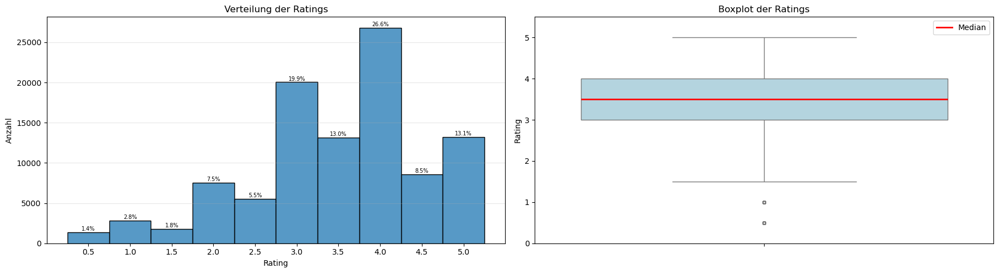

In [42]:
fig, axes = plt.subplots(1, 2, figsize=(18, 5))

# 1) Rating-Verteilung mit Prozent
sns.histplot(data=ratings, x='rating', bins=np.arange(0.25, 5.75, 0.5), ax=axes[0])
counts = ratings['rating'].value_counts().sort_index()
pct = (counts / len(ratings) * 100)
for i, p in enumerate(pct.values):
    axes[0].text(counts.index[i], counts.values[i] + 200, f'{p:.1f}%', ha='center', fontsize=7)
axes[0].set_title('Verteilung der Ratings')
axes[0].set_xlabel('Rating')
axes[0].set_ylabel('Anzahl')
axes[0].set_xticks(np.arange(0.5, 5.5, 0.5))
axes[0].grid(axis='y', alpha=0.3)

# 2) Boxplot
sns.boxplot(y=ratings['rating'], ax=axes[1], color='lightblue',
            medianprops=dict(color='red', linewidth=2),
            flierprops=dict(marker='o', markersize=4, alpha=0.5))
axes[1].set_title('Boxplot der Ratings')
axes[1].set_ylabel('Rating')
axes[1].set_ylim(0, 5.5)
axes[1].legend(handles=[
    Line2D([0], [0], color='red', linewidth=2, label='Median')
])

plt.tight_layout()
plt.show()

In [43]:
print("Rating")
print(ratings['rating'].describe())

Rating
count    100832.000000
mean          3.501567
std           1.042538
min           0.500000
25%           3.000000
50%           3.500000
75%           4.000000
max           5.000000
Name: rating, dtype: float64


In [44]:
rating_counts = ratings['rating'].value_counts().reset_index()
rating_counts.columns = ['rating', 'count']
rating_counts.insert(0, 'rank', range(1, len(rating_counts) + 1))
rating_counts

,rank,rating,count
0,1,4.0,26817
1,2,3.0,20047
2,3,5.0,13211
3,4,3.5,13134
4,5,4.5,8551
5,6,2.0,7550
6,7,2.5,5550
7,8,1.0,2811
8,9,1.5,1791
9,10,0.5,1370


Die Ratings gehen in 0.5-Schritten von 0.5 bis 5.0. Der Durchschnitt liegt bei 3.5 mit einer Standardabweichung von 1.0. Die Ratings sind klar linksschief verteilt; d.h. die User bewerten tendenziell grosszügiger. Ca. 48.2% der Ratings also fast die Hälfte befindet sich im Intervall [4.0, 5.0]. Dies liegt wohl an einem positiven Bias. Heisst, User bewerten Filme eher wenn sie diese mögen und lassen schlechte Filme aus, da sie diese gar nicht erst anschauen oder abbrechen und dann nicht bewerten.

#### f) Genre vs. Rating-Count

Wir berechnen die Anzahl Ratings, die jedes Genre erhalten hat.

In [45]:
movies_genre_explode = movies.assign(genre=movies['genres'].str.split('|')).explode('genre')
ratings_with_genre = ratings.merge(movies_genre_explode[['movieId', 'genre']], on='movieId')

ratings_per_genre = ratings_with_genre.groupby('genre').size().sort_values(ascending=False)
ratings_per_genre_pct = (ratings_per_genre / len(ratings_with_genre) * 100)

ratings_per_genre_df = ratings_per_genre.reset_index()
ratings_per_genre_df.columns = ['genre', 'n_ratings']
ratings_per_genre_df['pct'] = ratings_per_genre_pct.values.round(2)
ratings_per_genre_df.insert(0, 'rank', range(1, len(ratings_per_genre_df) + 1))
ratings_per_genre_df

,rank,genre,n_ratings,pct
0,1,Drama,41927,15.27
1,2,Comedy,39052,14.23
2,3,Action,30633,11.16
3,4,Thriller,26451,9.64
4,5,Adventure,24162,8.80
5,6,Romance,18138,6.61
6,7,Sci-Fi,17241,6.28
7,8,Crime,16680,6.08
8,9,Fantasy,11834,4.31
9,10,Children,9208,3.35


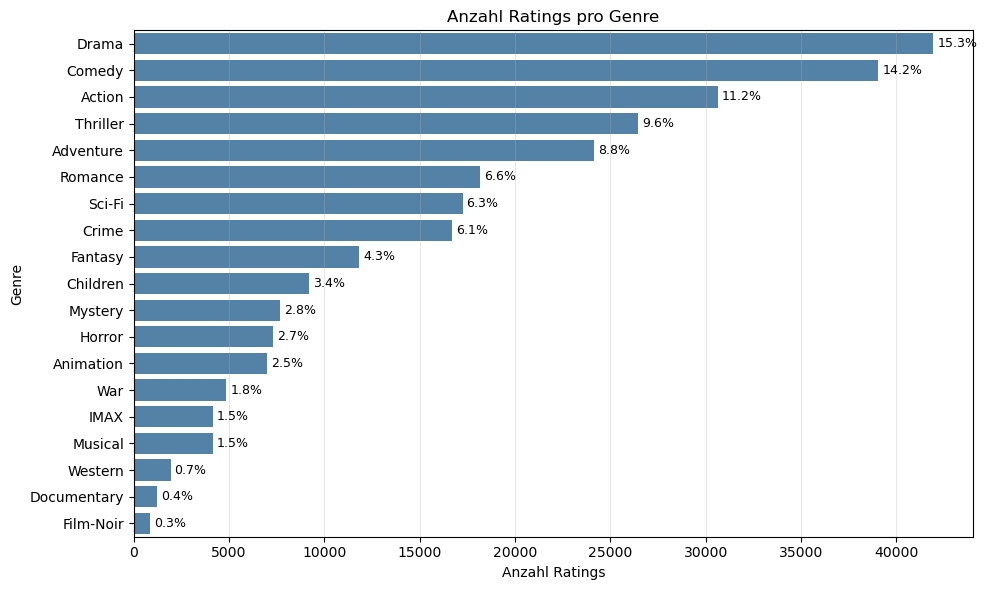

In [46]:
fig, ax = plt.subplots(figsize=(10, 6))
sns.barplot(x=ratings_per_genre.values, y=ratings_per_genre.index, ax=ax, color='steelblue')
for i, p in enumerate(ratings_per_genre_pct.values):
    ax.text(ratings_per_genre.values[i] + max(ratings_per_genre.values) * 0.005,
            i, f'{p:.1f}%', va='center', fontsize=9)
ax.set_title('Anzahl Ratings pro Genre')
ax.set_xlabel('Anzahl Ratings')
ax.set_ylabel('Genre')
ax.grid(axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

Drama und Comedy dominieren auch hier aber das Bild.

Hinweis: Filme ohne Genre (NaN) werden durch das `explode` automatisch herausgefiltert.

#### g) Sparsity URM

Die Sparsity der User-Rating-Matrix misst, wie leer die Matrix ist:

$$ \text{sparsity} = 1 - \frac{|\text{Ratings}|}{|U| \cdot |I|} $$

mit $|U|$ = Anzahl User, $|I|$ = Anzahl Movies, $|\text{Ratings}|$ = Anzahl tatsächlich vergebener Ratings. Eine Sparsity von 1 würde heissen, die Matrix ist vollständig leer; 0 würde heissen jeder User hat jeden Film bewertet.

In [47]:
n_users = ratings['userId'].nunique()
n_movies = ratings['movieId'].nunique()
n_ratings = len(ratings)
sparsity = 1 - (n_ratings / (n_users * n_movies))

print(f"Users: {n_users}, Movies: {n_movies}")
print(f"Possible entries: {n_users * n_movies:,}")
print(f"Actual ratings: {n_ratings:,}")
print(f"Sparsity: {sparsity:.4%}")

Users: 610, Movies: 9719
Possible entries: 5,928,590
Actual ratings: 100,832
Sparsity: 98.2992%


Wir verwenden für `n_movies` die unique movieIds aus dem Ratings-DF (= 9719). Wären wir vom Movies-DF ausgegangen (= 9737), hätten wir die 18 unbewerteten Filme mitgezählt. Diese sind aber leer und würden die Sparsity künstlich anheben. Wir haben eine sehr hohe Sparsity von 98.3%. Dies war vorhersehbar, da URM's meistens eine Sparsity über 90% haben.

#### h) User Amount rated how many movies?

Wir verschaffen uns zuerst einen groben Überblick.

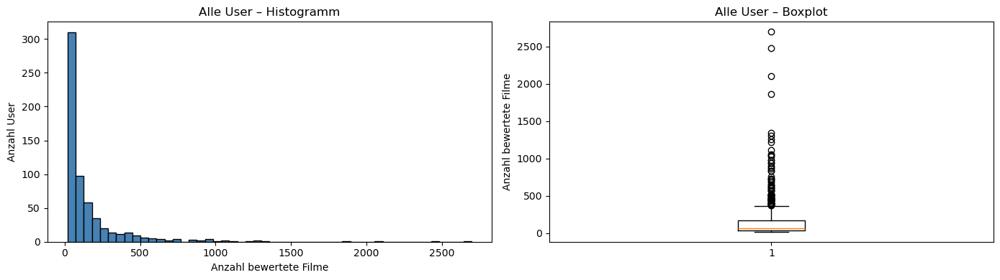

In [48]:
ratings_per_user = ratings.groupby('userId')['movieId'].count()

fig, axes = plt.subplots(1, 2, figsize=(14, 4))
axes[0].hist(ratings_per_user, bins=50, color='steelblue', edgecolor='black')
axes[0].set_title('Alle User – Histogramm')
axes[0].set_xlabel('Anzahl bewertete Filme')
axes[0].set_ylabel('Anzahl User')
axes[1].boxplot(ratings_per_user, vert=True)
axes[1].set_title('Alle User – Boxplot')
axes[1].set_ylabel('Anzahl bewertete Filme')
plt.tight_layout()
plt.show()

In [49]:
ratings_per_user.describe()

count     610.000000
mean      165.298361
std       269.466692
min        20.000000
25%        35.000000
50%        70.500000
75%       168.000000
max      2698.000000
Name: movieId, dtype: float64

Wir sehen eine stark rechtsschiefe Verteilung. Heisst also, dass die meisten User eher wenige Filme bewerten.

Der Mean liegt bei 165 Filmen und ein User bewertet minimum 20 Filme. Der Median liegt bei 70 Filmen pro User. Der Mean ist nicht Aussreisserfest. Die Superuser treiben den Mean viel höher als den Median. Es gibt einen Super-User, welcher 2698 Filme bewertet hat (!).

Wir schauen uns dies noch im Detail an. Wir wollen den unteren und oberen Teil der Datenverteilung des Means anschauen. Heisst als Grenze nehmen wir 165 Filme.

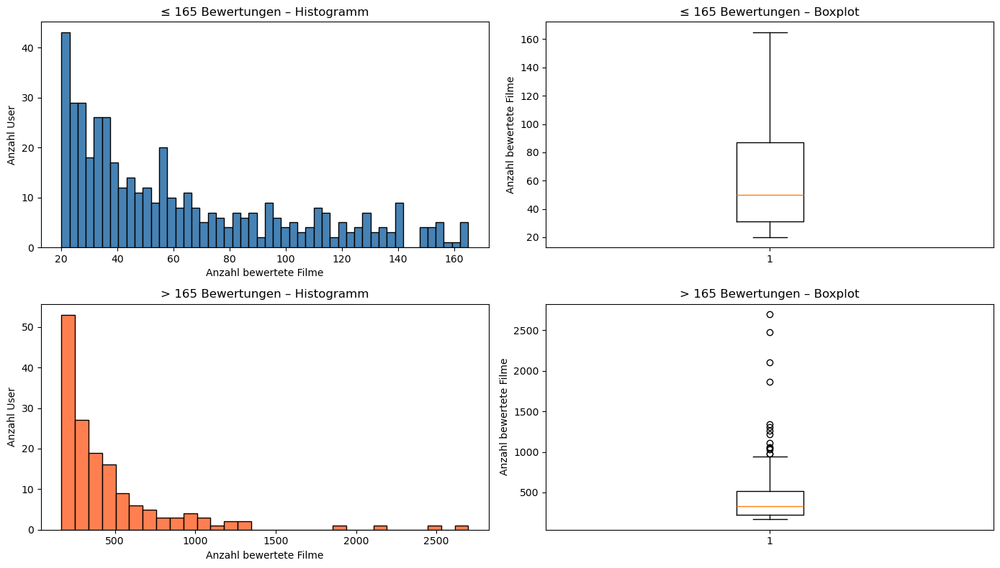

In [50]:
fig, axes = plt.subplots(2, 2, figsize=(14, 8))

below = ratings_per_user[ratings_per_user <= 165]
above = ratings_per_user[ratings_per_user > 165]

axes[0, 0].hist(below, bins=50, color='steelblue', edgecolor='black')
axes[0, 0].set_title('≤ 165 Bewertungen – Histogramm')
axes[0, 0].set_xlabel('Anzahl bewertete Filme')
axes[0, 0].set_ylabel('Anzahl User')

axes[0, 1].boxplot(below, vert=True)
axes[0, 1].set_title('≤ 165 Bewertungen – Boxplot')
axes[0, 1].set_ylabel('Anzahl bewertete Filme')

axes[1, 0].hist(above, bins=30, color='coral', edgecolor='black')
axes[1, 0].set_title('> 165 Bewertungen – Histogramm')
axes[1, 0].set_xlabel('Anzahl bewertete Filme')
axes[1, 0].set_ylabel('Anzahl User')

axes[1, 1].boxplot(above, vert=True)
axes[1, 1].set_title('> 165 Bewertungen – Boxplot')
axes[1, 1].set_ylabel('Anzahl bewertete Filme')

plt.tight_layout()
plt.show()

Wie erwartet, gibt es in der oberen Hälfte ab 165 viel mehr Ausreisser und die Daten sind auch auf ein viel grösseres Intervall gestreckt.

#### i) Rating vs. Months

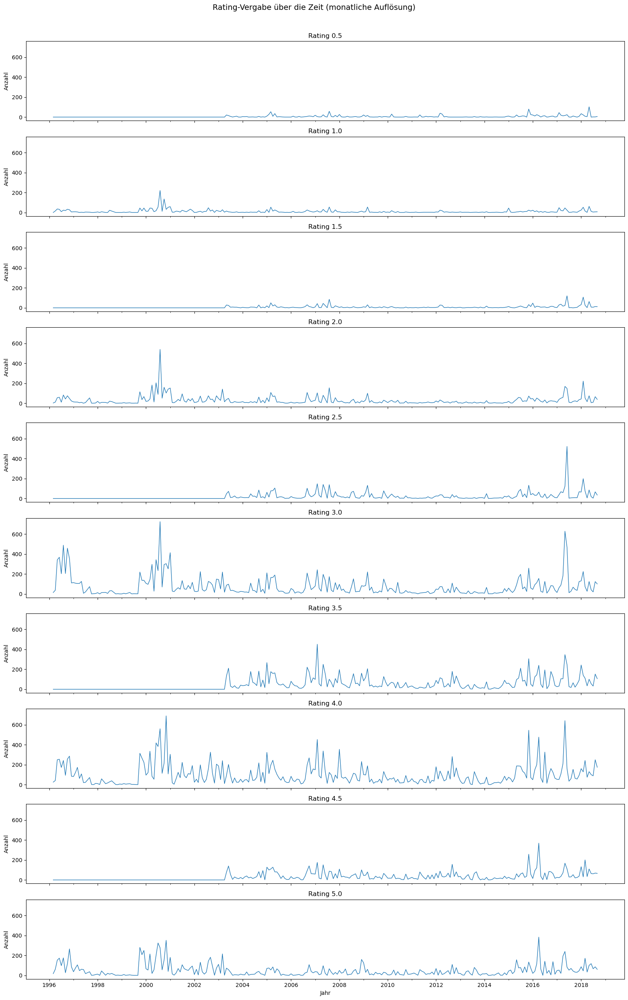

In [51]:
ratings['month'] = ratings['timestamp'].dt.to_period('M')
rating_over_time = ratings.groupby(['month', 'rating']).size().unstack(fill_value=0)
unique_ratings = sorted(ratings['rating'].unique())

# sharey=True, damit man die absoluten Häufigkeiten der Ratings (z.B. 4.0 hat
# rund 25× mehr Datenpunkte als 0.5) zwischen den Subplots vergleichen kann.
fig, axes = plt.subplots(len(unique_ratings), 1,
                          figsize=(16, 2.5 * len(unique_ratings)),
                          sharex=True, sharey=True)

for ax, r in zip(axes, unique_ratings):
    ax.plot(rating_over_time.index.to_timestamp(), rating_over_time[r], linewidth=1)
    ax.set_ylabel('Anzahl')
    ax.set_title(f'Rating {r}')

axes[-1].xaxis.set_major_locator(mdates.YearLocator(2))
axes[-1].xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
axes[-1].xaxis.set_minor_locator(mdates.YearLocator(1))
axes[-1].set_xlabel('Jahr')

fig.suptitle('Rating-Vergabe über die Zeit (monatliche Auflösung)', fontsize=14, y=1.01)
plt.tight_layout()
plt.show()

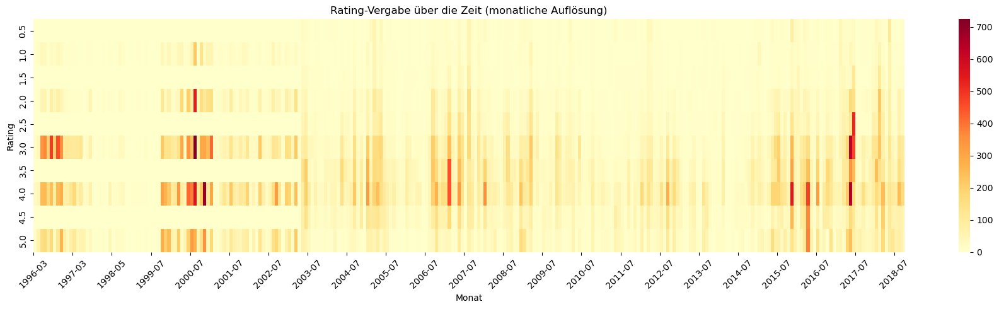

In [52]:
rating_over_time = ratings.groupby(['month', 'rating']).size().unstack(fill_value=0)

fig, ax = plt.subplots(figsize=(18, 5))
sns.heatmap(rating_over_time.T, cmap='YlOrRd', ax=ax)

ax.set_title('Rating-Vergabe über die Zeit (monatliche Auflösung)')
ax.set_xlabel('Monat')
ax.set_ylabel('Rating')

# X-Achse ausdünnen, sonst sind 200+ Labels unleserlich
xticks = range(0, len(rating_over_time), 12)
ax.set_xticks(list(xticks))
ax.set_xticklabels([str(rating_over_time.index[i]) for i in xticks], rotation=45)

plt.tight_layout()
plt.show()

Wir machen folgende spannende Beobachtungen:

- Ratings 0.5, 1.5, 2.5, 3.5, 4.5 erscheinen erst ab dem Jahr 2003. Das bedeuted, dass zwischen 1996 bis 2003 eine weniger hohe Granularität in der Rating-Skala verwendet wurde. Ab 2003 entschied man sich wohl diese zu erhöhen und Halbe-Schritte einzuführen.

- Die Intensität der Anzahl Bewertungen folgt häufig gleichzeitig (z.B. Heatmap 1999-2001). Sprich wenn weniger bewertet wird wird meist über alle Ratings weniger bewertet. Dies haben wir bereits in Aufgabe 1 a) festgestellt. Es hat fast einen Zyklus mit Abstand von 2-4 Jahren in den Daten.

- Aus der Heatmap können wir herauslesen, dass höhere Bewertungen generell intensiver sind bzw. häufiger vorkommen. Dies haben wir aber schon in Aufgabe a) festgestellt.

#### j) Rating per Genre

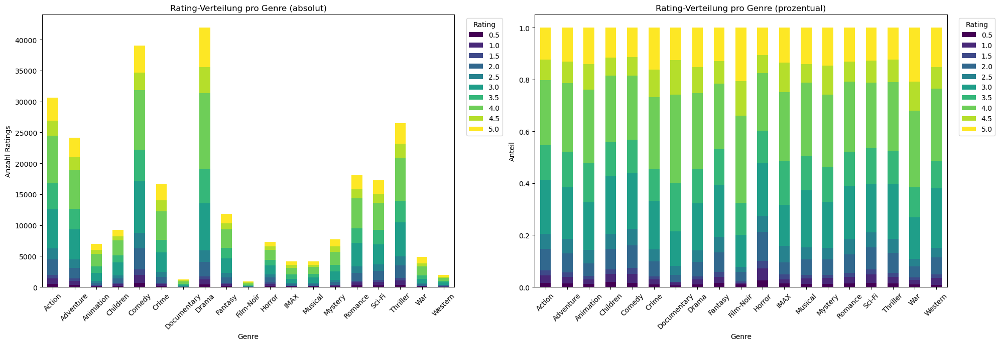

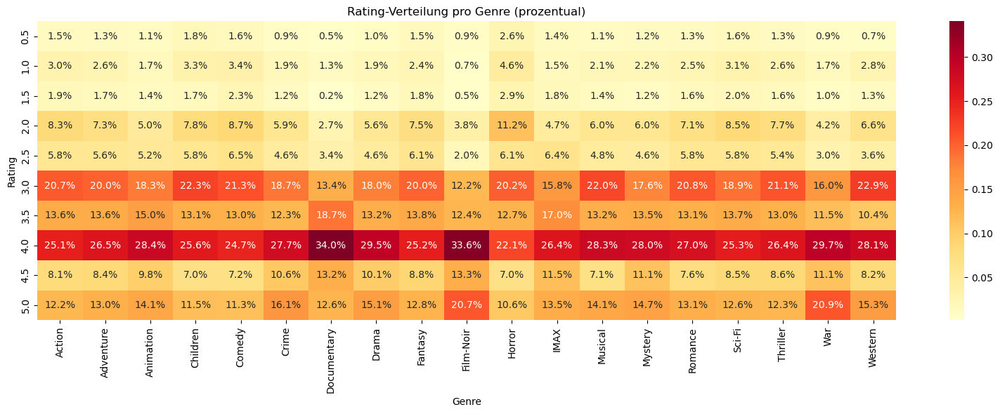

In [53]:
movies_exploded = movies.assign(genre=movies['genres'].str.split('|')).explode('genre')
ratings_genres = ratings.merge(movies_exploded[['movieId', 'genre']], on='movieId')

genre_rating_counts = ratings_genres.groupby(['genre', 'rating']).size().unstack(fill_value=0)
genre_rating_pct = genre_rating_counts.div(genre_rating_counts.sum(axis=1), axis=0)

# Zwei Balkenplots
fig, axes = plt.subplots(1, 2, figsize=(20, 7))

genre_rating_counts.plot(kind='bar', stacked=True, ax=axes[0], colormap='viridis')
axes[0].set_title('Rating-Verteilung pro Genre (absolut)')
axes[0].set_xlabel('Genre')
axes[0].set_ylabel('Anzahl Ratings')
axes[0].legend(title='Rating', bbox_to_anchor=(1.02, 1), loc='upper left')
axes[0].tick_params(axis='x', rotation=45)

genre_rating_pct.plot(kind='bar', stacked=True, ax=axes[1], colormap='viridis')
axes[1].set_title('Rating-Verteilung pro Genre (prozentual)')
axes[1].set_xlabel('Genre')
axes[1].set_ylabel('Anteil')
axes[1].legend(title='Rating', bbox_to_anchor=(1.02, 1), loc='upper left')
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

# Heatmap separat
fig, ax = plt.subplots(figsize=(16, 6))
sns.heatmap(genre_rating_pct.T, cmap='YlOrRd', annot=True, fmt='.1%', ax=ax)
ax.set_title('Rating-Verteilung pro Genre (prozentual)')
ax.set_xlabel('Genre')
ax.set_ylabel('Rating')
plt.tight_layout()
plt.show()

Auch hier wiederholt sich das Muster, dass Filme tendenziell grosszügiger bewertet werden. Aber es gibt doch einige Genres, welche entweder noch grosszügiger bewertet werden als üblich (z.B. Film-Noir) oder noch strenger (z.B. Horror).

#### k) Rating Distribution of 10 random movies

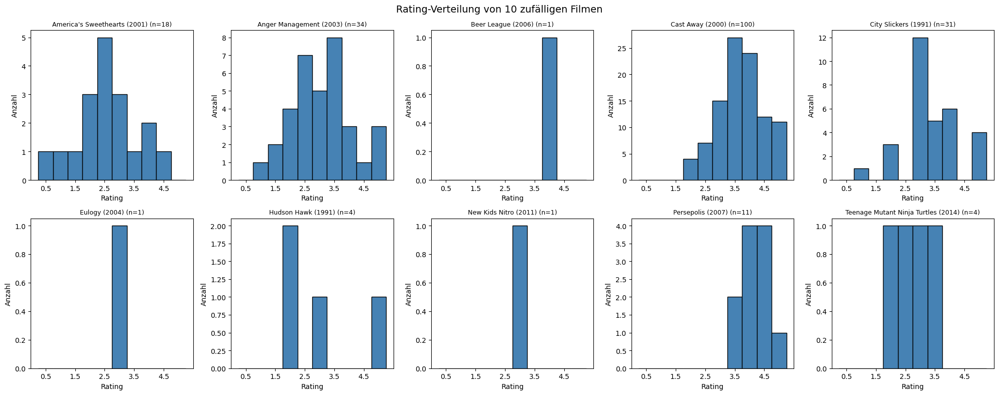

In [54]:
random_movies = movies.sample(10, random_state=42)
random_ratings = ratings[ratings['movieId'].isin(random_movies['movieId'])]
random_ratings = random_ratings.merge(random_movies[['movieId', 'title']], on='movieId')

fig, axes = plt.subplots(2, 5, figsize=(20, 8))

for ax, (title, group) in zip(axes.flatten(), random_ratings.groupby('title')):
    ax.hist(group['rating'], bins=np.arange(0.25, 5.75, 0.5), color='steelblue', edgecolor='black')
    ax.set_title(f'{title} (n={len(group)})', fontsize=9)
    ax.set_xlabel('Rating')
    ax.set_ylabel('Anzahl')
    ax.set_xticks(np.arange(0.5, 5.5, 1))

fig.suptitle('Rating-Verteilung von 10 zufälligen Filmen', fontsize=14)
plt.tight_layout()
plt.show()

Wir sehen ein typisches Grundproblem, nämlich zu wenige Ratings (sprich explizite Daten). Die Filme Beer League, New Kids Nitro, Eulogy leiden besonders darunter (n=1). Der Film Cast Away spiegelt das typische Muster der tendenziell grosszügigeren Bewertung wider (nämlich linksschiefe Verteilung; er hat auch einigermassen viele Bewertungen n=100). Es gibt jedoch auch "untypische" Muster wie Americas Sweethearts und Anger Management (sprich diese kamen wohl nicht so gut beim Publikum an; sie folgen fast einer Normalverteilung).

#### l) Rating Distribution of 3 movies I watched

Zuerst schauen wir ob meine Filme auch in den Daten vorkommen.

In [55]:
search = ['fear and loathing', 'godfather, The', 'ten commandments']
for s in search:
    matches = movies[movies['title'].str.contains(s, case=False, na=False)]
    print(f"\n'{s}':")
    print(matches[['movieId', 'title']].to_string(index=False))


'fear and loathing':
 movieId                                 title
    1884 Fear and Loathing in Las Vegas (1998)

'godfather, The':
 movieId                 title
     858 Godfather, The (1972)

'ten commandments':
 movieId                        title
    7386 Ten Commandments, The (1956)


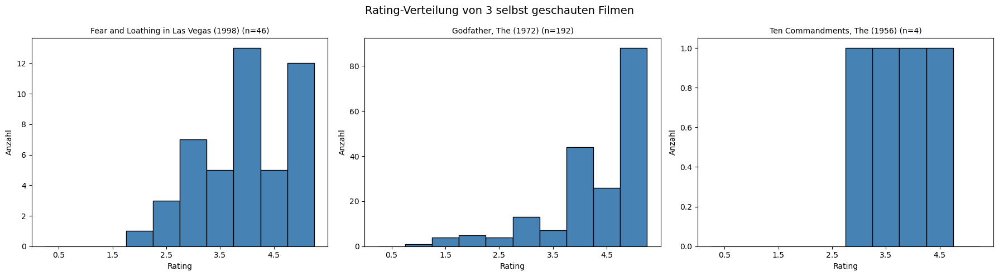

In [56]:
my_movies = {
    1884: 'Fear and Loathing in Las Vegas (1998)',
    858: 'Godfather, The (1972)',
    7386: 'Ten Commandments, The (1956)'
}

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for ax, (mid, title) in zip(axes, my_movies.items()):
    movie_ratings = ratings[ratings['movieId'] == mid]['rating']
    ax.hist(movie_ratings, bins=np.arange(0.25, 5.75, 0.5), color='steelblue', edgecolor='black')
    ax.set_title(f'{title} (n={len(movie_ratings)})', fontsize=10)
    ax.set_xlabel('Rating')
    ax.set_ylabel('Anzahl')
    ax.set_xticks(np.arange(0.5, 5.5, 1))

fig.suptitle('Rating-Verteilung von 3 selbst geschauten Filmen', fontsize=14)
plt.tight_layout()
plt.show()

Godfather kam sehr gut beim Publikum an. Fear and Loathing auch hat aber auch weniger Bewertungen deshalb fehlen hier sehr niedrige Bewertungen. Die zehn Gebote leidet unter wenigen Bewertungen (n=4).

#### m) How many Users give which average Rating

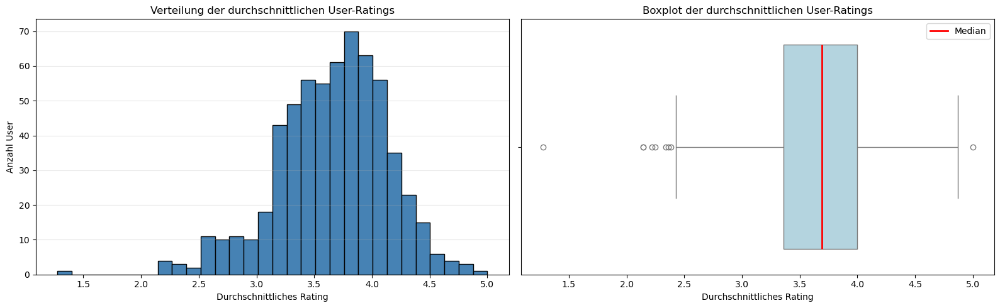

count    610.000000
mean       3.657220
std        0.480638
min        1.275000
25%        3.360000
50%        3.694385
75%        3.997500
max        5.000000
Name: rating, dtype: float64


In [57]:
user_avg = ratings.groupby('userId')['rating'].mean()

fig, axes = plt.subplots(1, 2, figsize=(16, 5))

# Histogramm
axes[0].hist(user_avg, bins=30, color='steelblue', edgecolor='black')
axes[0].set_title('Verteilung der durchschnittlichen User-Ratings')
axes[0].set_xlabel('Durchschnittliches Rating')
axes[0].set_ylabel('Anzahl User')
axes[0].grid(axis='y', alpha=0.3)

# Boxplot
sns.boxplot(x=user_avg, ax=axes[1], color='lightblue',
            medianprops=dict(color='red', linewidth=2))
axes[1].set_title('Boxplot der durchschnittlichen User-Ratings')
axes[1].set_xlabel('Durchschnittliches Rating')
axes[1].legend(handles=[
    Line2D([0], [0], color='red', linewidth=2, label='Median')
])

plt.tight_layout()
plt.show()

print(user_avg.describe())

Hier sehen wir, dass die Verteilung doch sehr linksschief ist. Also die User durchschnittlich eher positiv bewerten. Es gibt wenige User, welche durchschnittlich schlecht bewerten (z.B. unter 2.5). Der Median liegt bei ca. 3.7. Wir haben einen User, welcher durchschnittlich sehr schlecht bewertet (1.275). Evtl. folgt dieser User nicht der Regel, dass man eher Filme bewertet welche man gut findet sondern genau das Gegenteil (oder mag Filme allgemein nicht).

#### n) How often a movie was rated as a function of average rating

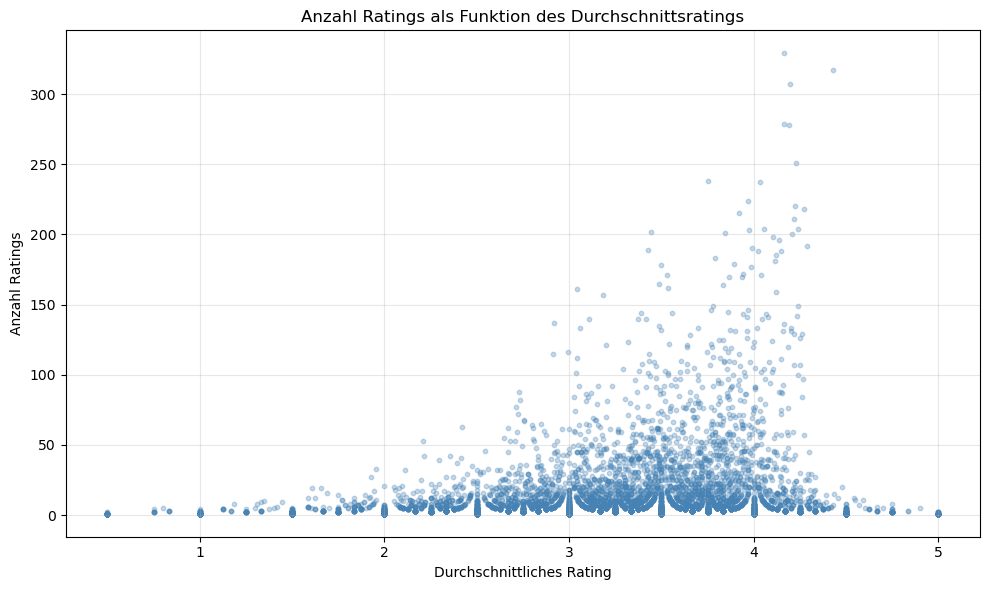

In [58]:
movie_stats = ratings.groupby('movieId')['rating'].agg(['mean', 'count']).reset_index()

fig, ax = plt.subplots(figsize=(10, 6))
ax.scatter(movie_stats['mean'], movie_stats['count'], alpha=0.3, s=10, color='steelblue')
ax.set_title('Anzahl Ratings als Funktion des Durchschnittsratings')
ax.set_xlabel('Durchschnittliches Rating')
ax.set_ylabel('Anzahl Ratings')
ax.grid(alpha=0.3)
plt.tight_layout()
plt.show()

Filme mit sehr wenigen Ratings streuen über die gesamte Skala. Wir sehen aber auch, dass je mehr Ratings ein Film hat, desto stärker konzentriert sich das Durchschnittsrating im Bereich 3.0–4.5. Der Positive Bias (in obigen Aufgaben angesprochen) zeigt sich darin, dass ab Rating 3 bis ca. 4.5 die meisten populären Filme liegen (mit vielen Bewrertungen).


#### o) Heatmap User Item Matrix

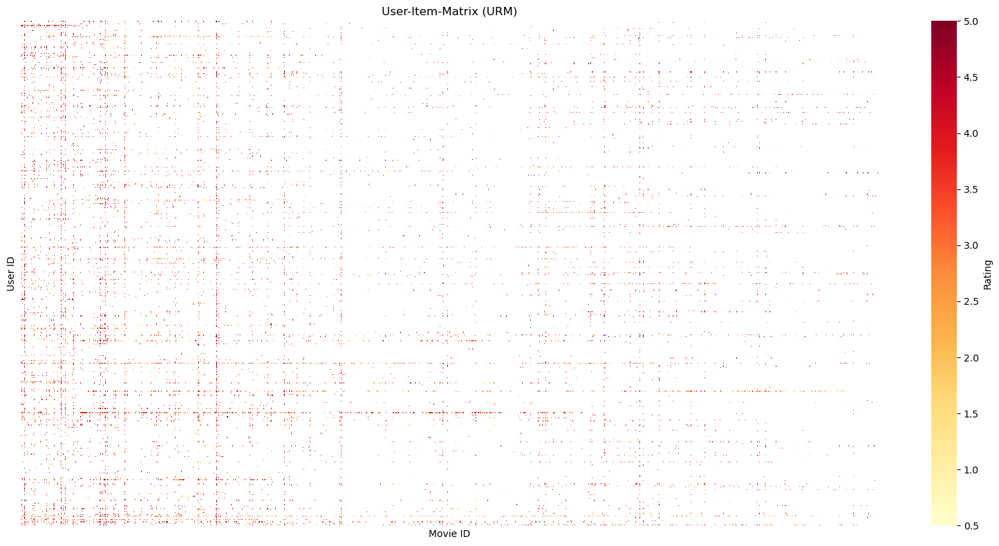

In [59]:
urm = ratings.pivot_table(index='userId', columns='movieId', values='rating')

fig, ax = plt.subplots(figsize=(16, 8))
sns.heatmap(urm, cmap='YlOrRd', ax=ax, cbar_kws={'label': 'Rating'})
ax.set_title('User-Item-Matrix (URM)')
ax.set_xlabel('Movie ID')
ax.set_ylabel('User ID')
ax.set_xticks([])
ax.set_yticks([])
plt.tight_layout()
plt.show()

Hier sehen wir die URM visualisiert. Einzelne Werte (bzw. Zeilen für User oder Spalten für Filme) können wir so natürlich nicht interpretieren wegen der grosse Dimension. Der Plot zeigt uns jedoch schön auf wie gross die Sparsity der Matrix ist (viel Weiss).

#### p) Heatmap User Item Matrix for 100 most rated movies for 50 users with most ratings

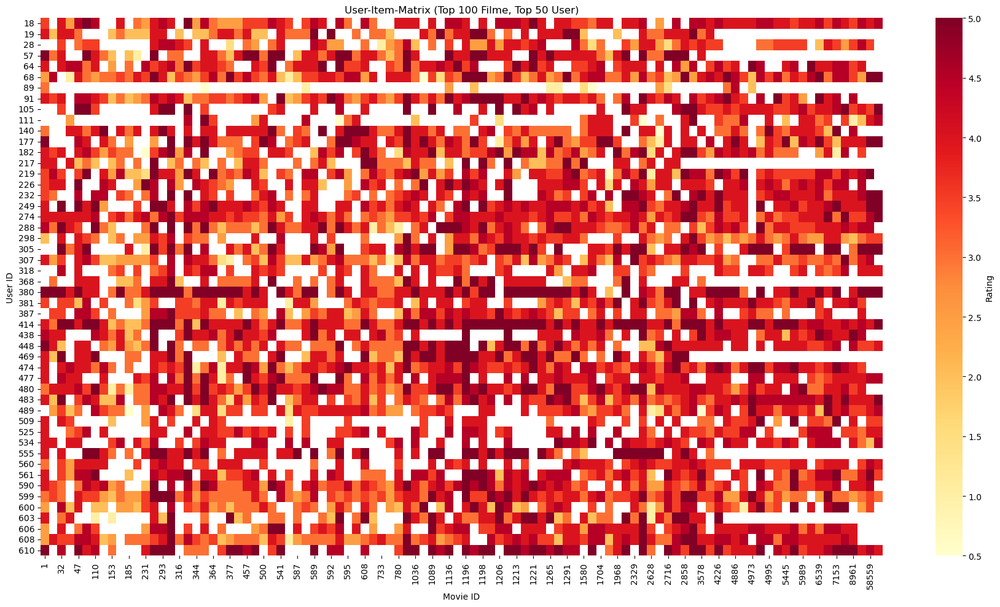

In [60]:
top100_movies = ratings['movieId'].value_counts().head(100).index
top50_users = ratings['userId'].value_counts().head(50).index

urm_subset = ratings[
    ratings['movieId'].isin(top100_movies) & ratings['userId'].isin(top50_users)
].pivot_table(index='userId', columns='movieId', values='rating')

fig, ax = plt.subplots(figsize=(18, 10))
sns.heatmap(urm_subset, cmap='YlOrRd', ax=ax, cbar_kws={'label': 'Rating'})
ax.set_title('User-Item-Matrix (Top 100 Filme, Top 50 User)')
ax.set_xlabel('Movie ID')
ax.set_ylabel('User ID')
plt.tight_layout()
plt.show()

Nun sehen wir einen Teilausschnitt der URM, nämlich eine 50x100-Matrix. Die Sparsity ist schon viel tiefer, da wir die Top 50 fleissigsten User und Top 100 meist bewerteste Filme anschauen. Wir sehen auch hier, dass die Heatmap sehr rot ist. D.h. die User bewerten wieder tendenziell höher.

Aus Interesse berechnen wir noch kurz die Sparsity dieser Submatrix.

In [61]:
sparsity_subset = urm_subset.isna().sum().sum() / (urm_subset.shape[0] * urm_subset.shape[1])
print(f"Sparsity Subset (Top 50 User, Top 100 Filme): {sparsity_subset:.4%}")

Sparsity Subset (Top 50 User, Top 100 Filme): 27.2600%


Die Sparsity der Sub-Matrix beträgt lediglich 27.3% (im Gegensatz zur ganzen URM von 98.3%). Wie schon visuell bestätigt ist die Sparsity also viel niedriger (rund 71 Prozentpunkte tiefer bzw. ~72% relativer Rückgang).

### Exercise 2 - Building a baseline RS (7 points)
In this exercise we will build a baseline RS and functions to calculate fundamental performance metrics. 

Build the following baseline RS to predict Top-N (default N=20):
1. In reference to the book *Collaborative Filtering Recommender Systems by Michael D. Ekstrand, John T. Riedl and Joseph A. Konstan* (p. 91ff) implement the baseline predictor $$ b_{u,i}= \mu +b_u +b_i $$ with the regularized user and item average offsets: $$ b_u = \frac{1}{|I_u| + \beta_u} \sum_{i \in I_u} (r_{u,i} - \mu) $$ and $$ b_i = \frac{1}{|U_i| + \beta_i} \sum_{u \in U_i} (r_{u,i} - b_u - \mu) . $$ Build a recommender system upon this baseline predictor. Set the default damping factors $\beta_u$ and $\beta_i$ both to 20.
2. Build a RS that recommends based on *random* recommendations.  

Output the recommendations for three example users (Ids 1, 3 and 7) and the default parameters. Give the titles of the recommended movies and their predicted scores not just their Ids.

#### 1

In [62]:
def train_baseline(ratings, beta_u=20, beta_i=20):
    """Trainiert den Baseline-Predictor: b_u,i = μ + b_u + b_i.

    Parameters
    ----------
    ratings : pd.DataFrame mit Spalten userId, movieId, rating.
    beta_u, beta_i : Regularisierungsparameter (Shrinkage) für User- bzw. Item-Bias.
        Höher = stärkere Regularisierung gegen den globalen Mittelwert.

    Returns
    -------
    mu : globaler Rating-Durchschnitt (float).
    user_bias : dict {userId: b_u}.
    item_bias : dict {movieId: b_i}.
    """

    # Schritt 1: Globaler Durchschnitt
    mu = ratings['rating'].mean()

    # Schritt 2: User Bias b_u
    user_bias = {}  # In diesem Dic werden alle user biases gespeichert (z.B. 1: +0.3, etc.)
    for uid, group in ratings.groupby('userId'):  # Gibt userID und DF mit dessen Zeilen zurück
        diff = group['rating'] - mu
        user_bias[uid] = diff.sum() / (len(group) + beta_u)

    # Schritt 3: Item Bias b_i
    item_bias = {}
    for mid, group in ratings.groupby('movieId'):
        # Appliziert die Funktion rowwise auf die Group; holt row rating aus Zeile und user bias
        diff = group.apply(lambda row: row['rating'] - mu - user_bias[row['userId']], axis=1)
        item_bias[mid] = diff.sum() / (len(group) + beta_i)

    return mu, user_bias, item_bias

In [63]:
def predict_top_n(user_id, mu, user_bias, item_bias,
                  all_movie_ids, seen_movies=None, ratings=None, N=20):
    """Top-N Empfehlungen für einen User basierend auf der Baseline.

    Parameters
    ----------
    user_id : int.
    mu, user_bias, item_bias : Output von train_baseline.
    all_movie_ids : Set aller Movie-IDs im Empfehlungs-Katalog.
    seen_movies : Set bereits bewerteter Filme (wird ausgeschlossen). Wenn None,
        aus ratings berechnet.
    ratings : pd.DataFrame, nur nötig falls seen_movies None ist.
    N : Anzahl Empfehlungen.

    Returns
    -------
    Liste von (movieId, predicted_score)-Tupeln, sortiert nach Score absteigend.
    """
    if seen_movies is None:
        seen_movies = set(ratings[ratings['userId'] == user_id]['movieId'])
    unseen = all_movie_ids - seen_movies
    bu = user_bias.get(user_id, 0)
    predictions = [(mid, mu + bu + item_bias.get(mid, 0)) for mid in unseen]
    predictions.sort(key=lambda x: x[1], reverse=True)
    return predictions[:N]

In [64]:
mu, user_bias, item_bias = train_baseline(ratings)
all_movie_ids = set(ratings['movieId'])
rating_counts = ratings.groupby('movieId').size().to_dict()

print(f"Globaler Durchschnitt μ = {mu:.2f}, β_u = 20, β_i = 20, N = 20\n")

for uid in [1, 3, 7]:
    n_ratings = len(ratings[ratings['userId'] == uid])
    top_n = predict_top_n(uid, mu, user_bias, item_bias,
                          all_movie_ids, ratings=ratings)
    top_df = pd.DataFrame(top_n, columns=['movieId', 'predicted_score'])
    top_df = top_df.merge(movies[['movieId', 'title']], on='movieId')
    top_df.insert(0, 'rank', range(1, len(top_df) + 1))
    top_df['b_i'] = top_df['movieId'].map(item_bias)
    top_df['n_ratings'] = top_df['movieId'].map(rating_counts)
    
    print(f"=== User {uid} (b_u = {user_bias[uid]:+.2f}, Anzahl Ratings: {n_ratings}) ===")
    display(top_df[['rank', 'movieId', 'title', 'b_i', 'n_ratings', 'predicted_score']].round(2))
    print()

Globaler Durchschnitt μ = 3.50, β_u = 20, β_i = 20, N = 20

=== User 1 (b_u = +0.80, Anzahl Ratings: 232) ===


,rank,movieId,title,b_i,n_ratings,predicted_score
0,1,318,"Shawshank Redemption, The (1994)",0.73,317,5.03
1,2,858,"Godfather, The (1972)",0.58,192,4.88
2,3,750,Dr. Strangelove or: How I Learned to Stop Worr...,0.58,97,4.88
3,4,1204,Lawrence of Arabia (1962),0.55,45,4.85
4,5,904,Rear Window (1954),0.53,84,4.83
5,6,1221,"Godfather: Part II, The (1974)",0.53,129,4.83
6,7,912,Casablanca (1942),0.52,100,4.82
7,8,58559,"Dark Knight, The (2008)",0.52,149,4.81
8,9,7361,Eternal Sunshine of the Spotless Mind (2004),0.49,131,4.79
9,10,48516,"Departed, The (2006)",0.49,107,4.79



=== User 3 (b_u = -0.70, Anzahl Ratings: 39) ===


,rank,movieId,title,b_i,n_ratings,predicted_score
0,1,318,"Shawshank Redemption, The (1994)",0.73,317,3.53
1,2,50,"Usual Suspects, The (1995)",0.59,204,3.39
2,3,858,"Godfather, The (1972)",0.58,192,3.38
3,4,2959,Fight Club (1999),0.58,218,3.38
4,5,750,Dr. Strangelove or: How I Learned to Stop Worr...,0.58,97,3.38
5,6,260,Star Wars: Episode IV - A New Hope (1977),0.57,251,3.37
6,7,1197,"Princess Bride, The (1987)",0.55,142,3.35
7,8,1204,Lawrence of Arabia (1962),0.55,45,3.35
8,9,1196,Star Wars: Episode V - The Empire Strikes Back...,0.55,211,3.35
9,10,296,Pulp Fiction (1994),0.55,307,3.35



=== User 7 (b_u = -0.24, Anzahl Ratings: 152) ===


,rank,movieId,title,b_i,n_ratings,predicted_score
0,1,318,"Shawshank Redemption, The (1994)",0.73,317,4.00
1,2,858,"Godfather, The (1972)",0.58,192,3.85
2,3,2959,Fight Club (1999),0.58,218,3.84
3,4,1197,"Princess Bride, The (1987)",0.55,142,3.81
4,5,1204,Lawrence of Arabia (1962),0.55,45,3.81
5,6,296,Pulp Fiction (1994),0.55,307,3.81
6,7,1198,Raiders of the Lost Ark (Indiana Jones and the...,0.54,200,3.81
7,8,904,Rear Window (1954),0.53,84,3.79
8,9,527,Schindler's List (1993),0.53,220,3.79
9,10,1221,"Godfather: Part II, The (1974)",0.53,129,3.79


Wir sehen bei User 1 Filme mit Predicted Scores von 4.75 bis 5.03. Die Prediction von 5.03 sprengt unsere 5-er Skala. Dies liegt daran, dass wir den gültigen Bereich nicht definiert haben. Es ist mathematisch möglich, dass ein User mit einem hohen User Bias einen Film mit hohem Item Bias über der Skala von 5 bewertet. Natürlich macht dies keinen Sinn und sollte nicht verwendet werden sobald wir den genauen Wert benötigen, wie z.B. bei der Evaluierung mittels einer Prediction Accuracy wie RMSE. Für die Erstellung einer Rangliste ist es jedoch nicht schlimm da wir die relative Reihenfolge benötigen. Es ist eigentlich sogar gewünscht. Wenn wir alle Ratings >= 5 einfach auf 5 clampen würden, dann würden wir die Unterscheidbarkeit verlieren (ein Film mit 5.2 ist immer noch besser als ein Film mit 5.1 bspw.). Wir lassen dies so, da wir schauen wollen ob es evtl. sehr hohe Scores geben kann und so für die Rangliste relevant ist. 

Der User 1 hat auch sehr viele Ratings (232). Somit ist sein User-Bias sehr stabil (da der Damping Factor einen kleinen Einfluss hat) und somit auch die Prediction (heisst diese würde sich nicht so stark verändern wenn neue Ratings dazukommen).  Auf die Prediction Metriken könnte dies aber einen Einfluss haben (MAE/RMSE). Wir werden dies später adressieren wenn wir einzelne Prediction erstellen.

Die anderen beiden User (User Bias -0.7 und -0.24) erhalten tendenziell tiefere Scores zwischen 3.31 bis 4.00. Sie haben auch tiefere User Biases. Zudem haben sie beide weniger Ratings (v.a. User 3 mit nur 39 ratings; hier hat der Damping Factor einen grossen Einfluss auf den User Bias und somit auf die Stabilität der Prediction).


Das Baseline ist im Ranking nicht personalisiert. Heisst die Prediction $\hat{r}_{u,i} = \mu + b_u + b_i$ besteht aus einem user-spezifischen Term ($\mu + b_u$, konstant über alle Filme) und einem item-spezifischen Term ($b_i$). Sortiert man die ungesehenen Filme pro User absteigend nach $\hat{r}_{u,i}$, ist die Reihenfolge ausschliesslich durch $b_i$ bestimmt. Heisst der user-spezifische Anteil verschiebt nur die Skala, nicht die Reihenfolge. Damit produziert der Baseline für alle User die identische Rangliste. Die Listen unterscheiden sich oben nur deshalb, weil unterschiedliche Filme schon gesehen (und daher gefiltert) sind.

#### 2

In [65]:
def random_rs(user_id, ratings, movies, N=20, random_state=None):
    """Empfiehlt N zufällige ungesehene Filme (naivste Baseline).

    Parameters
    ----------
    user_id : int.
    ratings : pd.DataFrame; dient sowohl zur Bestimmung der gesehenen Filme
        als auch des Empfehlungs-Katalogs (alle bewerteten movieIds).
    movies : pd.DataFrame; aus Konsistenz mit anderen RS-Signaturen mitgeführt,
        aktuell nicht verwendet.
    N : Anzahl Empfehlungen.
    random_state : int oder None für Reproduzierbarkeit.

    Returns
    -------
    Liste von (movieId, np.nan)-Tupeln (kein numerischer Score).
    """
    seen = set(ratings[ratings['userId'] == user_id]['movieId'])
    unseen = list(set(ratings['movieId']) - seen)

    rng = np.random.default_rng(random_state)
    selected = rng.choice(unseen, size=min(N, len(unseen)), replace=False)

    return [(mid, np.nan) for mid in selected]

In [66]:
print("=== Random RS (N = 20) ===\n")

for uid in [1, 3, 7]:
    n_ratings = len(ratings[ratings['userId'] == uid])
    top_n = random_rs(uid, ratings, movies, random_state=42)
    top_df = pd.DataFrame(top_n, columns=['movieId', 'predicted_score'])
    top_df = top_df.merge(movies[['movieId', 'title']], on='movieId')
    top_df.insert(0, 'rank', range(1, len(top_df) + 1))
    
    print(f"=== User {uid} (Anzahl Ratings: {n_ratings}) ===")
    display(top_df[['rank', 'movieId', 'title']])
    print()

=== Random RS (N = 20) ===

=== User 1 (Anzahl Ratings: 232) ===


,rank,movieId,title
0,1,50800,"Messengers, The (2007)"
1,2,112070,Maps to the Stars (2014)
2,3,2447,Varsity Blues (1999)
3,4,64010,"Children, The (2008)"
4,5,4612,Jesus of Montreal (Jésus de Montréal) (1989)
5,6,49688,"Dam Busters, The (1955)"
6,7,1551,Buddy (1997)
7,8,33815,"Perfect Man, The (2005)"
8,9,107338,Dampfnudelblues (2013)
9,10,6442,Belle époque (1992)



=== User 3 (Anzahl Ratings: 39) ===


,rank,movieId,title
0,1,148652,The Ridiculous 6 (2015)
1,2,78836,Enter the Void (2009)
2,3,2339,I'll Be Home For Christmas (1998)
3,4,31221,Elektra (2005)
4,5,134808,No Way Jose (2015)
5,6,49265,Shooting Dogs (a.k.a. Beyond the Gates) (2005)
6,7,1458,Touch (1997)
7,8,1013,"Parent Trap, The (1961)"
8,9,8920,"Country Girl, The (1954)"
9,10,6286,"Man Without a Past, The (Mies vailla menneisyy..."



=== User 7 (Anzahl Ratings: 152) ===


,rank,movieId,title
0,1,133798,Hot Pursuit (2015)
1,2,111759,Edge of Tomorrow (2014)
2,3,2344,Runaway Train (1985)
3,4,31193,"Many Adventures of Winnie the Pooh, The (1977)"
4,5,55805,Before the Devil Knows You're Dead (2007)
5,6,82152,Beastly (2011)
6,7,1466,Donnie Brasco (1997)
7,8,1019,"20,000 Leagues Under the Sea (1954)"
8,9,8943,Being Julia (2004)
9,10,6291,Lilya 4-Ever (Lilja 4-ever) (2002)


Hier gibt es eigentlich nicht viel zu analysieren. Das Random modell nimmt einfach von den ungesehenen Filmen zufällig 20 Stk. Das Baseline Modell und das Random dienen eigentlich lediglich als untere Vergleichsgrenzen für Personalisierung.

### Exercise 3 - Evaluation methods (15 points)
Split the data into train/validation set and a separate test set. This test set shall contain the first 20% of the users and shall not be used at all before exercise 10. With the remaining 80% do the following: 
Implement a function to partition your dataset for an offline evaluation based on holding out of random users with 5x cross validation with a 80/20 train/validation split. Within the validation set implement a masking with *all but n* approach. 
See page 2942 of https://jmlr.csail.mit.edu/papers/volume10/gunawardana09a/gunawardana09a.pdf for details on this approach. 

Choose the number of masked items n reasonably and explain your considerations.

Implement functions to calculate the following metrics:
- *Mean Absolute Error (MAE)* 
- *Root Mean Square Error (RMSE)*
- *Precision@N* with default $N=5$ and relevance threshold 4.0 stars.
- *Recall@N* with default $N=5$ and relevance threshold 4.0 stars.
- *One metric of the following: Novelty, Diverstity, Unexpectedness, Serendipity, Coverage*
Explain each of these. How does the relevance threshold influence the metrics? How would you choose this parameter?

Note: For *precision@N* and *Recall@N* use the definitions from https://medium.com/@m_n_malaeb/recall-and-precision-at-k-for-recommender-systems-618483226c54 with one exception: In case of the denominator being zero, set the metric to 0. 

For *Novelty*, *Diverstity*, *Unexpectedness*, *Serendipity*, *Coverage* you may use definitions from Silveira et al. https://link.springer.com/article/10.1007/s13042-017-0762-9 

#### Train/Test-Split

Wichtige Info zur Verwendung des Test-Sets in den Demos der Aufgaben: Die Aufgabenstellungen verlangen immer wieder, dass das Test-Set bis Aufgabe 10 unangetastet bleibt. Gleichzeitig fordern gewisse Aufgaben explizit Empfehlungen für die User 1, 3, 7 . Diese liegen aber alle im Test-Set. Wir lösen das pragmatisch. Für die Demo werden in den jeweiligen Aufgaben die vollen Ratings verwendet (sonst wären die Test-User reine Cold-Start-User). Für jede quantitative Auswertung (wie CV) wird strikt nur `train_ratings` verwendet. Die finale Test-Set-Evaluation in Aufgabe 10 nutzt das Test-Set damit zum ersten Mal als unabhängigen Bewertungsmassstab.

In [67]:
all_user_ids = sorted(ratings['userId'].unique())
n_test_users = int(len(all_user_ids) * 0.2)
test_user_ids = all_user_ids[:n_test_users]
train_user_ids = all_user_ids[n_test_users:]

test_ratings = ratings[ratings['userId'].isin(test_user_ids)]
train_ratings = ratings[ratings['userId'].isin(train_user_ids)]

print(f"Total User: {len(all_user_ids)}")
print(f"Test User: {len(test_user_ids)} (IDs {test_user_ids[0]}–{test_user_ids[-1]})")
print(f"Train User: {len(train_user_ids)} (IDs {train_user_ids[0]}–{train_user_ids[-1]})")
print(f"\nTest Ratings: {len(test_ratings)}")
print(f"Train Ratings: {len(train_ratings)}")

Total User: 610
Test User: 122 (IDs 1–122)
Train User: 488 (IDs 123–610)

Test Ratings: 19120
Train Ratings: 81712


In [68]:
train_ratings.head()

,userId,movieId,rating,timestamp,month
66719,429,595,5.0,1996-03-29 18:36:55,1996-03
66716,429,588,5.0,1996-03-29 18:36:55,1996-03
66717,429,590,5.0,1996-03-29 18:36:55,1996-03
66718,429,592,5.0,1996-03-29 18:36:55,1996-03
66712,429,432,3.0,1996-03-29 18:36:55,1996-03


#### CV functions

Wir definieren nun den CV-Split. Als n (masked items) nehmen wir 5. In Aufgabe 1 h) haben wir gesehen, dass jeder User mind. 20 Filme bewertet hat. Dies ist also unsere Untergrenze. Bei 5 maskierten Items behalten wir also mindestens 15 sichtbare Ratings pro user. Dies entspricht 75%. Das sollte für die Berechnung der beiden Biases reichen. Weniger als 5 Items zu maskieren macht nicht viel Sinn, da sonst die Precision und Recall der Ranking Accuracies zu wenige Granularität aufweisen würden. Hätten wir z.B. n=1 dann hätten wir max. 1 Item, welches als relevant eingestuft werden könnte bei eine Liste von N=5. Dann wäre die Precision entweder 0 (0/5) oder 0.2 (1/5). Bei n=5 können wir Werte haben (in 0.2 Schritten) von 0 bis 1.

In der Funktion sollten wir noch berücksichtigen, dass wir in Zukunft einen Datensatz einfliessen lassen, welcher User hat die evtl. sehr wenige Ratings haben. Momentan sind es mind. 20 Ratings und dies ist in Ordnung. Zur Sicherheit implementieren wir aber dass ein User übersprungen wird wenn die Anzahl Ratings <= der maskierten Elemente ist.

In [69]:
def cross_validation_split(train_ratings, k_folds=5, n_masked=5, random_state=42):
    """
    5-fache Cross Validation mit All-but-n Masking.
    Gibt pro Fold ein Tupel (cv_train, cv_val_visible, cv_val_masked) zurück.
    """
    rng = np.random.default_rng(random_state)
    user_ids = train_ratings['userId'].unique().copy()
    rng.shuffle(user_ids)
    
    folds = np.array_split(user_ids, k_folds)
    splits = []
    
    for i in range(k_folds):
        val_users = set(folds[i].tolist())
        train_users = set()
        for j in range(k_folds):
            if j != i:
                train_users.update(folds[j].tolist())
        
        cv_train = train_ratings[train_ratings['userId'].isin(train_users)]
        cv_val_ratings = train_ratings[train_ratings['userId'].isin(val_users)]
        
        val_visible_list = []
        val_masked_list = []
        
        for uid in val_users:
            user_ratings = cv_val_ratings[cv_val_ratings['userId'] == uid]
            
            if len(user_ratings) <= n_masked: # Zur Sicherheit falls zu wenige Ratings
                val_visible_list.append(user_ratings)
                continue
            
            masked_idx = rng.choice(user_ratings.index, size=n_masked, replace=False)
            val_masked_list.append(user_ratings.loc[masked_idx])
            val_visible_list.append(user_ratings.drop(masked_idx))
        
        cv_val_visible = pd.concat(val_visible_list, ignore_index=True)
        cv_val_masked = pd.concat(val_masked_list, ignore_index=True) if val_masked_list else pd.DataFrame()
        
        splits.append((cv_train, cv_val_visible, cv_val_masked))
    
    return splits

Wir prüfen kurz ob die Logik der CV-Funktion klappt.

In [70]:
splits = cross_validation_split(train_ratings)
print(f"Train Ratings: {len(train_ratings)} Zeilen, {train_ratings['userId'].nunique()} User\n")
for i, (cv_train, cv_val_vis, cv_val_mask) in enumerate(splits):
    print(f"Fold {i+1}: CV-Train={len(cv_train)} ({cv_train['userId'].nunique()} User), "
          f"CV-Val sichtbar={len(cv_val_vis)} ({cv_val_vis['userId'].nunique()} User), "
          f"CV-Val maskiert={len(cv_val_mask)} ({cv_val_mask['userId'].nunique()} User)")

min_ratings = train_ratings.groupby('userId').size().min()
print(f"\nMinimum Ratings pro User: {min_ratings}, n_masked = 5 → Edge Case (≤ n_masked) tritt nicht ein")

Train Ratings: 81712 Zeilen, 488 User

Fold 1: CV-Train=66160 (390 User), CV-Val sichtbar=15062 (98 User), CV-Val maskiert=490 (98 User)
Fold 2: CV-Train=65962 (390 User), CV-Val sichtbar=15260 (98 User), CV-Val maskiert=490 (98 User)
Fold 3: CV-Train=62243 (390 User), CV-Val sichtbar=18979 (98 User), CV-Val maskiert=490 (98 User)
Fold 4: CV-Train=64767 (391 User), CV-Val sichtbar=16460 (97 User), CV-Val maskiert=485 (97 User)
Fold 5: CV-Train=67716 (391 User), CV-Val sichtbar=13511 (97 User), CV-Val maskiert=485 (97 User)

Minimum Ratings pro User: 20, n_masked = 5 → Edge Case (≤ n_masked) tritt nicht ein


#### Metrics (Definitionen basierend auf Silveira et al. (2019))

##### Coverage

Es gibt User-Coverage und Item-Coverage. User-Coverage bedeutet, wie viele User erhalten überhaupt eine Empfehlung? Ein niedrige User-Coverage würde nur eine kleine spezifische User-Gruppe berücksichten. Item-Coverage bedeuetet, wie viele Items aus dem vorhandenen Katalog werden überhaupt empfohlen? Eine niedrige Item-Coverage würde eine grosse Anzahl Items einfach "verstauben" lassen bzw. hätten gar keine Chance entdeckt zu werden ("Ladenhüter"). Wenn wir in dieser Minichallenge von Coverage sprechen, meinen wir Item-Coverage.

Berechnung: Um die Coverage zu berechnen, sammle ich über alle User alle empfohlenen movieIds (unique) und teile durch die Gesamtzahl der Movies im Katalog.

$$cov = \frac{|\bigcup_{j=1}^{n} I_L^j|}{|I|}$$

| Variable | Bedeutung |
|----------|-----------|
| $I_L^j$ | Menge der empfohlenen Items für User $j$ |
| $\bigcup_{j=1}^{n} I_L^j$ | Vereinigung aller empfohlenen Items über alle $n$ User — also alle **verschiedenen** Items, die mindestens einmal empfohlen wurden |
| $I$ | Menge aller Items im Katalog |

Beispiel: 9'742 Filme im Katalog, 500 verschiedene werden insgesamt empfohlen. $cov = \frac{500}{9742} \approx 0.051 = 5.1\%$

##### Diversity

Sagt aus wie unterschiedlich die empfohlenen Items innerhalb einer Empfehlungsliste ausfallen. Bei den Filmen wäre das z.B. wenn ich bei den Empfehlungen fast nur Action-Filme habe, dann ist die Diversity niedrig.

Berechnung: Ich nehme für jeden User seine Top-N-Empfehlungsliste. Dann berechne ich paarweise die Distanz bzw. Ähnlichkeit (z.b. Cosine Similarity) zwischen allen Paaren von Items basierend auf ihren Feature Vektoren (z.B. Genres aus ICM). Die Diversity ist dann der Durchschnitt aller berechneten Distanzen bzw. Simliarities. Hohe durchschnittliche Distanz = hohe Diversity. So habe ich nun die Diversity innerhalb einer Empfehlungsliste eines Users. Danach mittle ich über alle User hinweg und erhalte so die Diversity des gesamten RS.

$$div(R_u) = \frac{1}{|R_u| \cdot (|R_u| - 1)} \sum_{i \in R_u} \sum_{j \in R_u, i \neq j} d(i, j)$$

| Variable | Bedeutung |
|----------|-----------|
| $R_u$ | Empfehlungsliste für User $u$ |
| $i, j$ | Zwei verschiedene Items aus der Empfehlungsliste |
| $d(i, j)$ | Distanzfunktion zwischen Item $i$ und $j$, z.B. $d(i,j) = 1 - cossim(i, j)$ basierend auf Genre-Vektoren |
| $\|R_u\| \cdot (\|R_u\| - 1)$ | Anzahl geordneter Paare $(i, j)$ mit $i \neq j$ — Normalisierung damit Diversity unabhängig von Listenlänge ist |

Für das Gesamtsystem wird über alle User gemittelt.

Beispiel: 3 Empfehlungen mit Genre-Vektoren (Action, Comedy, Drama):
- Film A: (1, 0, 0), Film B: (1, 0, 0), Film C: (0, 1, 0)
- $d(A,B) = d(B,A) = 0.0$, $d(A,C) = d(C,A) = 1.0$, $d(B,C) = d(C,B) = 1.0$
- Summe über alle 6 geordneten Paare: $2 \cdot (0.0 + 1.0 + 1.0) = 4.0$
- $div(R_u) = 4.0 / (3 \cdot 2) = 0.667$

Nur Action-Filme → Diversity = 0 (niedrig). Gemischte Genres → Diversity hoch.

##### Novelty

Wie unbekannt sind die empfohlenen Items? Wenn ich z.B. nur Blockbuster-Filme habe dann ist die Novelty niedrig. Bei hoher Novelty wird mir auch ein unbekannter Indie Actionfilm empfohlen. Ein hoher Popularity Bias (welcher v.a. bei unpersonalized Recommender Systems entsteht da er nur auf die Gesamtstatistik schaut) geht meist einher mit einer niedrigen Novelty.

Berechnung: Für jedes empfohlene Item berechne ich wie selten es bewertet wurde. 

$$nov(R_u) = 1 - \frac{|pop(i)|}{|U|}$$

| Variable | Bedeutung |
|----------|-----------|
| $R_u$ | Empfehlungsliste für User $u$ |
| $pop(i)$ | Popularität von Item $i$ = Anzahl der User, die Item $i$ bewertet/konsumiert haben |
| $U$ | Menge aller User im System |

Für die gesamte Liste wird über alle Items in $R_u$ gemittelt.

Beispiel: 610 User im System.
- Film X: 500 User haben ihn bewertet → $nov(X) = 1 - \frac{500}{610} = 0.18$ (niedrige Novelty, Blockbuster)
- Film Y: 5 User haben ihn bewertet → $nov(Y) = 1 - \frac{5}{610} = 0.99$ (hohe Novelty, Nischenfilm)

Ein unpersonalized Top-Popular RS hat typischerweise niedrige Novelty, da es nur bekannte Filme empfiehlt. Ein hoher Popularity Bias geht mit niedriger Novelty einher.

##### Serendipity

Wie überraschend und gleichzeitig relevant ist eine Empfehlung? Z.b. wenn ich eher ein Actionfan bin und plötzlich eine Romanze empfohlen bekomme, welche mir aber gefällt sprich relevant ist, dann hat das System eine hohe Serendipity.

$$ser(R_u) = \frac{|(R_u - E_u) \cap USEFUL_u|}{|R_u|}$$

| Variable | Bedeutung |
|----------|-----------|
| $R_u$ | Empfehlungsliste für User $u$ |
| $E_u$ | Erwartete Items — was ein Baseline-RS (z.B. Top-Popular) empfohlen hätte. Entspricht $PM_u$ |
| $R_u - E_u$ | Unerwartete Items — Empfehlungen, die die Baseline nicht gemacht hätte |
| $USEFUL_u$ | Nützliche/relevante Items für User $u$ (Rating $\geq$ Threshold, z.B. 4.0 Sterne) |
| $(R_u - E_u) \cap USEFUL_u$ | Items die sowohl unerwartet als auch relevant sind |

Serendipity ist ein compound concept (Silveira et al., Section 3.2) — es kombiniert Utility, Novelty und Unexpectedness.

Beispiel: User bekommt 5 Empfehlungen: {A, B, C, D, E}
- Baseline hätte empfohlen: $E_u$ = {A, B, C}
- Unerwartet: $R_u - E_u$ = {D, E}
- Davon relevant (Rating ≥ 4.0): nur D → $USEFUL_u \cap (R_u - E_u)$ = {D}
- $ser(R_u) = \frac{1}{5} = 0.2$

Z.B. ein Actionfan bekommt eine Romanze empfohlen, die ihm dann aber gefällt dann hohe Serendipity.

Der Relevance Threshold beeinflusst Serendipity direkt, da er bestimmt, was als $USEFUL$ gilt.

##### Unexpectedness

Wie unerwartet ist eine Empfehlung im Vergleich zu einem einfachen Baseline Recommender System?

$$unexp(R_u) = \frac{|R_u - PM_u|}{|R_u|}$$

| Variable | Bedeutung |
|----------|-----------|
| $R_u$ | Empfehlungsliste für User $u$ |
| $PM_u$ | Empfehlungen eines primitiven/einfachen Baseline-RS (z.B. Top-Popular) |
| $R_u - PM_u$ | Items in $R_u$, die nicht in den Baseline-Empfehlungen enthalten sind |

Beispiel: User bekommt 5 Empfehlungen: {A, B, C, D, E}
- Baseline: $PM_u$ = {A, B, C}
- Unerwartet: $R_u - PM_u$ = {D, E}
- $unexp(R_u) = \frac{2}{5} = 0.4$

40% der Empfehlungen sind unerwartet.

Unterschied zu Serendipity: Unexpectedness prüft nicht, ob die unerwarteten Items auch relevant sind. Serendipity = Unexpectedness + Utility.

##### Relevance Threshold Einfluss

Die Definition des Relevance Threshold sagt eigentlich aus ab wann ein Item relevant ist sprich ab welcher Bewertung. Der Threshold hat primär Einfluss auf die Serendipity. Die restlichen Metriken sind davon weniger betroffen.

| Metrik | Einfluss des Thresholds |
|--------|------------------------|
| Coverage | Kein direkter Einfluss. Misst nur, welche Items empfohlen werden. |
| Diversity | Kein Einfluss. Berechnet paarweise Distanzen, unabhängig von Relevanz. |
| Novelty | Kein Einfluss. Basiert auf Popularität, nicht auf Relevanz. |
| Serendipity | Direkter Einfluss. Threshold bestimmt $USEFUL_u$. Höherer Threshold → weniger serendipitöse Items. |
| Unexpectedness | Kein direkter Einfluss. Vergleicht nur mit Baseline. |
| Precision und Recall | Einfluss; höherer Threshold -> weniger Items gelten als relevant -> Precision und Recall ändern; tieferer Threshold -> mehr Items relevant -> Recall steigt tendenziell, Precision kann sinken |

In [71]:
def mae(predictions, actuals):
    """
    Mean Absolute Error.
    predictions: Array/Serie der vorhergesagten Ratings
    actuals: Array/Serie der echten Ratings
    """
    return np.mean(np.abs(predictions - actuals))

def rmse(predictions, actuals):
    """
    Root Mean Square Error.
    predictions: Array/Serie der vorhergesagten Ratings
    actuals: Array/Serie der echten Ratings
    """
    return np.sqrt(np.mean((predictions - actuals) ** 2))

def precision_at_n(recommended_ids, relevant_ids, N=5):
    """
    Precision@N: Anteil relevanter Filme in den Top-N Empfehlungen.
    recommended_ids: Liste der empfohlenen movieIds (sortiert nach Score absteigend)
    relevant_ids: Set der relevanten movieIds (Rating >= Threshold)
    N: Anzahl Top-Empfehlungen (Default 5)
    Gibt 0.0 zurück falls keine Empfehlungen vorhanden (Nenner = 0).
    """
    top_n = recommended_ids[:N]
    if len(top_n) == 0:
        return 0.0
    hits = len(set(top_n) & relevant_ids)
    return hits / len(top_n)

def recall_at_n(recommended_ids, relevant_ids, N=5):
    """
    Recall@N: Anteil gefundener relevanter Filme in den Top-N Empfehlungen.
    recommended_ids: Liste der empfohlenen movieIds (sortiert nach Score absteigend)
    relevant_ids: Set der relevanten movieIds (Rating >= Threshold)
    N: Anzahl Top-Empfehlungen (Default 5)
    Gibt 0.0 zurück falls keine relevanten Items vorhanden (Nenner = 0).
    """
    top_n = recommended_ids[:N]
    if len(relevant_ids) == 0:
        return 0.0
    hits = len(set(top_n) & relevant_ids)
    return hits / len(relevant_ids)

def coverage(all_recommendations, n_total_items):
    """
    Coverage: Anteil aller Items die mindestens einmal empfohlen werden.
    all_recommendations: Liste aller empfohlenen movieIds über alle User
    n_total_items: Gesamtanzahl Items im Dataset
    """
    unique_recommended = set(all_recommendations)
    return len(unique_recommended) / n_total_items

### Exercise 4 - Optimize hyperparameters of baseline RS (6 points)
Optimize the hyperparameters $\beta_u$ and $\beta_i$ for the baseline RS from exercise 2 based on the RMSE metric. To save computation time find a reasonable maximum value for the betas. Explain your approach and your solution.
Plot the MAE, RMSE, Precision@N, Recall@N as functions of the betas.

Which metric would you use for hyperparameter tuning? Explain your decision.

Zuerst erstellen wir eine Funktion, welche uns das Rating eines User-Item Paares predicted. Hier müssen wir noch auf einen Maximalwert von Rating=5 clampen. Wir haben in Aufgabe 2 gesehen, dass unser Baseline Ratings voraussagen kann, welche die Skala übersteigen. Nun bei der Evaluation mittels einer Prediction Accuracy Metrik wie RMSE wäre das falsch. Angenommen wir clampen nicht und haben bspw. ein predictetes Rating von 5.1, dann hätten wir da einen Fehler von 0.1.

In [72]:
def predict_rating(user_id, movie_id, mu, user_bias, item_bias):
    """Baseline-Prediction für ein einzelnes (user, movie)-Paar, geclippt auf [0.5, 5.0].

    Parameters
    ----------
    user_id, movie_id : IDs.
    mu, user_bias, item_bias : Output von train_baseline.
    """
    bu = user_bias.get(user_id, 0)
    bi = item_bias.get(movie_id, 0)
    return np.clip(mu + bu + bi, 0.5, 5.0)

In [73]:
# --- Evaluation über einen Fold ---
def evaluate_fold(cv_train, cv_val_visible, cv_val_masked, 
                  beta_u, beta_i, all_movie_ids, N=5, threshold=4.0):
    """
    Trainiert Baseline auf cv_train + cv_val_visible,
    evaluiert auf cv_val_masked.
    """
    # Trainings-Daten = CV-Train + sichtbare Validation-Ratings
    train_data = pd.concat([cv_train, cv_val_visible], ignore_index=True)
    
    # Baseline trainieren
    mu, user_bias, item_bias = train_baseline(train_data, beta_u, beta_i)
    
    # --- MAE / RMSE ---
    preds = []
    actuals = []
    for _, row in cv_val_masked.iterrows():
        pred = predict_rating(row['userId'], row['movieId'], mu, user_bias, item_bias)
        preds.append(pred)
        actuals.append(row['rating'])
    
    preds = np.array(preds)
    actuals = np.array(actuals)
    fold_mae = mae(preds, actuals)
    fold_rmse = rmse(preds, actuals)
    
    # Precision@N / Recall@N
    precisions = []
    recalls = []
    val_users = cv_val_masked['userId'].unique()
    
    for uid in val_users:
        user_masked = cv_val_masked[cv_val_masked['userId'] == uid]
        relevant_ids = set(user_masked[user_masked['rating'] >= threshold]['movieId'])
        seen = set(train_data[train_data['userId'] == uid]['movieId'])
        
        recommended = predict_top_n(uid, mu, user_bias, item_bias,
                                     all_movie_ids, seen_movies=seen, N=N)
        recommended_ids = [mid for mid, score in recommended]
        
        precisions.append(precision_at_n(recommended_ids, relevant_ids, N))
        recalls.append(recall_at_n(recommended_ids, relevant_ids, N))
    
    return fold_mae, fold_rmse, np.mean(precisions), np.mean(recalls)

Nun führen wir das Grid Search durch über die beiden Betas. Um eine sinnvolle Obergrenze für Beta i zu definieren, schauen wir uns kurz an wie die Anzahl Ratings pro Film verteilt ist.

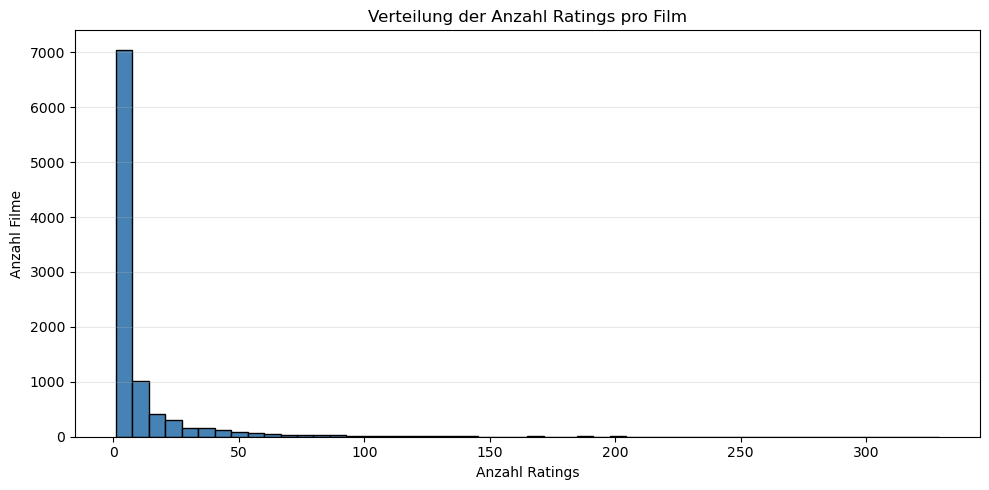

count    9719.000000
mean       10.374730
std        22.405731
min         1.000000
25%         1.000000
50%         3.000000
75%         9.000000
max       329.000000
Name: count, dtype: float64


In [74]:
ratings_per_movie = ratings['movieId'].value_counts()

fig, ax = plt.subplots(figsize=(10, 5))
ax.hist(ratings_per_movie, bins=50, color='steelblue', edgecolor='black')
ax.set_title('Verteilung der Anzahl Ratings pro Film')
ax.set_xlabel('Anzahl Ratings')
ax.set_ylabel('Anzahl Filme')
ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

print(ratings_per_movie.describe())

Ich vermute, dass ein geeigneter Beta i Wert im Intervall [0, 10] liegt. Ab 10 würden fast alle Filme so stark regularisiert, dass der Item Bias gegen 0 gedrückt würde. Also wäre das eine Überregularisierung. Trotzdem untersuchen wir auch noch Werte Jenseites der 10er Grenze aus Interesse.

Für eine sinnvolle Obergrenze von Beta u, schauen wir nochmals kurz die Kennzahlen aus Aufgabe 1h) an.

In [75]:
print(ratings_per_user.describe())

count     610.000000
mean      165.298361
std       269.466692
min        20.000000
25%        35.000000
50%        70.500000
75%       168.000000
max      2698.000000
Name: movieId, dtype: float64


Hier könnte der ideale Beta u Wert in einem grösseren Intervall von [0, 150] liegen. Alles darüber würde auch hier den Term vom Bias also den User Bias gegen 0 drücken und somit Überregularisieren. Da beide Betas jedoch abhängig voneinander angeschaut werden also gemeinsam ein Tiefpunkt in der Kostenfunktion gefunden werden kann, ist die Annahme nicht gesichert.

Das heisst auch, dass wir natürlich das Grid-Search im 2d Raum durchführen da wir die optimale Kombination der beiden Werte suchen.

In [76]:
beta_values = [0, 5, 10, 15, 20, 30, 50, 75, 100]
all_movie_ids = set(ratings['movieId'].unique())
n_masked = 5
N = 5
threshold = 4.0

splits = cross_validation_split(train_ratings, n_masked=n_masked)

results = []
total = len(beta_values) ** 2
counter = 0

for bu_val in beta_values:
    for bi_val in beta_values:
        counter += 1
        fold_maes, fold_rmses, fold_precs, fold_recs = [], [], [], []
        
        for cv_train, cv_val_vis, cv_val_mask in splits:
            f_mae, f_rmse, f_prec, f_rec = evaluate_fold(
                cv_train, cv_val_vis, cv_val_mask,
                beta_u=bu_val, beta_i=bi_val,
                all_movie_ids=all_movie_ids, N=N, threshold=threshold
            )
            fold_maes.append(f_mae)
            fold_rmses.append(f_rmse)
            fold_precs.append(f_prec)
            fold_recs.append(f_rec)
        
        results.append({
            'beta_u': bu_val,
            'beta_i': bi_val,
            'MAE': np.mean(fold_maes),
            'RMSE': np.mean(fold_rmses),
            'Precision@5': np.mean(fold_precs),
            'Recall@5': np.mean(fold_recs)
        })
        
        if counter % 10 == 0:
            print(f"Fortschritt: {counter}/{total}")

results_df = pd.DataFrame(results)

# Bestes Ergebnis
best_idx = results_df['RMSE'].idxmin()
best_row = results_df.loc[best_idx]
print(f"\nBestes Ergebnis (RMSE): β_u={int(best_row['beta_u'])}, "
      f"β_i={int(best_row['beta_i'])}, RMSE={best_row['RMSE']:.4f}")

Fortschritt: 10/81
Fortschritt: 20/81
Fortschritt: 30/81
Fortschritt: 40/81
Fortschritt: 50/81
Fortschritt: 60/81
Fortschritt: 70/81
Fortschritt: 80/81

Bestes Ergebnis (RMSE): β_u=5, β_i=5, RMSE=0.9348


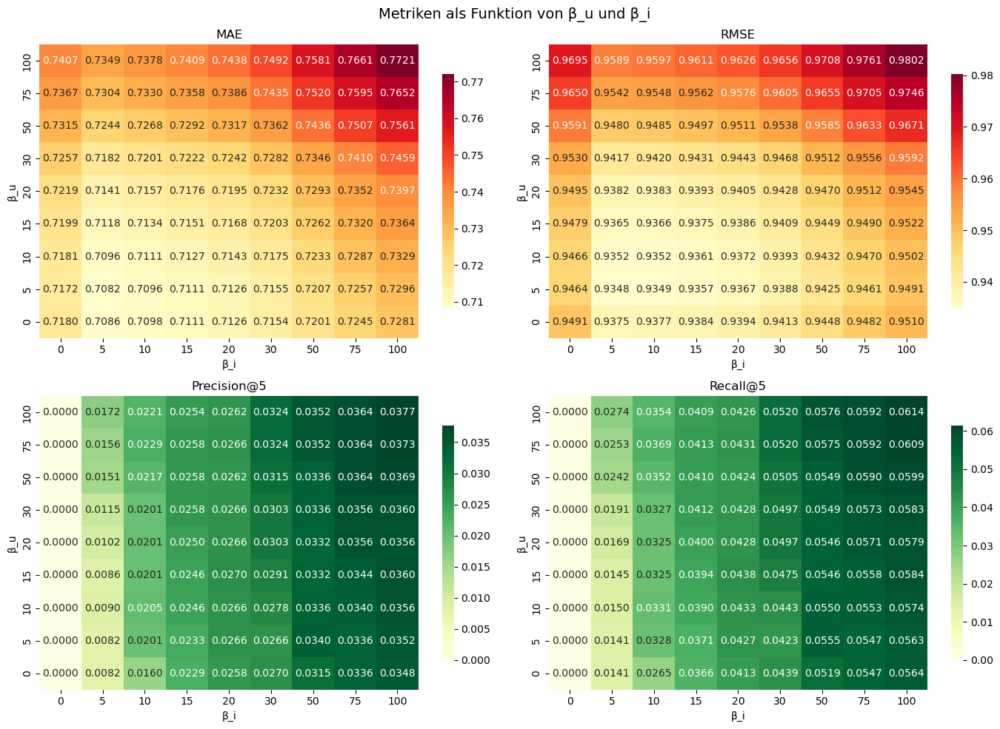

In [77]:
# ============================================================
# Heatmaps für alle 4 Metriken
# ============================================================
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle('Metriken als Funktion von β_u und β_i', fontsize=14)

metrics = ['MAE', 'RMSE', 'Precision@5', 'Recall@5']
cmaps = ['YlOrRd', 'YlOrRd', 'YlGn', 'YlGn']  # Rot = Fehler, Grün = Qualität

for ax, metric, cmap in zip(axes.flatten(), metrics, cmaps):
    pivot = results_df.pivot(index='beta_u', columns='beta_i', values=metric)
    sns.heatmap(pivot, annot=True, fmt='.4f', cmap=cmap, ax=ax, cbar_kws={'shrink': 0.8})
    ax.set_title(metric)
    ax.set_xlabel('β_i')
    ax.set_ylabel('β_u')
    ax.invert_yaxis()

plt.tight_layout()
plt.show()

Das Optimum liegt bei Beta User = 5 und Beta Item = 5. Also ist das Optimum symmetrisch. Heisst die beiden Biases benötigen gleich viel Regularisierung. Dass β_u relativ niedrig liegt ist im Nachhinein plausibel: Die meisten User haben median 70 Ratings, der User-Bias-Schätzer ist also auch ohne starkes Shrinkage stabil. β_u beeinflusst zudem das pro-User-Ranking gar nicht (siehe Plots unten), nur die Skala der Predictions — und damit primär RMSE/MAE.

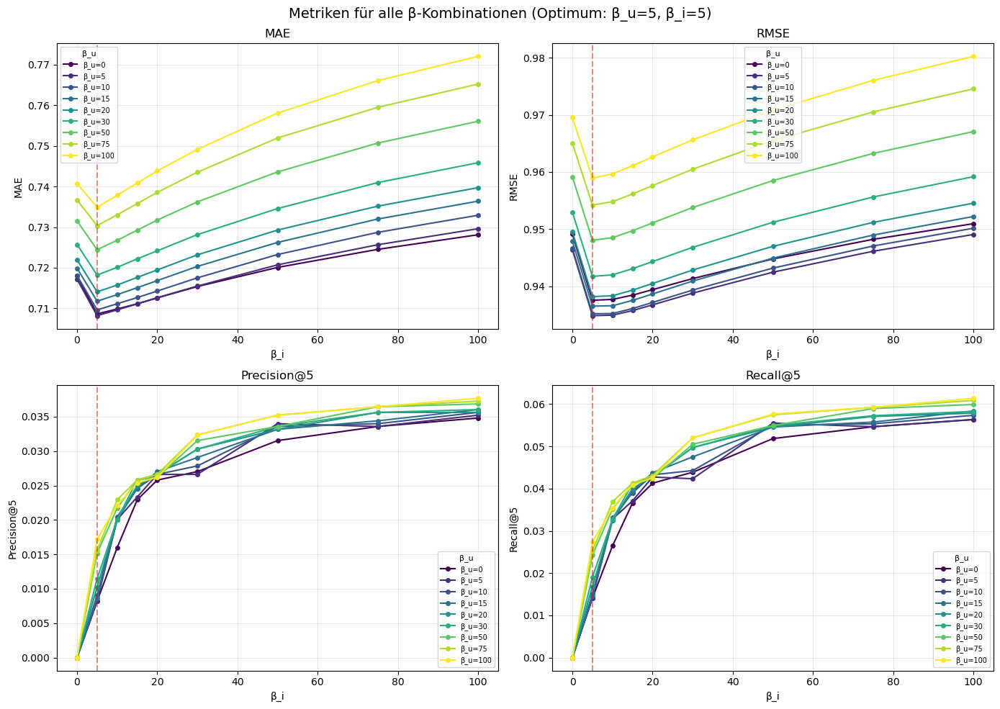

In [78]:
best_bu = int(best_row['beta_u'])
best_bi = int(best_row['beta_i'])

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle(f'Metriken für alle β-Kombinationen (Optimum: β_u={best_bu}, β_i={best_bi})', fontsize=14)

metrics = ['MAE', 'RMSE', 'Precision@5', 'Recall@5']
colors = plt.cm.viridis(np.linspace(0, 1, len(beta_values)))

for ax, metric in zip(axes.flatten(), metrics):
    for i, bu_val in enumerate(beta_values):
        subset = results_df[results_df['beta_u'] == bu_val].sort_values('beta_i')
        ax.plot(subset['beta_i'], subset[metric], 'o-', color=colors[i], 
                label=f'β_u={bu_val}', markersize=4)
    
    ax.axvline(x=best_bi, color='red', linestyle='--', alpha=0.5)
    ax.set_title(metric)
    ax.set_xlabel('β_i')
    ax.set_ylabel(metric)
    ax.grid(alpha=0.3)
    ax.legend(fontsize=7, title='β_u', title_fontsize=8)

plt.tight_layout()
plt.show()

Wir sehen, dass MAE und RMSE bei β=5 ihr Minimum erreichen und danach monoton steigen. Bei β=0 (keine Regularisierung) ist der Fehler ebenfalls höher als beim Optimum. Die Kurve ist also annähernd U-förmig.

Bei den Recommendation Accuracies sehen wir das Gegenteil. Höhere Beta-Werte verbessern die Metrik. Die Kurven liegen für unterschiedliche $\beta_u$ fast übereinander. Das macht Sinn denn $b_u$ verschiebt alle Predictions eines Users gleichmässig, die Reihenfolge der Items für diesen User bleibt unverändert. Deshalb hat $\beta_u$ auf das Ranking eines einzelnen Users keinen Einfluss.

Höhere $\beta_i$ drücken die Item-Biases gegen den Global Mean. Items mit vielen Ratings behalten ihre stabilen, eher positiven $b_i$, Items mit wenigen Ratings (oft Nischenfilme mit zufällig extremen Bewertungen) werden zu 0 hin gezogen. In den Top-N landen also bevorzugt populäre Filme mit positivem $b_i$. Das deckt sich mit den maskierten Items, die in der Validation oft auch populäre Filme sind. Daher steigt P@5 / R@5 mit $\beta_i$. Das ist aber kein "echtes" Lernen, sondern Popularity-Bias.

Ich konzentriere mich auf den RMSE. Er bestraft grosse Fehler stärker als MAE und reagiert nicht auf den oben beschriebenen Popularity-Bias-Effekt der Ranking-Metriken.

Wir plotten noch die beiden Betas im Parameterraum inkl. der Metrikfläche.

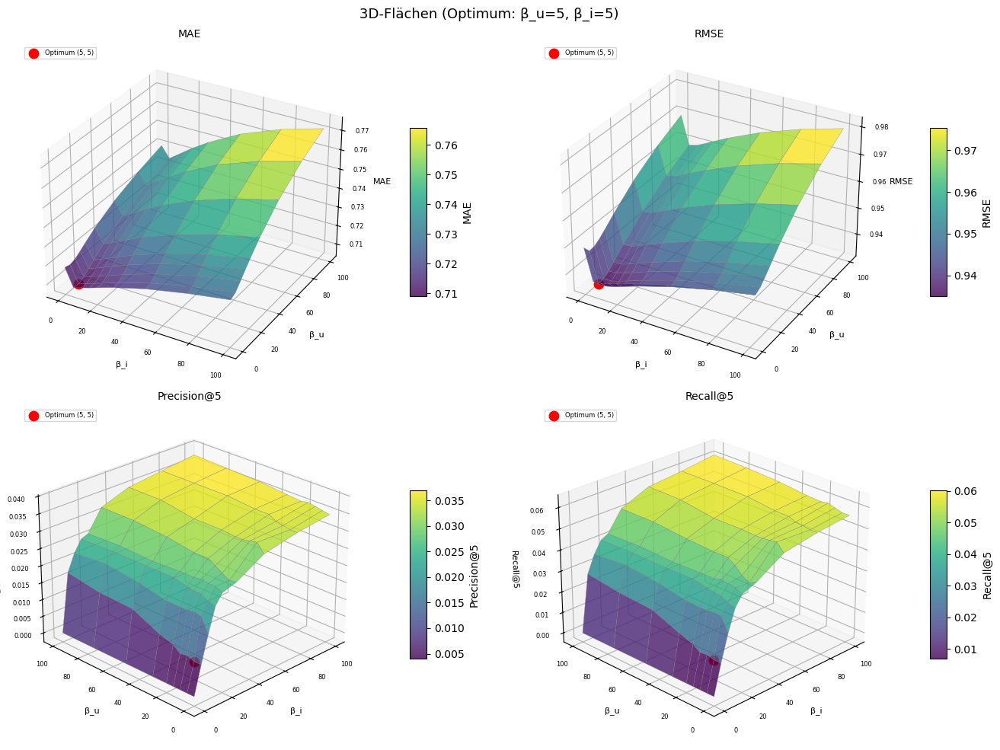

In [79]:
from mpl_toolkits.mplot3d import Axes3D

best_bu = int(best_row['beta_u'])
best_bi = int(best_row['beta_i'])

fig = plt.figure(figsize=(14, 10))
metrics_3d = ['MAE', 'RMSE', 'Precision@5', 'Recall@5']

for i, metric in enumerate(metrics_3d):
    ax = fig.add_subplot(2, 2, i+1, projection='3d')
    
    pivot = results_df.pivot(index='beta_u', columns='beta_i', values=metric)
    X, Y = np.meshgrid(pivot.columns.values, pivot.index.values)
    Z = pivot.values
    
    surf = ax.plot_surface(X, Y, Z, cmap='viridis', alpha=0.8, edgecolor='grey', linewidth=0.3)
    
    best_z = results_df[(results_df['beta_u'] == best_bu) & (results_df['beta_i'] == best_bi)][metric].values[0]
    ax.scatter(best_bi, best_bu, best_z, color='red', s=80, zorder=10, label=f'Optimum ({best_bu}, {best_bi})')
    
    ax.set_xlabel('β_i', fontsize=8)
    ax.set_ylabel('β_u', fontsize=8)
    ax.set_zlabel(metric, fontsize=8)
    ax.set_title(metric, fontsize=10)
    ax.tick_params(labelsize=6)
    ax.legend(fontsize=6, loc='upper left')
    fig.colorbar(surf, ax=ax, shrink=0.5, aspect=10, label=metric, pad=0.1)
    
    if metric in ['Precision@5', 'Recall@5']:
        ax.view_init(elev=25, azim=225)

plt.suptitle(f'3D-Flächen (Optimum: β_u={best_bu}, β_i={best_bi})', fontsize=13)
plt.tight_layout()
plt.show()

Die Flächen Precision@5 und Recall@5 steigen mit grösserem Beta (also eigentlich vor allem grösserem Beta i). Hier sieht man sehr veranschaulicht, wie das Beta i eigentlich den Einfluss auf diese beiden Metriken steuert. Entlang der Beta u Achse finden wir keine grosse Veränderung der Metriken sondern die Varianz liegt bei der Beta i Achse.

### Exercise 5 - Collaborative filtering; item-based and user-based (16 points)
In this exersise we will build 8 different collaborative-filtering RS based on nearest neighbour technique, both in terms of item and user. 

Implement:
1. a RS based on the $K$ most similar items (K nearest neighbours). Similarity shall be calculated based on *cosine similarity*. 
2. a RS based on the $K$ most similar items (K nearest neighbours). Similarity shall be calculated based on *Pearson Correlation Coefficienct*. 
3. a RS based on the $K$ most similar users (K nearest neighbours). Similarity shall be calculated based on *cosine similarity*. 
4. a RS based on the $K$ most similar users (K nearest neighbours). Similarity shall be calculated based on *Pearson Correlation Coefficienct*. 

Make for each of the models above 2 variants. One with user-wise zero centering and one without.

Each should have a default $K$ of 20.

Explain how you handle NaN values in the user rating matrix when computing similarities? What other preparations are useful such as normalization and mean centering?

Describe the two similarity metrics.

Show the top 20 recommended items for user ids 3, 5 and 7.

**Fehlende Ratings in der URM**

Unsere URM ist zu 98.3% leer. Konzeptionell behandeln wir diese leeren Stellen als unbekannt und nicht als schlechte Bewertung. Würden wir sie als echte schlechte Werte (z.B. 0.5) interpretieren unterstellen wir allen Usern sie hätten alle nicht bewerteten Filme schlecht gefunden — bei dieser Sparsity wären alle User-Vektoren fast identisch und die Similarity wäre stark verzerrt.

Wir füllen die Lücken in der URM mit 0 auf und berechnen die Similarity dann über die ganze (aufgefüllte) URM. Effektiv tragen damit im Zähler nur jene Items zur Similarity bei welche beide User bewertet haben (Produkte mit 0 verschwinden). Der Nenner ist die L2-Norm jedes User-Vektors über alle dessen bewerteten Items — also nicht streng auf die Schnittmenge beschränkt sondern Standard-"masked cosine". Gibt es gar keine gemeinsamen Bewertungen ergibt sich automatisch sim=0. Beim Item-based CF gilt das analog mit Usern statt Items.

**User-wise Zero Centering**

Manche User bewerten generell grosszügig und vergeben oft 4 oder 5. Andere sind streng und vergeben selten mehr als 3. Beide könnten geschmacklich identisch sein und nur das Niveau ist anders. Ohne Centering würde Cosine die beiden als unähnlich einstufen weil die absoluten Zahlen weit auseinander liegen.

Wir ziehen also von jedem Rating den persönlichen Durchschnitt des Users ab.

$$r_{u,i}^* = r_{u,i} - \bar{r}_u$$

Nehmen wir User A. Er vergibt im Schnitt 4.5 und gibt einem Film eine 5. Sein zentriertes Rating ist +0.5 also "leicht überdurchschnittlich für mich". User B vergibt im Schnitt 3.0 und gibt demselben Film eine 3.5. Sein zentriertes Rating ist auch +0.5. Beide haben den Film gleich gut gefunden obwohl die Rohwerte 5 und 3.5 weit auseinander liegen.

**Normalisierung**

Cosine und Pearson normieren intern bereits über die Vektor-Längen im Nenner. Wir müssen also keine extra Normalisierung machen. Ohne diese Normierung würde ein langer Rating-Vektor (User mit vielen Ratings) anders verglichen als ein kurzer und das würde die Ähnlichkeiten verfälschen.

**Cosine Similarity**

Cosine misst den Winkel zwischen zwei Rating-Vektoren. Werte gehen von -1 bis +1. Wenn beide Vektoren in dieselbe Richtung zeigen ist die Similarity hoch. Wir berechnen Cosine auf den mit 0 aufgefüllten Rating-Vektoren $a, b$ über die ganze URM:

$$sim_{cos}(a, b) = \frac{\sum_{i} a_i \cdot b_i}{\sqrt{\sum_{i} a_i^2} \cdot \sqrt{\sum_{i} b_i^2}}$$

| Variable | Bedeutung |
|----------|-----------|
| $a_i, b_i$ | Mit 0 aufgefüllte Ratings von User/Item $a$ bzw. $b$ über alle Items (User-based) bzw. über alle User (Item-based) |

Da unbewertete Einträge auf 0 gesetzt sind, tragen im Zähler effektiv nur die gemeinsam bewerteten Einträge bei (Produkte mit 0 verschwinden). Der Nenner summiert die Quadrate über die ganze gefüllte Zeile — also über alle bewerteten Einträge der jeweiligen Entität, nicht streng auf die Schnittmenge $I_{ab}$ beschränkt. Das ist der Standard-"masked cosine".

**Pearson Correlation Coefficient**

Pearson zentriert vor der Korrelation jeden Vektor auf seinen eigenen Mean. Also $a$ wird mit $\bar{a}$ zentriert und $b$ separat mit $\bar{b}$. Wertebereich ist auch -1 bis +1. Wir wenden die Zentrierung nur auf bewertete Einträge an (nicht-bewertete bleiben 0) und berechnen analog zu Cosine über die ganze gefüllte Matrix:

$$sim_{pcc}(a, b) = \frac{\sum_{i} \tilde{a}_i \cdot \tilde{b}_i}{\sqrt{\sum_{i} \tilde{a}_i^2} \cdot \sqrt{\sum_{i} \tilde{b}_i^2}}$$

mit $\tilde{a}_i = (a_i - \bar{a}) \cdot \mathbb{1}[a_i \text{ bewertet}]$ und analog für $\tilde{b}$. Das entspricht der Cosine Similarity auf den zentrierten Rating-Vektoren — daher ist die Implementation für Cosine und Pearson identisch (`sim_matrix(M)`), nur die Eingangsmatrix $M$ ist eine andere.

**Umgang mit negativen Pearson-Korrelationen**

Negative Korrelationen lassen wir im Top-K stehen. Sie gehen mit negativem Gewicht in die Prediction ein und wirken als Anti-Stimme. Wenn ein User immer das Gegenteil bewertet ist auch das ein nutzbares Signal.

Die Alternative wäre negative Sims auf 0 zu clippen also "only positive neighbors". Wir verzichten darauf weil bei unserer hohen Sparsity ohnehin viele User-Paare gar keine Überlappung haben (sim=0). Ein zusätzliches Clipping würde die nutzbare Nachbarschaft weiter schrumpfen.

**Die 8 Modelle und ihre Redundanzen**

Die Aufgabe fordert 4 Similarity-Metriken mal 2 Centering-Varianten also 8 Modelle. Bei den User-based Modellen entstehen jedoch Redundanzen weil User-Pearson per Konstruktion schon zentriert ist.

Konkret bedeutet das Folgendes.

*User-Cos+C* und *User-PCC+C* berechnen die gleiche Similarity-Matrix und kombinieren sie mit der gleichen zentrierten URM in der Prediction. Die Empfehlungslisten sollten also identisch sein.

*User-PCC* (ohne Centering) hat ebenfalls die gleiche Similarity-Matrix wie die beiden oben weil Pearson immer auf user-zentrierten Ratings rechnet. Es kombiniert die Sims aber mit den unzentrierten Rohratings in der Prediction. Die Empfehlungsliste ist daher in der relativen Reihenfolge identisch. Die Scores liegen aber auf der absoluten 0.5 bis 5.0 Skala.

Bei den Item-based Modellen sind die +C Varianten echte zusätzliche Modelle. Item-Pearson zentriert pro Item, +C addiert obendrauf noch die User-Zentrierung. Hier gibt es keine Redundanz.

Wir berechnen alle 8 wie verlangt und weisen die Redundanzen am Ende explizit aus.

Nun definieren wir zuerst unsere URM.

In [80]:
# URM aus allen ratings (inkl. Test-User) für Demonstration
# Begründung: Aufgabe verlangt Empfehlungen für User 3, 5, 7 (im Test-Set)
# Für Evaluation (Aufgabe 6+) wird weiterhin train_ratings mit CV verwendet
urm_df = ratings.pivot_table(index='userId', columns='movieId', values='rating')
urm = np.where(np.isnan(urm_df.values), 0.0, urm_df.values)  # NaN → 0
user_ids = urm_df.index.tolist()
movie_ids = urm_df.columns.tolist()
user_id_to_idx = {uid: i for i, uid in enumerate(user_ids)}
movie_id_to_idx = {mid: i for i, mid in enumerate(movie_ids)}

# User-wise Zero Centering: Mittelwert nur über bewertete Items
rated_mask = urm != 0
user_means = np.where(
    rated_mask.sum(axis=1) > 0,
    urm.sum(axis=1) / rated_mask.sum(axis=1),
    0.0
)
urm_centered = np.where(rated_mask, urm - user_means[:, np.newaxis], 0.0)

print(f'URM shape: {urm.shape} ({len(user_ids)} User, {len(movie_ids)} Movies)')
print(f'Sparsity: {1 - rated_mask.sum() / urm.size:.4%}')

URM shape: (610, 9719) (610 User, 9719 Movies)
Sparsity: 98.2992%


Dann benötigen wir die Funktionen welche uns die Similarities berechnen. Die Similarities werden in einer Matrix gespeichert. Diese hat die Form für User-Based UserxUser (sollte also 610x610 sein) und für Item-based wäre es FilmxFilm (sollte also 9719x9719 sein) In den Einträgen werden die jeweiligen Similarities gespeichert. Die Diagonale sollte logischerweise immer den Wert 1 haben da ein User oder ein Item mit sich selber absolut ähnlich ist.

In [81]:
def sim_matrix(M):
    """Vektorisierte Cosinus-Similarity-Matrix der Zeilen von M.

    Parameters
    ----------
    M : np.ndarray, Form (n, m). n = Entitäten (User oder Items),
        m = Features (Ratings). Fehlende Werte als 0 kodiert. Für Pearson
        muss M bereits zentriert übergeben werden, dann entspricht das Ergebnis
        der Pearson-Korrelation.

    Returns
    -------
    np.ndarray, Form (n, n) mit Werten in [-1, 1]. Diagonale = 1.
    """
    dot = M @ M.T
    norms = np.linalg.norm(M, axis=1)
    denom = np.outer(norms, norms)
    return np.divide(dot, denom, out=np.zeros_like(dot), where=denom != 0)

Wir berechnen nun die Similarity-Matrizen.

In [82]:
# ============================================================
# Item-zentrierte URM für Item-based Pearson
# ============================================================
item_means = np.where(
    rated_mask.sum(axis=0) > 0,
    urm.sum(axis=0) / rated_mask.sum(axis=0),
    0.0
)
urm_item_centered = np.where(rated_mask, urm - item_means[np.newaxis, :], 0.0)

# Beide Centrings kombiniert für Item-Pearson mit User-Centering
urm_both_centered = np.where(rated_mask, urm_item_centered - user_means[:, np.newaxis], 0.0)

# ============================================================
# 8 Similarity-Matrizen berechnen (vektorisiert)
# ============================================================
print('Berechne 8 Similarity-Matrizen (vektorisiert)...\n')

print('1/8: User-Cosine ohne Centering')
sim_user_cos   = sim_matrix(urm)
print(f'    Shape: {sim_user_cos.shape}')

print('2/8: User-Cosine mit Centering')
sim_user_cos_c = sim_matrix(urm_centered)
print(f'    Shape: {sim_user_cos_c.shape}')

print('3/8: User-Pearson ohne Centering')
sim_user_pcc   = sim_matrix(urm_centered)
print(f'    Shape: {sim_user_pcc.shape}')

print('4/8: User-Pearson mit Centering')
sim_user_pcc_c = sim_matrix(urm_centered)
print(f'    Shape: {sim_user_pcc_c.shape}')

print('5/8: Item-Cosine ohne Centering')
sim_item_cos   = sim_matrix(urm.T)
print(f'    Shape: {sim_item_cos.shape}')

print('6/8: Item-Cosine mit Centering')
sim_item_cos_c = sim_matrix(urm_centered.T)
print(f'    Shape: {sim_item_cos_c.shape}')

print('7/8: Item-Pearson ohne Centering')
sim_item_pcc   = sim_matrix(urm_item_centered.T)
print(f'    Shape: {sim_item_pcc.shape}')

print('8/8: Item-Pearson mit Centering')
sim_item_pcc_c = sim_matrix(urm_both_centered.T)
print(f'    Shape: {sim_item_pcc_c.shape}')

print('\nAlle Similarity-Matrizen berechnet!')

Berechne 8 Similarity-Matrizen (vektorisiert)...

1/8: User-Cosine ohne Centering
    Shape: (610, 610)
2/8: User-Cosine mit Centering
    Shape: (610, 610)
3/8: User-Pearson ohne Centering
    Shape: (610, 610)
4/8: User-Pearson mit Centering
    Shape: (610, 610)
5/8: Item-Cosine ohne Centering
    Shape: (9719, 9719)
6/8: Item-Cosine mit Centering
    Shape: (9719, 9719)
7/8: Item-Pearson ohne Centering
    Shape: (9719, 9719)
8/8: Item-Pearson mit Centering
    Shape: (9719, 9719)

Alle Similarity-Matrizen berechnet!


Die Dimensionen stimmen mit unserer Vermutung überein.

In [83]:
print('User-Cosine Similarity (erste 5x5):')
print(np.round(sim_user_cos[:5, :5], 3))

User-Cosine Similarity (erste 5x5):
[[1.    0.027 0.06  0.194 0.129]
 [0.027 1.    0.    0.004 0.017]
 [0.06  0.    1.    0.002 0.005]
 [0.194 0.004 0.002 1.    0.129]
 [0.129 0.017 0.005 0.129 1.   ]]


Wir sehen auch, dass auf der Diagonalen die 1en vorkommen.

Dann definieren wir sämtliche Prediction Funktionen. Die Prediction wird wie folgt gemacht:

**Für User-based CF**

$$\hat{r}_{u,i} = \frac{\sum_{v \in KNN(u,i)} sim(u,v) \cdot r_{v,i}}{\sum_{v \in KNN(u,i)} sim(u,v)}$$

| Variable | Bedeutung |
|----------|-----------|
| $\hat{r}_{u,i}$ | Vorhergesagtes Rating von User $u$ für Item $i$ |
| $KNN(u,i)$ | Menge der K ähnlichsten User zu $u$, die Item $i$ bewertet haben |
| $sim(u,v)$ | Similarity zwischen User $u$ und User $v$ |
| $r_{v,i}$ | Rating von User $v$ für Item $i$ |

**Für Item-based CF**

$$\hat{r}_{u,i} = \frac{\sum_{j \in KNN(i,u)} sim(i,j) \cdot r_{u,j}}{\sum_{j \in KNN(i,u)} sim(i,j)}$$

| Variable | Bedeutung |
|----------|-----------|
| $KNN(i,u)$ | Menge der K ähnlichsten Items zu $i$, die User $u$ bewertet hat |
| $sim(i,j)$ | Similarity zwischen Item $i$ und Item $j$ |
| $r_{u,j}$ | Rating von User $u$ für Item $j$ |

Der Similarity-Bereich kann von -1 (sehr gegensätzlich) bis 1 (sehr ähnlich) gehen wobei der Wert 0 gar keinen Zusammenhang bedeutet.

In [84]:
# ============================================================
# Prediction-Funktionen
# ============================================================

def predict_user_based(user_idx, movie_idx, sim_mat, rating_matrix, K=20):
    """
    User-based CF Prediction.
    Findet die K ähnlichsten User die den Film bewertet haben.
    """
    movie_ratings = rating_matrix[:, movie_idx]
    rated_mask = movie_ratings != 0

    sims = sim_mat[user_idx].copy()
    sims[~rated_mask] = 0
    sims[user_idx] = 0

    top_k_idx = np.argsort(sims)[-K:]
    top_k_sims = sims[top_k_idx]
    top_k_ratings = movie_ratings[top_k_idx]

    valid = top_k_sims != 0
    if valid.sum() == 0:
        return np.nan
    return np.dot(top_k_sims[valid], top_k_ratings[valid]) / top_k_sims[valid].sum()


def predict_item_based(user_idx, movie_idx, sim_mat, rating_matrix, K=20):
    """
    Item-based CF Prediction.
    Findet die K ähnlichsten Items die der User bewertet hat.
    """
    user_ratings = rating_matrix[user_idx]
    rated_mask = user_ratings != 0

    sims = sim_mat[movie_idx].copy()
    sims[~rated_mask] = 0
    sims[movie_idx] = 0

    top_k_idx = np.argsort(sims)[-K:]
    top_k_sims = sims[top_k_idx]
    top_k_ratings = user_ratings[top_k_idx]

    valid = top_k_sims != 0
    if valid.sum() == 0:
        return np.nan
    return np.dot(top_k_sims[valid], top_k_ratings[valid]) / top_k_sims[valid].sum()


def cf_predict_top_n(user_id, sim_mat, rating_matrix,
                     mode, user_id_to_idx, movie_id_to_idx,
                     movie_ids, seen_movies, K=20, N=20):
    """
    Top-N Empfehlungen via CF.
    mode: 'user' oder 'item'
    """
    user_idx = user_id_to_idx[user_id]
    predict_func = predict_user_based if mode == 'user' else predict_item_based

    unseen = set(movie_ids) - seen_movies

    predictions = []
    for mid in unseen:
        if mid not in movie_id_to_idx:
            continue
        movie_idx = movie_id_to_idx[mid]
        score = predict_func(user_idx, movie_idx, sim_mat, rating_matrix, K)
        if not np.isnan(score):
            predictions.append((mid, score))

    predictions.sort(key=lambda x: x[1], reverse=True)
    return predictions[:N]

Nun berechnen wir unsere Empfehlungslisten. Bei den zentrierten Varianten ist der Score ein gewichteter Durchschnitt der zentrierten Ratings der Nachbarn, also eine Abweichung vom jeweiligen Nachbar-Durchschnitt. Bei den unzentrierten Varianten sind die Scores direkt als vorhergesagte Ratings auf der 0.5 bis 5.0 Skala lesbar.

Hinweis. Hier in Aufgabe 5 nehmen wir eine einfache Prediction-Funktion (predict_user_based bzw. predict_item_based) damit wir die Top-N-Listen anschauen können. In Aufgabe 6 brauchen wir dann eine schnellere vektorisierte Variante (predict_user_all bzw. predict_item_all) für die Cross-Validation. Die beiden funktionieren leicht unterschiedlich und liefern darum auch leicht unterschiedliche Top-N-Listen. Das ist ok. Die Listen hier sind nur zur Illustration, die saubere Referenz für die Empfehlungen ist Aufgabe 6.

Was wir bei den unzentrierten Modellen sehen werden ist, dass in den Top-N von Item-Cosine, Item-Pearson, User-Cosine und User-Pearson (alle ohne Centering) dominieren Filme mit Score 5.0 und sehr wenigen Ratings. Das ist der klassische Sparsity- und Popularity-Bias des rohen CF. Schon ein einzelner sehr ähnlicher Nachbar mit einem 5-Sterne-Rating reicht aus damit der gewichtete Durchschnitt auf 5.0 schiesst. User-wise Zero Centering korrigiert das. Ob die +Center-Varianten objektiv besser sind sehen wir nicht in den Demo-Listen sondern in den Metriken von Aufgabe 6 und Aufgabe 10. Dort haben sie messbar bessere Precision@5 und RMSE.

In [85]:
# Hinweis: User 3, 5, 7 liegen alle im Test-Set (IDs 1–122). Für die reine
# Demonstration der 8 Modelle bauen wir die URM aus dem vollen `ratings`-DF
# (sonst wären diese User Cold-Start mit 0 Ratings und alle Listen wären leer
# bzw. zufällig). Die Evaluation in Aufgabe 6+ verwendet weiterhin train_ratings.

models = {
    'Item-Cosine':              (sim_item_cos,   urm,          'item'),
    'Item-Cosine+Center':       (sim_item_cos_c, urm_centered, 'item'),
    'Item-Pearson':             (sim_item_pcc,   urm,          'item'),
    'Item-Pearson+Center':      (sim_item_pcc_c, urm_centered, 'item'),
    'User-Cosine':              (sim_user_cos,   urm,          'user'),
    'User-Cosine+Center':       (sim_user_cos_c, urm_centered, 'user'),
    'User-Pearson':             (sim_user_pcc,   urm,          'user'),
    'User-Pearson+Center':      (sim_user_pcc_c, urm_centered, 'user'),
}

for uid in [3, 5, 7]:
    seen = set(ratings[ratings['userId'] == uid]['movieId'])
    print(f"\n{'='*80}")
    print(f"User {uid} (Anzahl Ratings: {len(seen)})")
    print(f"{'='*80}")

    for name, (sim_mat_iter, rating_matrix, mode) in models.items():
        top_n = cf_predict_top_n(
            uid, sim_mat_iter, rating_matrix, mode,
            user_id_to_idx, movie_id_to_idx, movie_ids,
            seen, K=20, N=20
        )

        if len(top_n) == 0:
            print(f"\n--- {name}: Keine Empfehlungen möglich ---")
            continue

        top_df = pd.DataFrame(top_n, columns=['movieId', 'score'])
        top_df = top_df.merge(movies[['movieId', 'title']], on='movieId')
        top_df.insert(0, 'rank', range(1, len(top_df) + 1))

        print(f"\n--- {name} ---")
        display(top_df[['rank', 'movieId', 'title', 'score']].round(3))



User 3 (Anzahl Ratings: 39)

--- Item-Cosine ---


,rank,movieId,title,score
0,1,889,1-900 (06) (1994),5.000
1,2,1167,Dear God (1996),5.000
2,3,6752,"Fighting Temptations, The (2003)",5.000
3,4,6886,Beyond Borders (2003),5.000
4,5,6949,"Big Empty, The (2003)",5.000
5,6,6597,"Princess Blade, The (Shura Yukihime) (2001)",4.500
6,7,1331,Audrey Rose (1977),4.323
7,8,1980,Friday the 13th Part VII: The New Blood (1988),4.323
8,9,1987,Prom Night (1980),4.323
9,10,2655,Howling II: Your Sister Is a Werewolf (1985),4.323



--- Item-Cosine+Center ---


,rank,movieId,title,score
0,1,5675,Swept Away (2002),2.564
1,2,49,When Night Is Falling (1995),2.564
2,3,3214,American Flyers (1985),2.564
3,4,5787,"Truth About Charlie, The (2002)",2.564
4,5,6583,"Blood of Heroes, The (Salute of the Jugger, Th...",2.564
5,6,6752,"Fighting Temptations, The (2003)",2.564
6,7,6886,Beyond Borders (2003),2.564
7,8,6949,"Big Empty, The (2003)",2.564
8,9,8782,Thunderbirds (2004),2.564
9,10,8800,Code 46 (2003),2.564



--- Item-Pearson ---


,rank,movieId,title,score
0,1,3214,American Flyers (1985),5.000
1,2,1978,Friday the 13th Part V: A New Beginning (1985),4.936
2,3,165103,Keeping Up with the Joneses (2016),4.936
3,4,187031,Jurassic World: Fallen Kingdom (2018),4.936
4,5,62383,"20,000 Leagues Under the Sea (1916)",4.913
5,6,3182,Mr. Death: The Rise and Fall of Fred A. Leucht...,4.886
6,7,5011,Charlotte Gray (2001),4.836
7,8,109968,Why Don't You Play In Hell? (Jigoku de naze wa...,4.797
8,9,116668,Dead Snow 2: Red vs. Dead (2014),4.767
9,10,3947,Get Carter (1971),4.694



--- Item-Pearson+Center ---


,rank,movieId,title,score
0,1,889,1-900 (06) (1994),2.564
1,2,1167,Dear God (1996),2.564
2,3,6752,"Fighting Temptations, The (2003)",2.564
3,4,6886,Beyond Borders (2003),2.564
4,5,6949,"Big Empty, The (2003)",2.564
5,6,6597,"Princess Blade, The (Shura Yukihime) (2001)",2.064
6,7,131934,The Malibu Bikini Shop (1986),1.944
7,8,100737,Snitch (2013),1.944
8,9,104074,Percy Jackson: Sea of Monsters (2013),1.944
9,10,170289,Species III (2004),1.944



--- User-Cosine ---


,rank,movieId,title,score
0,1,6442,Belle époque (1992),5.0
1,2,131098,Saving Santa (2013),5.0
2,3,53,Lamerica (1994),5.0
3,4,163925,"Wings, Legs and Tails (1986)",5.0
4,5,99,Heidi Fleiss: Hollywood Madam (1995),5.0
5,6,32892,Ivan's Childhood (a.k.a. My Name is Ivan) (Iva...,5.0
6,7,148,"Awfully Big Adventure, An (1995)",5.0
7,8,131237,What Men Talk About (2010),5.0
8,9,33138,Palindromes (2004),5.0
9,10,467,Live Nude Girls (1995),5.0



--- User-Cosine+Center ---


,rank,movieId,title,score
0,1,3525,Bachelor Party (1984),2.389
1,2,89904,The Artist (2011),2.223
2,3,112804,I Origins (2014),1.946
3,4,47423,Half Nelson (2006),1.934
4,5,51931,Reign Over Me (2007),1.934
5,6,87234,Submarine (2010),1.922
6,7,3379,On the Beach (1959),1.858
7,8,68945,Neon Genesis Evangelion: Death & Rebirth (Shin...,1.858
8,9,170355,Mulholland Dr. (1999),1.858
9,10,96004,Dragon Ball Z: The History of Trunks (Doragon ...,1.858



--- User-Pearson ---


,rank,movieId,title,score
0,1,942,Laura (1944),5.0
1,2,2511,"Long Goodbye, The (1973)",5.0
2,3,112804,I Origins (2014),5.0
3,4,120130,Into the Forest of Fireflies' Light (2011),5.0
4,5,53,Lamerica (1994),5.0
5,6,85,Angels and Insects (1995),5.0
6,7,163925,"Wings, Legs and Tails (1986)",5.0
7,8,99,Heidi Fleiss: Hollywood Madam (1995),5.0
8,9,32892,Ivan's Childhood (a.k.a. My Name is Ivan) (Iva...,5.0
9,10,131237,What Men Talk About (2010),5.0



--- User-Pearson+Center ---


,rank,movieId,title,score
0,1,3525,Bachelor Party (1984),2.389
1,2,89904,The Artist (2011),2.223
2,3,112804,I Origins (2014),1.946
3,4,47423,Half Nelson (2006),1.934
4,5,51931,Reign Over Me (2007),1.934
5,6,87234,Submarine (2010),1.922
6,7,3379,On the Beach (1959),1.858
7,8,68945,Neon Genesis Evangelion: Death & Rebirth (Shin...,1.858
8,9,170355,Mulholland Dr. (1999),1.858
9,10,96004,Dragon Ball Z: The History of Trunks (Doragon ...,1.858



User 5 (Anzahl Ratings: 44)

--- Item-Cosine ---


,rank,movieId,title,score
0,1,2493,"Harmonists, The (1997)",5.000
1,2,2538,Dancemaker (1998),5.000
2,3,2623,Trippin' (1999),5.000
3,4,4284,Frankie and Johnny (1966),5.000
4,5,5746,Galaxy of Terror (Quest) (1981),5.000
5,6,5764,Looker (1981),5.000
6,7,6835,Alien Contamination (1980),5.000
7,8,7184,This Property is Condemned (1966),5.000
8,9,7899,Master of the Flying Guillotine (Du bi quan wa...,5.000
9,10,83601,Amer (2009),5.000



--- Item-Cosine+Center ---


,rank,movieId,title,score
0,1,2164,Surf Nazis Must Die (1987),1.364
1,2,103171,Schlussmacher (2013),1.364
2,3,142602,"F*ck You, Goethe 2 (2015)",1.364
3,4,92427,Woman in Love (Rubbeldiekatz) (2011),1.364
4,5,160569,Ice Age: Collision Course (2016),1.364
5,6,757,Ashes of Time (Dung che sai duk) (1994),1.364
6,7,66335,Afro Samurai: Resurrection (2009),1.364
7,8,2493,"Harmonists, The (1997)",1.364
8,9,101072,"Unintentional Kidnapping of Mrs. Elfriede Ott,...",1.364
9,10,3872,"Suddenly, Last Summer (1959)",1.364



--- Item-Pearson ---


,rank,movieId,title,score
0,1,8327,Dolls (2002),5.000
1,2,27368,Asterix & Obelix: Mission Cleopatra (Astérix &...,5.000
2,3,6055,Sugar Hill (1994),4.995
3,4,110130,"Nut Job, The (2014)",4.916
4,5,4863,Female Trouble (1975),4.913
5,6,6348,Breakin' 2: Electric Boogaloo (1984),4.894
6,7,83827,Marwencol (2010),4.862
7,8,99764,It's Such a Beautiful Day (2012),4.847
8,9,103107,20 Feet from Stardom (Twenty Feet from Stardom...,4.825
9,10,5932,Burden of Dreams (1982),4.763



--- Item-Pearson+Center ---


,rank,movieId,title,score
0,1,2493,"Harmonists, The (1997)",1.364
1,2,2538,Dancemaker (1998),1.364
2,3,2623,Trippin' (1999),1.364
3,4,4284,Frankie and Johnny (1966),1.364
4,5,5746,Galaxy of Terror (Quest) (1981),1.364
5,6,5764,Looker (1981),1.364
6,7,6835,Alien Contamination (1980),1.364
7,8,7184,This Property is Condemned (1966),1.364
8,9,7899,Master of the Flying Guillotine (Du bi quan wa...,1.364
9,10,83601,Amer (2009),1.364



--- User-Cosine ---


,rank,movieId,title,score
0,1,99,Heidi Fleiss: Hollywood Madam (1995),5.0
1,2,6983,Jane Eyre (1944),5.0
2,3,27320,"Nine Lives of Tomas Katz, The (2000)",5.0
3,4,131098,Saving Santa (2013),5.0
4,5,53,Lamerica (1994),5.0
5,6,163925,"Wings, Legs and Tails (1986)",5.0
6,7,148,"Awfully Big Adventure, An (1995)",5.0
7,8,131237,What Men Talk About (2010),5.0
8,9,33138,Palindromes (2004),5.0
9,10,467,Live Nude Girls (1995),5.0



--- User-Cosine+Center ---


,rank,movieId,title,score
0,1,117192,Doctor Who: The Time of the Doctor (2013),2.574
1,2,87234,Submarine (2010),2.370
2,3,5490,The Big Bus (1976),2.153
3,4,132333,Seve (2014),2.153
4,5,136850,Villain (1971),2.130
5,6,25947,Unfaithfully Yours (1948),2.009
6,7,26326,"Holy Mountain, The (Montaña sagrada, La) (1973)",2.009
7,8,4021,Before Night Falls (2000),1.971
8,9,168492,Call Me by Your Name (2017),1.924
9,10,3379,On the Beach (1959),1.858



--- User-Pearson ---


,rank,movieId,title,score
0,1,1140,Entertaining Angels: The Dorothy Day Story (1996),5.0
1,2,3404,Titanic (1953),5.0
2,3,4273,Under the Sand (2000),5.0
3,4,5537,Satin Rouge (2002),5.0
4,5,131098,Saving Santa (2013),5.0
5,6,53,Lamerica (1994),5.0
6,7,163925,"Wings, Legs and Tails (1986)",5.0
7,8,99,Heidi Fleiss: Hollywood Madam (1995),5.0
8,9,32892,Ivan's Childhood (a.k.a. My Name is Ivan) (Iva...,5.0
9,10,148,"Awfully Big Adventure, An (1995)",5.0



--- User-Pearson+Center ---


,rank,movieId,title,score
0,1,117192,Doctor Who: The Time of the Doctor (2013),2.574
1,2,87234,Submarine (2010),2.370
2,3,5490,The Big Bus (1976),2.153
3,4,132333,Seve (2014),2.153
4,5,136850,Villain (1971),2.130
5,6,25947,Unfaithfully Yours (1948),2.009
6,7,26326,"Holy Mountain, The (Montaña sagrada, La) (1973)",2.009
7,8,4021,Before Night Falls (2000),1.971
8,9,168492,Call Me by Your Name (2017),1.924
9,10,3379,On the Beach (1959),1.858



User 7 (Anzahl Ratings: 152)

--- Item-Cosine ---


,rank,movieId,title,score
0,1,113207,Get on Up (2014),5.000
1,2,3496,Madame Sousatzka (1988),4.878
2,3,1331,Audrey Rose (1977),4.790
3,4,1980,Friday the 13th Part VII: The New Blood (1988),4.790
4,5,2655,Howling II: Your Sister Is a Werewolf (1985),4.790
5,6,2740,"Kindred, The (1986)",4.790
6,7,2982,"Guardian, The (1990)",4.790
7,8,3021,"Funhouse, The (1981)",4.790
8,9,1341,Burnt Offerings (1976),4.633
9,10,2896,Alvarez Kelly (1966),4.592



--- Item-Cosine+Center ---


,rank,movieId,title,score
0,1,3496,Madame Sousatzka (1988),1.770
1,2,1519,Broken English (1996),1.770
2,3,3958,Billy Jack Goes to Washington (1977),1.770
3,4,6408,Animals are Beautiful People (1974),1.770
4,5,8738,"Woman Is a Woman, A (femme est une femme, Une)...",1.770
5,6,26147,"Thousand Clowns, A (1965)",1.770
6,7,2370,"Emerald Forest, The (1985)",1.614
7,8,2975,"Best Man, The (1999)",1.614
8,9,1341,Burnt Offerings (1976),1.487
9,10,7815,True Stories (1986),1.468



--- Item-Pearson ---


,rank,movieId,title,score
0,1,389,"Colonel Chabert, Le (1994)",4.735
1,2,1167,Dear God (1996),4.560
2,3,2350,Heart Condition (1990),4.534
3,4,581,"Celluloid Closet, The (1995)",4.500
4,5,656,Eddie (1996),4.365
5,6,1085,"Old Man and the Sea, The (1958)",4.344
6,7,813,Larger Than Life (1996),4.342
7,8,3432,Death Wish 3 (1985),4.341
8,9,7564,Kwaidan (Kaidan) (1964),4.318
9,10,3165,Boiling Point (1993),4.309



--- Item-Pearson+Center ---


,rank,movieId,title,score
0,1,113207,Get on Up (2014),1.770
1,2,3496,Madame Sousatzka (1988),1.480
2,3,1331,Audrey Rose (1977),1.424
3,4,1980,Friday the 13th Part VII: The New Blood (1988),1.424
4,5,2655,Howling II: Your Sister Is a Werewolf (1985),1.424
5,6,2740,"Kindred, The (1986)",1.424
6,7,2982,"Guardian, The (1990)",1.424
7,8,3021,"Funhouse, The (1981)",1.424
8,9,136850,Villain (1971),1.399
9,10,130482,Too Late for Tears (1949),1.399



--- User-Cosine ---


,rank,movieId,title,score
0,1,163925,"Wings, Legs and Tails (1986)",5.0
1,2,131237,What Men Talk About (2010),5.0
2,3,131724,The Jinx: The Life and Deaths of Robert Durst ...,5.0
3,4,165959,Alesha Popovich and Tugarin the Dragon (2004),5.0
4,5,166183,Junior and Karlson (1968),5.0
5,6,134095,My Love (2006),5.0
6,7,3687,Light Years (Gandahar) (1988),5.0
7,8,4788,Moscow Does Not Believe in Tears (Moskva sleza...,5.0
8,9,70451,Max Manus (2008),5.0
9,10,136445,George Carlin: Back in Town (1996),5.0



--- User-Cosine+Center ---


,rank,movieId,title,score
0,1,40491,"Match Factory Girl, The (Tulitikkutehtaan tytt...",2.755
1,2,156605,Paterson,2.255
2,3,148881,World of Tomorrow (2015),2.189
3,4,5490,The Big Bus (1976),2.153
4,5,132333,Seve (2014),2.153
5,6,25947,Unfaithfully Yours (1948),2.009
6,7,8477,"Jetée, La (1962)",1.993
7,8,3379,On the Beach (1959),1.858
8,9,5915,Victory (a.k.a. Escape to Victory) (1981),1.806
9,10,67618,Strictly Sexual (2008),1.765



--- User-Pearson ---


,rank,movieId,title,score
0,1,779,'Til There Was You (1997),5.0
1,2,5088,"Going Places (Valseuses, Les) (1974)",5.0
2,3,5607,"Son of the Bride (Hijo de la novia, El) (2001)",5.0
3,4,5867,Thief (1981),5.0
4,5,86721,Idiots and Angels (2008),5.0
5,6,27751,'Salem's Lot (2004),5.0
6,7,53,Lamerica (1994),5.0
7,8,99,Heidi Fleiss: Hollywood Madam (1995),5.0
8,9,33138,Palindromes (2004),5.0
9,10,467,Live Nude Girls (1995),5.0



--- User-Pearson+Center ---


,rank,movieId,title,score
0,1,40491,"Match Factory Girl, The (Tulitikkutehtaan tytt...",2.755
1,2,156605,Paterson,2.255
2,3,148881,World of Tomorrow (2015),2.189
3,4,5490,The Big Bus (1976),2.153
4,5,132333,Seve (2014),2.153
5,6,25947,Unfaithfully Yours (1948),2.009
6,7,8477,"Jetée, La (1962)",1.993
7,8,3379,On the Beach (1959),1.858
8,9,5915,Victory (a.k.a. Escape to Victory) (1981),1.806
9,10,67618,Strictly Sexual (2008),1.765



### Exercise 6 - Optimize hyperparameter $K$ (6 points)
Optimize the hyperparameter $K$ for all RS from the prior exercise optimizing for minimal RMSE. 
For each RS plot RMSE, Precision@N and Recall@N as a function of $K$. 

Compare the results of these four RS on the 3 example users. Do the results match your expectation? Describe.

In [86]:
K_values = [1, 3, 5, 10, 15, 20, 30, 50, 75, 100]


def trim_sim_matrix(sim_mat, K):
    """Behält pro Zeile die K grössten Ähnlichkeiten EXKLUSIVE Diagonale."""
    sim_no_self = sim_mat.copy()
    np.fill_diagonal(sim_no_self, -np.inf)
    trimmed = np.zeros_like(sim_mat)
    top_k_idx = np.argsort(sim_no_self, axis=1)[:, -K:]
    rows = np.arange(sim_mat.shape[0])[:, None]
    trimmed[rows, top_k_idx] = sim_mat[rows, top_k_idx]
    return trimmed


def predict_item_all(trimmed_sim, urm, rated_mask, item_means, user_means, centered=False):
    """Item-based CF Prediction-Matrix (users × items).

    Non-centered: Item-Pearson-Formel mit implizitem Shrinkage (Indikator nur im Zähler, Nenner über alle K Nachbarn). Subtrahiert Item-Mean.
        $\\hat{r}_{u,i} = \\bar{r}_i + \\frac{\\sum_j sim(i,j)\\,(r_{u,j}-\\bar{r}_j)\\,\\mathbb{1}[r_{u,j}\\neq 0]}{\\sum_j |sim(i,j)|}$
    Centered (+C): User-wise Zero Centering — subtrahiert User-Mean statt Item-Mean.
        $\\hat{r}_{u,i} = \\bar{r}_u + \\frac{\\sum_j sim(i,j)\\,(r_{u,j}-\\bar{r}_u)\\,\\mathbb{1}[r_{u,j}\\neq 0]}{\\sum_j |sim(i,j)|}$

    Der Nenner summiert über alle K Nachbarn (nicht nur die rated). Das wirkt
    als impliziter Shrinkage: Items mit wenigen rated-Nachbarn werden zum
    Item-Mean (bzw. User-Mean) hin gedrückt — gewünscht für stabiles Ranking.
    """
    if centered:
        R = (urm - user_means[:, None]) * rated_mask
        addback = np.broadcast_to(user_means[:, None], urm.shape)
    else:
        R = (urm - item_means[None, :]) * rated_mask
        addback = np.broadcast_to(item_means[None, :], urm.shape)
    numer = trimmed_sim @ R.T                    # items × users
    denom = np.abs(trimmed_sim).sum(axis=1)      # items
    denom = np.where(denom > 0, denom, 1.0)
    pred = (numer / denom[:, None]).T            # users × items
    pred = pred + addback
    return pred


def predict_user_all(trimmed_sim, urm, rated_mask, user_means, centered=False):
    """User-based CF Prediction-Matrix (users × items).

    Verwendet die kanonische User-Pearson-Formel mit User-Mean-Centering. Der
    `centered`-Flag ändert hier nur, welche Similarity-Matrix vorab übergeben
    wurde (Cos+C / PCC sind beide auf user-zentrierten Ratings berechnet).
    """
    R = (urm - user_means[:, None]) * rated_mask
    numer = trimmed_sim @ R                       # users × items
    denom = np.abs(trimmed_sim).sum(axis=1)       # users
    denom = np.where(denom > 0, denom, 1.0)
    pred = numer / denom[:, None]
    pred = pred + user_means[:, None]
    return pred


def evaluate_k_vectorized(sim_mat, mode, K_values, splits,
                          urm, rated_mask, user_means, item_means,
                          user_id_to_idx, movie_id_to_idx,
                          user_ids, movie_ids,
                          N=5, threshold=4.0, centered=False):
    """Evaluiert ein CF-Modell für alle K-Werte via CV."""
    results = []
    for K in K_values:
        trimmed = trim_sim_matrix(sim_mat, K)
        if mode == 'item':
            pred_matrix = predict_item_all(trimmed, urm, rated_mask, item_means, user_means, centered=centered)
        else:
            pred_matrix = predict_user_all(trimmed, urm, rated_mask, user_means, centered=centered)

        fold_rmses, fold_precs, fold_recs = [], [], []
        movie_ids_arr = np.array(movie_ids)

        for cv_train, cv_val_vis, cv_val_mask in splits:
            train_data = pd.concat([cv_train, cv_val_vis], ignore_index=True)
            train_seen = train_data.groupby('userId')['movieId'].apply(set).to_dict()

            y_pred, y_true = [], []
            for _, row in cv_val_mask.iterrows():
                uid, mid = row['userId'], row['movieId']
                if uid not in user_id_to_idx or mid not in movie_id_to_idx:
                    continue
                p = pred_matrix[user_id_to_idx[uid], movie_id_to_idx[mid]]
                y_pred.append(p)
                y_true.append(row['rating'])
            if len(y_pred) == 0:
                continue
            fold_rmses.append(rmse(np.array(y_true), np.array(y_pred)))

            precs, recs = [], []
            for uid in cv_val_mask['userId'].unique():
                if uid not in user_id_to_idx:
                    continue
                user_masked = cv_val_mask[cv_val_mask['userId'] == uid]
                relevant_ids = set(user_masked[user_masked['rating'] >= threshold]['movieId'])
                seen = train_seen.get(uid, set())

                uidx = user_id_to_idx[uid]
                scores = pred_matrix[uidx]
                seen_mask = np.isin(movie_ids_arr, list(seen))
                cand_mids = movie_ids_arr[~seen_mask]
                cand_scores = scores[~seen_mask]
                top_n_idx = np.argsort(cand_scores)[-N:][::-1]
                recommended_ids = cand_mids[top_n_idx].tolist()

                precs.append(precision_at_n(recommended_ids, relevant_ids, N))
                recs.append(recall_at_n(recommended_ids, relevant_ids, N))

            fold_precs.append(np.mean(precs) if precs else np.nan)
            fold_recs.append(np.mean(recs) if recs else np.nan)

        results.append({
            'K': K,
            'RMSE': np.nanmean(fold_rmses),
            'Precision@5': np.nanmean(fold_precs),
            'Recall@5': np.nanmean(fold_recs),
        })
        print(f'  K={K:3d} | RMSE={results[-1]["RMSE"]:.4f} | P@5={results[-1]["Precision@5"]:.4f} | R@5={results[-1]["Recall@5"]:.4f}')

    return pd.DataFrame(results)


# Item-Mean-Vektor (Mittelwert nur über bewertete User pro Item)
item_means = np.where(
    rated_mask.sum(axis=0) > 0,
    urm.sum(axis=0) / np.maximum(rated_mask.sum(axis=0), 1),
    0.0
)

splits = cross_validation_split(train_ratings, n_masked=5)

models_eval = {
    'Item-Cos':   (sim_item_cos,   'item'),
    'Item-Cos+C': (sim_item_cos_c, 'item'),
    'Item-PCC':   (sim_item_pcc,   'item'),
    'Item-PCC+C': (sim_item_pcc_c, 'item'),
    'User-Cos':   (sim_user_cos,   'user'),
    'User-Cos+C': (sim_user_cos_c, 'user'),
    'User-PCC':   (sim_user_pcc,   'user'),
    'User-PCC+C': (sim_user_pcc_c, 'user'),
}

all_results = {}
for model_name, (sim_mat, mode) in models_eval.items():
    print(f'\n=== {model_name} ===')
    centered_flag = '+C' in model_name
    all_results[model_name] = evaluate_k_vectorized(
        sim_mat, mode, K_values, splits,
        urm, rated_mask, user_means, item_means,
        user_id_to_idx, movie_id_to_idx,
        user_ids, movie_ids,
        centered=centered_flag,
    )
    best_k_model = int(all_results[model_name].loc[all_results[model_name]['RMSE'].idxmin(), 'K'])
    print(f'  → Bestes K (RMSE): {best_k_model}')



=== Item-Cos ===
  K=  1 | RMSE=0.9745 | P@5=0.0320 | R@5=0.0513
  K=  3 | RMSE=0.8790 | P@5=0.0082 | R@5=0.0125
  K=  5 | RMSE=0.8765 | P@5=0.0049 | R@5=0.0085
  K= 10 | RMSE=0.8790 | P@5=0.0025 | R@5=0.0039
  K= 15 | RMSE=0.8859 | P@5=0.0016 | R@5=0.0027
  K= 20 | RMSE=0.8872 | P@5=0.0016 | R@5=0.0027
  K= 30 | RMSE=0.8921 | P@5=0.0020 | R@5=0.0034
  K= 50 | RMSE=0.9004 | P@5=0.0020 | R@5=0.0034
  K= 75 | RMSE=0.9074 | P@5=0.0020 | R@5=0.0034
  K=100 | RMSE=0.9116 | P@5=0.0020 | R@5=0.0034
  → Bestes K (RMSE): 5

=== Item-Cos+C ===
  K=  1 | RMSE=0.8769 | P@5=0.0541 | R@5=0.0918
  K=  3 | RMSE=0.8343 | P@5=0.0718 | R@5=0.1245
  K=  5 | RMSE=0.8387 | P@5=0.0742 | R@5=0.1284
  K= 10 | RMSE=0.8539 | P@5=0.0755 | R@5=0.1325
  K= 15 | RMSE=0.8612 | P@5=0.0775 | R@5=0.1355
  K= 20 | RMSE=0.8676 | P@5=0.0755 | R@5=0.1312
  K= 30 | RMSE=0.8757 | P@5=0.0755 | R@5=0.1320
  K= 50 | RMSE=0.8867 | P@5=0.0685 | R@5=0.1286
  K= 75 | RMSE=0.8949 | P@5=0.0603 | R@5=0.1092
  K=100 | RMSE=0.9004 | P@5

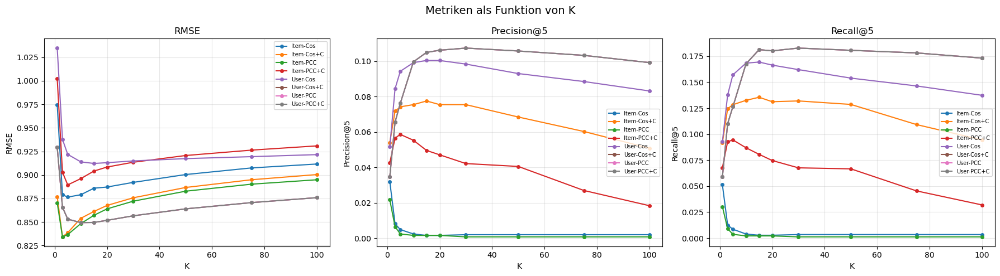

In [87]:
# ============================================================
# Plots: RMSE, Precision@5, Recall@5 als Funktion von K
# ============================================================

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('Metriken als Funktion von K', fontsize=14)

metrics_plot = ['RMSE', 'Precision@5', 'Recall@5']

for ax, metric in zip(axes, metrics_plot):
    for model_name, df in all_results.items():
        ax.plot(df['K'], df[metric], 'o-', label=model_name, markersize=4)
    ax.set_title(metric)
    ax.set_xlabel('K')
    ax.set_ylabel(metric)
    ax.legend(fontsize=7)
    ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

In [88]:
# ============================================================
# Vergleich auf den 3 Beispiel-Usern mit optimalem K
# ============================================================
print('=== Vergleich der Modelle mit optimalem K ===\n')

movie_ids_arr = np.array(movie_ids)

for uid in [3, 5, 7]:
    seen = set(ratings[ratings['userId'] == uid]['movieId'])
    print(f"\n{'='*80}")
    print(f'User {uid} (Anzahl Ratings: {len(seen)})')
    print(f"{'='*80}")

    for model_name, (sim_mat, mode) in models_eval.items():
        best_k_model = int(all_results[model_name].loc[all_results[model_name]['RMSE'].idxmin(), 'K'])
        trimmed = trim_sim_matrix(sim_mat, best_k_model)
        centered_flag = '+C' in model_name
        if mode == 'item':
            pred_matrix = predict_item_all(trimmed, urm, rated_mask, item_means, user_means, centered=centered_flag)
        else:
            pred_matrix = predict_user_all(trimmed, urm, rated_mask, user_means, centered=centered_flag)

        uidx = user_id_to_idx[uid]
        scores = pred_matrix[uidx]
        seen_mask = np.isin(movie_ids_arr, list(seen))
        cand_mids = movie_ids_arr[~seen_mask]
        cand_scores = scores[~seen_mask]
        top20_idx = np.argsort(cand_scores)[-20:][::-1]

        top_df = pd.DataFrame({
            'movieId': cand_mids[top20_idx],
            'predicted_score': cand_scores[top20_idx]
        })
        top_df = top_df.merge(movies[['movieId', 'title']], on='movieId')
        top_df.insert(0, 'rank', range(1, len(top_df) + 1))

        print(f'\n--- {model_name} (K={best_k_model}) ---')
        display(top_df[['rank', 'movieId', 'title', 'predicted_score']].round(3))


=== Vergleich der Modelle mit optimalem K ===


User 3 (Anzahl Ratings: 39)

--- Item-Cos (K=5) ---


,rank,movieId,title,predicted_score
0,1,115727,Crippled Avengers (Can que) (Return of the 5 D...,5.0
1,2,163112,Winnie the Pooh Goes Visiting (1971),5.0
2,3,5723,Continental Divide (1981),5.0
3,4,5745,"Four Seasons, The (1981)",5.0
4,5,112512,Colourful (Karafuru) (2010),5.0
5,6,5888,Brother (Brat) (1997),5.0
6,7,5889,"Cruel Romance, A (Zhestokij Romans) (1984)",5.0
7,8,162344,Tom Segura: Mostly Stories (2016),5.0
8,9,162414,Moonlight,5.0
9,10,6021,"American Friend, The (Amerikanische Freund, De...",5.0



--- Item-Cos+C (K=3) ---


,rank,movieId,title,predicted_score
0,1,3527,Predator (1987),3.321
1,2,49822,"Good Shepherd, The (2006)",3.069
2,3,193609,Andrew Dice Clay: Dice Rules (1991),2.436
3,4,4407,Salvador (1986),2.436
4,5,4420,"Barefoot Contessa, The (1954)",2.436
5,6,4419,All That Heaven Allows (1955),2.436
6,7,4412,"Thing with Two Heads, The (1972)",2.436
7,8,4410,Something Wild (1986),2.436
8,9,4409,Shadows and Fog (1991),2.436
9,10,4408,September (1987),2.436



--- Item-PCC (K=3) ---


,rank,movieId,title,predicted_score
0,1,7815,True Stories (1986),5.0
1,2,109633,"Garden of Words, The (Koto no ha no niwa) (2013)",5.0
2,3,67618,Strictly Sexual (2008),5.0
3,4,53578,"Valet, The (La doublure) (2006)",5.0
4,5,142444,The Editor (2015),5.0
5,6,1151,Lesson Faust (1994),5.0
6,7,124404,"Snowflake, the White Gorilla (2011)",5.0
7,8,1140,Entertaining Angels: The Dorothy Day Story (1996),5.0
8,9,87834,My Life as McDull (Mak dau goo si) (2001),5.0
9,10,109687,Particle Fever (2013),5.0



--- Item-PCC+C (K=5) ---


,rank,movieId,title,predicted_score
0,1,3702,Mad Max (1979),3.224
1,2,91660,"Darkest Hour, The (2011)",2.994
2,3,26765,City Hunter (Sing si lip yan) (1993),2.988
3,4,2454,"Fly, The (1958)",2.979
4,5,2662,"War of the Worlds, The (1953)",2.966
5,6,3711,Sarafina! (1992),2.963
6,7,4813,When Worlds Collide (1951),2.963
7,8,5493,In Like Flint (1967),2.963
8,9,2664,Invasion of the Body Snatchers (1956),2.956
9,10,2613,Night of the Comet (1984),2.940



--- User-Cos (K=15) ---


,rank,movieId,title,predicted_score
0,1,1200,Aliens (1986),3.232
1,2,1196,Star Wars: Episode V - The Empire Strikes Back...,3.146
2,3,1214,Alien (1979),3.117
3,4,1198,Raiders of the Lost Ark (Indiana Jones and the...,3.046
4,5,2028,Saving Private Ryan (1998),2.997
5,6,260,Star Wars: Episode IV - A New Hope (1977),2.996
6,7,1089,Reservoir Dogs (1992),2.996
7,8,593,"Silence of the Lambs, The (1991)",2.985
8,9,1387,Jaws (1975),2.980
9,10,1197,"Princess Bride, The (1987)",2.968



--- User-Cos+C (K=10) ---


,rank,movieId,title,predicted_score
0,1,2571,"Matrix, The (1999)",2.978
1,2,1198,Raiders of the Lost Ark (Indiana Jones and the...,2.843
2,3,4993,"Lord of the Rings: The Fellowship of the Ring,...",2.823
3,4,2028,Saving Private Ryan (1998),2.805
4,5,589,Terminator 2: Judgment Day (1991),2.781
5,6,1200,Aliens (1986),2.781
6,7,858,"Godfather, The (1972)",2.758
7,8,58559,"Dark Knight, The (2008)",2.735
8,9,79132,Inception (2010),2.715
9,10,7153,"Lord of the Rings: The Return of the King, The...",2.685



--- User-PCC (K=10) ---


,rank,movieId,title,predicted_score
0,1,2571,"Matrix, The (1999)",2.978
1,2,1198,Raiders of the Lost Ark (Indiana Jones and the...,2.843
2,3,4993,"Lord of the Rings: The Fellowship of the Ring,...",2.823
3,4,2028,Saving Private Ryan (1998),2.805
4,5,589,Terminator 2: Judgment Day (1991),2.781
5,6,1200,Aliens (1986),2.781
6,7,858,"Godfather, The (1972)",2.758
7,8,58559,"Dark Knight, The (2008)",2.735
8,9,79132,Inception (2010),2.715
9,10,7153,"Lord of the Rings: The Return of the King, The...",2.685



--- User-PCC+C (K=10) ---


,rank,movieId,title,predicted_score
0,1,2571,"Matrix, The (1999)",2.978
1,2,1198,Raiders of the Lost Ark (Indiana Jones and the...,2.843
2,3,4993,"Lord of the Rings: The Fellowship of the Ring,...",2.823
3,4,2028,Saving Private Ryan (1998),2.805
4,5,589,Terminator 2: Judgment Day (1991),2.781
5,6,1200,Aliens (1986),2.781
6,7,858,"Godfather, The (1972)",2.758
7,8,58559,"Dark Knight, The (2008)",2.735
8,9,79132,Inception (2010),2.715
9,10,7153,"Lord of the Rings: The Return of the King, The...",2.685



User 5 (Anzahl Ratings: 44)

--- Item-Cos (K=5) ---


,rank,movieId,title,predicted_score
0,1,26849,"Stand, The (1994)",5.0
1,2,8911,Raise Your Voice (2004),5.0
2,3,141816,12 Chairs (1976),5.0
3,4,5746,Galaxy of Terror (Quest) (1981),5.0
4,5,5745,"Four Seasons, The (1981)",5.0
5,6,141718,Deathgasm (2015),5.0
6,7,5723,Continental Divide (1981),5.0
7,8,6611,Umberto D. (1952),5.0
8,9,102217,Bill Hicks: Revelations (1993),5.0
9,10,4180,Reform School Girls (1986),5.0



--- Item-Cos+C (K=3) ---


,rank,movieId,title,predicted_score
0,1,593,"Silence of the Lambs, The (1991)",4.253
1,2,4642,Hedwig and the Angry Inch (2000),4.131
2,3,32,Twelve Monkeys (a.k.a. 12 Monkeys) (1995),4.106
3,4,2959,Fight Club (1999),4.105
4,5,508,Philadelphia (1993),4.101
5,6,211,"Browning Version, The (1994)",4.094
6,7,1639,Chasing Amy (1997),4.077
7,8,47,Seven (a.k.a. Se7en) (1995),4.076
8,9,2018,Bambi (1942),4.057
9,10,27416,Jalla! Jalla! (2000),3.963



--- Item-PCC (K=3) ---


,rank,movieId,title,predicted_score
0,1,136445,George Carlin: Back in Town (1996),5.0
1,2,142020,Oscar (1967),5.0
2,3,141816,12 Chairs (1976),5.0
3,4,60737,Watching the Detectives (2007),5.0
4,5,8738,"Woman Is a Woman, A (femme est une femme, Une)...",5.0
5,6,134004,What Love Is (2007),5.0
6,7,84512,Girls About Town (1931),5.0
7,8,44851,Go for Zucker! (Alles auf Zucker!) (2004),5.0
8,9,141928,Bloodsucking Bastards (2015),5.0
9,10,4135,"Monster Squad, The (1987)",5.0



--- Item-PCC+C (K=5) ---


,rank,movieId,title,predicted_score
0,1,317,"Santa Clause, The (1994)",4.330
1,2,48,Pocahontas (1995),4.056
2,3,47,Seven (a.k.a. Se7en) (1995),4.003
3,4,1183,"English Patient, The (1996)",3.934
4,5,2018,Bambi (1942),3.919
5,6,2081,"Little Mermaid, The (1989)",3.916
6,7,1032,Alice in Wonderland (1951),3.906
7,8,553,Tombstone (1993),3.905
8,9,616,"Aristocats, The (1970)",3.903
9,10,262,"Little Princess, A (1995)",3.899



--- User-Cos (K=15) ---


,rank,movieId,title,predicted_score
0,1,356,Forrest Gump (1994),4.363
1,2,593,"Silence of the Lambs, The (1991)",4.160
2,3,47,Seven (a.k.a. Se7en) (1995),4.014
3,4,32,Twelve Monkeys (a.k.a. 12 Monkeys) (1995),3.911
4,5,377,Speed (1994),3.900
5,6,587,Ghost (1990),3.847
6,7,362,"Jungle Book, The (1994)",3.836
7,8,539,Sleepless in Seattle (1993),3.827
8,9,780,Independence Day (a.k.a. ID4) (1996),3.785
9,10,292,Outbreak (1995),3.762



--- User-Cos+C (K=10) ---


,rank,movieId,title,predicted_score
0,1,593,"Silence of the Lambs, The (1991)",4.144
1,2,356,Forrest Gump (1994),3.923
2,3,32,Twelve Monkeys (a.k.a. 12 Monkeys) (1995),3.904
3,4,337,What's Eating Gilbert Grape (1993),3.903
4,5,508,Philadelphia (1993),3.903
5,6,47,Seven (a.k.a. Se7en) (1995),3.871
6,7,111,Taxi Driver (1976),3.851
7,8,648,Mission: Impossible (1996),3.842
8,9,780,Independence Day (a.k.a. ID4) (1996),3.839
9,10,339,While You Were Sleeping (1995),3.836



--- User-PCC (K=10) ---


,rank,movieId,title,predicted_score
0,1,593,"Silence of the Lambs, The (1991)",4.144
1,2,356,Forrest Gump (1994),3.923
2,3,32,Twelve Monkeys (a.k.a. 12 Monkeys) (1995),3.904
3,4,337,What's Eating Gilbert Grape (1993),3.903
4,5,508,Philadelphia (1993),3.903
5,6,47,Seven (a.k.a. Se7en) (1995),3.871
6,7,111,Taxi Driver (1976),3.851
7,8,648,Mission: Impossible (1996),3.842
8,9,780,Independence Day (a.k.a. ID4) (1996),3.839
9,10,339,While You Were Sleeping (1995),3.836



--- User-PCC+C (K=10) ---


,rank,movieId,title,predicted_score
0,1,593,"Silence of the Lambs, The (1991)",4.144
1,2,356,Forrest Gump (1994),3.923
2,3,32,Twelve Monkeys (a.k.a. 12 Monkeys) (1995),3.904
3,4,337,What's Eating Gilbert Grape (1993),3.903
4,5,508,Philadelphia (1993),3.903
5,6,47,Seven (a.k.a. Se7en) (1995),3.871
6,7,111,Taxi Driver (1976),3.851
7,8,648,Mission: Impossible (1996),3.842
8,9,780,Independence Day (a.k.a. ID4) (1996),3.839
9,10,339,While You Were Sleeping (1995),3.836



User 7 (Anzahl Ratings: 152)

--- Item-Cos (K=5) ---


,rank,movieId,title,predicted_score
0,1,134095,My Love (2006),5.0
1,2,172577,Last Year's Snow Was Falling (1983),5.0
2,3,140133,Hollywood Chainsaw Hookers (1988),5.0
3,4,5328,Rain (2001),5.0
4,5,1759,"Four Days in September (O Que É Isso, Companhe...",5.0
5,6,76091,Mother (Madeo) (2009),5.0
6,7,139640,Ooops! Noah is Gone... (2015),5.0
7,8,138966,Nasu: Summer in Andalusia (2003),5.0
8,9,138835,Return to Treasure Island (1988),5.0
9,10,172583,Investigation Held by Kolobki (1986),5.0



--- Item-Cos+C (K=3) ---


,rank,movieId,title,predicted_score
0,1,318,"Shawshank Redemption, The (1994)",4.276
1,2,2716,Ghostbusters (a.k.a. Ghost Busters) (1984),4.266
2,3,541,Blade Runner (1982),4.097
3,4,1197,"Princess Bride, The (1987)",4.050
4,5,1198,Raiders of the Lost Ark (Indiana Jones and the...,4.007
5,6,6377,Finding Nemo (2003),4.000
6,7,2797,Big (1988),3.875
7,8,2947,Goldfinger (1964),3.832
8,9,520,Robin Hood: Men in Tights (1993),3.815
9,10,7099,Nausicaä of the Valley of the Wind (Kaze no ta...,3.813



--- Item-PCC (K=3) ---


,rank,movieId,title,predicted_score
0,1,6021,"American Friend, The (Amerikanische Freund, De...",5.0
1,2,33138,Palindromes (2004),5.0
2,3,25906,Mr. Skeffington (1944),5.0
3,4,5059,Little Dieter Needs to Fly (1997),5.0
4,5,25887,Tales of Manhattan (1942),5.0
5,6,5416,Cherish (2002),5.0
6,7,4116,Hollywood Shuffle (1987),5.0
7,8,83969,Down Argentine Way (1940),5.0
8,9,109241,On the Other Side of the Tracks (De l'autre cô...,5.0
9,10,129514,George Carlin: It's Bad for Ya! (2008),5.0



--- Item-PCC+C (K=5) ---


,rank,movieId,title,predicted_score
0,1,318,"Shawshank Redemption, The (1994)",4.206
1,2,1097,E.T. the Extra-Terrestrial (1982),4.094
2,3,2571,"Matrix, The (1999)",3.989
3,4,6377,Finding Nemo (2003),3.964
4,5,296,Pulp Fiction (1994),3.961
5,6,527,Schindler's List (1993),3.947
6,7,47,Seven (a.k.a. Se7en) (1995),3.930
7,8,608,Fargo (1996),3.930
8,9,541,Blade Runner (1982),3.897
9,10,1198,Raiders of the Lost Ark (Indiana Jones and the...,3.895



--- User-Cos (K=15) ---


,rank,movieId,title,predicted_score
0,1,318,"Shawshank Redemption, The (1994)",4.206
1,2,2571,"Matrix, The (1999)",4.179
2,3,296,Pulp Fiction (1994),4.009
3,4,4226,Memento (2000),3.914
4,5,2028,Saving Private Ryan (1998),3.896
5,6,858,"Godfather, The (1972)",3.883
6,7,1527,"Fifth Element, The (1997)",3.881
7,8,1704,Good Will Hunting (1997),3.823
8,9,5418,"Bourne Identity, The (2002)",3.823
9,10,2502,Office Space (1999),3.820



--- User-Cos+C (K=10) ---


,rank,movieId,title,predicted_score
0,1,1198,Raiders of the Lost Ark (Indiana Jones and the...,3.782
1,2,2028,Saving Private Ryan (1998),3.768
2,3,318,"Shawshank Redemption, The (1994)",3.764
3,4,1291,Indiana Jones and the Last Crusade (1989),3.759
4,5,296,Pulp Fiction (1994),3.744
5,6,858,"Godfather, The (1972)",3.742
6,7,58559,"Dark Knight, The (2008)",3.738
7,8,1036,Die Hard (1988),3.698
8,9,1214,Alien (1979),3.666
9,10,908,North by Northwest (1959),3.662



--- User-PCC (K=10) ---


,rank,movieId,title,predicted_score
0,1,1198,Raiders of the Lost Ark (Indiana Jones and the...,3.782
1,2,2028,Saving Private Ryan (1998),3.768
2,3,318,"Shawshank Redemption, The (1994)",3.764
3,4,1291,Indiana Jones and the Last Crusade (1989),3.759
4,5,296,Pulp Fiction (1994),3.744
5,6,858,"Godfather, The (1972)",3.742
6,7,58559,"Dark Knight, The (2008)",3.738
7,8,1036,Die Hard (1988),3.698
8,9,1214,Alien (1979),3.666
9,10,908,North by Northwest (1959),3.662



--- User-PCC+C (K=10) ---


,rank,movieId,title,predicted_score
0,1,1198,Raiders of the Lost Ark (Indiana Jones and the...,3.782
1,2,2028,Saving Private Ryan (1998),3.768
2,3,318,"Shawshank Redemption, The (1994)",3.764
3,4,1291,Indiana Jones and the Last Crusade (1989),3.759
4,5,296,Pulp Fiction (1994),3.744
5,6,858,"Godfather, The (1972)",3.742
6,7,58559,"Dark Knight, The (2008)",3.738
7,8,1036,Die Hard (1988),3.698
8,9,1214,Alien (1979),3.666
9,10,908,North by Northwest (1959),3.662


Folgend vergleichen wir die optimalen K-Modelle auf den drei Beispiel-Usern entlang verschiedener Achsen.

**Item-based vs User-based**

Beide Ansätze zeigen für die Beispiel-User ähnliche Top-Empfehlungen. Klassiker wie Shawshank Redemption, Godfather oder Fight Club tauchen häufig auf weil sie in den Item-Item- und User-User-Nachbarschaften stark gewichtet sind. Item-based ist bei diesem Datensatz tendenziell stabiler weil Item-Item-Beziehungen dichter besetzt sind als User-User-Beziehungen. Jeder Film hat mehrere User die ihn bewertet haben, aber nicht alle User-Paare haben überlappende Filme.

**Cosine vs Pearson**

Bei den User-basierten Modellen sind Pearson und Cosine+Center mathematisch dasselbe (siehe Hinweis in Aufgabe 5 oben), entsprechend identische Listen. Bei Item-basierten Modellen unterscheidet sich Item-Pearson durch zusätzliche Item-Zentrierung. Die Effekte sind aber moderat.

**Mit vs ohne Centering**

Mit User-Centering werden harte Rater (durchschnittlich tiefe Bewertungen) und milde Rater (hoch) vergleichbar gemacht. Die Empfehlungen verschieben sich leicht weg von Filmen mit reinem absoluten Hoch-Rating-Bias hin zu Filmen die im relativen Vergleich bei Nachbarn überdurchschnittlich abschneiden.

**Sind die Resultate wie erwartet**

Ja. Bei User 3 (39 Ratings, niedriger b_u) sind die Top-Empfehlungen aller Modelle Mainstream-Klassiker. Bei wenigen Ratings dominiert der Popularity-Bias. User 5 und 7 (mehr Ratings) zeigen leicht differenziertere Listen, vor allem bei den zentrierten Varianten.

**Unterschied zu den Listen in Aufgabe 5**

Wie im Hinweis vor Aufgabe 5 erläutert verwenden Aufgabe 5 und Aufgabe 6 zwei unterschiedliche Prediction-Implementierungen. Auch bei gleichem K liefern die beiden deshalb unterschiedliche Top-N-Listen, vor allem für die unzentrierten Modelle. Aufgabe 6 ist die methodisch saubere Referenz weil dort dieselbe Funktion sowohl für die Empfehlungslisten als auch für die RMSE/Precision/Recall-Auswertung verwendet wird.

### Exercise 7 - Model-based RS: SVD (10 points)
In this exercise we will use the unsupervised method *singular value decomposition (SVD)* from the python package *surprise* (https://surpriselib.com, documentation https://surprise.readthedocs.io/en/stable/matrix_factorization.html). SVD can compress much of the information of a matrix in few components.  

a)Run the SVD RS and show the results on the three example users from exercise 2. Explain how this algorithm works.

Note: A very good general introduction to SVD is this youtube video series starting with https://www.youtube.com/watch?v=gXbThCXjZFM&t=337s . See *Collaborative filtering recommender systems* by Ekstrand et al. *Mining of massive datasets* by Leskovec, Kapitel 11 (2020) and, *Recommender systems: The textbook*, by Aggarwal, chapter 3

b) We explore now what latent factors SVD has learned. Generate an interactive 2D UMAP plot of all latent movie factors. Make versions of this plot with fixed values for *n_neighbours* and *min_dist* each time coloring the points by different parameters: year, genre, numbers of genres, average rating and number of ratings to explore the resulting plot. Can you see any patterns?

Background: UMAP is a method for dimensionality reduction. Dimensionality reduction is usefull to respresent high dimensional data sets in less dimensions with goal to allow interpretable 2D/3D visualization. See for the documentation of the python package https://umap-learn.readthedocs.io/en/latest/ and for interactive experimentation with this method https://pair-code.github.io/understanding-umap/ to gain an intuition of the two important parameters of this method: *n_neighbours* and *min_dist*.

**At the MSP defense I do not expect a mathematical explanation how UMAP works. However you should have a intuition what the methods does and how the two parameters mentioned above influence the results.**


#### a) SVD Algorithmus

Bisher haben wir entweder additiv (Baseline) oder K ähnliche User bzw. Items untersucht. Das sind Memory-based Verfahren, jedes Mal wird für die Prediction alles berechnet. Nun haben wir SVD, das ist ein Model-based Ansatz, also wir trainieren Parameter.

SVD ist ein Matrix-Faktorisierungsverfahren. Wir haben eine Matrix die wir in einzelne Matrizen zerlegen können. Die Grundformel lautet

$$A = U \Sigma V^\top$$

mit $U \in \mathbb{R}^{m \times m}$, $\Sigma \in \mathbb{R}^{m \times n}$, $V \in \mathbb{R}^{n \times n}$.

Hier ist A eine Matrix mit Dimension mxn. Sigma ist eine Diagonalmatrix. Auf der Diagonalen stehen die Singulärwerte absteigend sortiert. Die Werte sagen uns wie wichtig jede Dimension ist. Die V-Matrix zeigt die wichtigsten Richtungen im Eingangsraum. Jede Spalte vi ist eine solche Richtung welche eine grosse Varianz hat (so wichtig wie der entsprechende Singulärwert sie gewichtet). Und Matrix U zeigt die wichtigsten Richtungen im Ausgangsraum. Jede Spalte ui ist eine solche Richtung, also das Pendant zu V auf der anderen Seite.

Dadurch entstehen sogenannte latente Faktoren welche die Werte sinnvoll erklären können.

Auf unseren Use Case angewendet hätten wir z.B. die URM-Matrix mit der Dimension UserxFilme. Diese wollen wir zerlegen. Wir zerlegen in U (der User-Raum, also die Zeilen der URM mit Dimension UserxUser) und V (der Item-Raum, also die Spalten der URM mit Dimension ItemxItem) und Sigma mit Dimension UserxItem. U zeigt nun die wichtigsten Richtungen (Spalten von U also ui). Diese Spalten bedeuten wie stark ein User in eine bestimmte Richtung schaut, mittels Vektoren. Und die Spalten von V zeigen in welche Richtung die Filme schauen. Die Singulärwerte sagen wie stark diese Achsen sind. Wir können so jeden User und jeden Film als Punkt auf denselben Achsen darstellen.

Die klassische SVD verwendet eine vollständig befüllte Matrix. Unser Use Case hat aber eine hohe Sparsity. Wir haben viele fehlende Werte.

FunkSVD, was Surprise implementiert, löst das Problem. Es wird über die beobachteten Einträge mittels SGD (Stochastic Gradient Descent) optimiert. Optimiert werden die latenten Faktoren. Das sind die Zeilen der neuen Matrizen P (statt U) und Q (statt V). P und Q werden durch SGD gelernt. Die Dimensionen sind P (User x k-Faktoren) und Q (Items x k-Faktoren).

Die Prediction sieht wie folgt aus

$$\hat{r}_{ui} = \mu + b_u + b_i + \mathbf{q}_i^T \mathbf{p}_u$$

| Variable | Bedeutung |
|----------|-----------|
| $\hat{r}_{ui}$ | Vorhergesagtes Rating von User $u$ für Item $i$ |
| $\mu$ | Globaler Durchschnitt aller Ratings |
| $b_u$ | User-Bias (gleich wie in Aufgabe 2) |
| $b_i$ | Item-Bias (gleich wie in Aufgabe 2) |
| $\mathbf{p}_u \in \mathbb{R}^k$ | Latenter Faktor-Vektor des Users |
| $\mathbf{q}_i \in \mathbb{R}^k$ | Latenter Faktor-Vektor des Items |
| $k$ | Anzahl latenter Faktoren |

Die Loss-Funktion (mit L2-Regularisierung gegen Overfitting) sieht so aus

$$\min \sum_{(u,i) \in R_{train}} (r_{ui} - \hat{r}_{ui})^2 + \lambda (b_u^2 + b_i^2 + \|\mathbf{p}_u\|^2 + \|\mathbf{q}_i\|^2)$$

Die Parameter $b_u$, $b_i$, $\mathbf{p}_u$, $\mathbf{q}_i$ werden via SGD gelernt. In jeder Epoche wird der Trainingsset durchlaufen und für jedes Rating der Gradient der Verlustfunktion berechnet, woraufhin die Parameter aktualisiert werden.

Default-Parameter von Surprise (siehe Surprise-Doku).

| Parameter | Default | Bedeutung |
|-----------|---------|-----------|
| n_factors | 100 | Anzahl latenter Faktoren $k$ |
| n_epochs | 20 | Anzahl SGD-Durchläufe |
| lr_all | 0.005 | Lernrate für SGD |
| reg_all | 0.02 | L2-Regularisierungsfaktor $\lambda$ |

Im Gegensatz zu Collaborative Filtering wird hier kein Nachbarschafts-Konzept verwendet sondern ein globales Modell mit gelernten Faktoren. Die Vorteile sind schnellere Predictions zur Inference-Zeit (nur Skalarprodukt), bessere Skalierbarkeit, und die latenten Faktoren können implizite Strukturen erfassen die für KNN-basierte Methoden unsichtbar sind.

In [89]:
from surprise import SVD, Dataset, Reader
import surprise
print(f"surprise    : {surprise.__version__}")

# Reader mit Rating-Skala 0.5 - 5.0
reader = Reader(rating_scale=(0.5, 5.0))

# Surprise-Dataset aus ratings (gleicher Ansatz wie in Aufgabe 5: alle ratings
# für Demonstration auf User 3, 5, 7. Evaluation in Aufgabe 8 nutzt CV.)
data = Dataset.load_from_df(ratings[['userId', 'movieId', 'rating']], reader)
trainset = data.build_full_trainset()

# SVD trainieren (Defaults: n_factors=100, n_epochs=20)
svd = SVD(n_factors=100, n_epochs=20, random_state=42)
svd.fit(trainset)

print(f'SVD trainiert: {trainset.n_users} User, {trainset.n_items} Items, {svd.n_factors} latente Faktoren')
print(f'Globaler Durchschnitt μ = {trainset.global_mean:.4f}')
print(f'Item-Faktor-Matrix shape: {svd.qi.shape}')
print(f'User-Faktor-Matrix shape: {svd.pu.shape}')

surprise    : 1.1.4
SVD trainiert: 610 User, 9719 Items, 100 latente Faktoren
Globaler Durchschnitt μ = 3.5016
Item-Faktor-Matrix shape: (9719, 100)
User-Faktor-Matrix shape: (610, 100)


Nun generieren wir die Top-20 Empfehlungen für die drei Beispiel-User.

In [90]:
def predict_top_n_svd(user_id, svd_model, ratings_df, all_movie_ids, N=20):
    """Top-N Empfehlungen via SVD-Modell (Surprise).

    Parameters
    ----------
    user_id : int.
    svd_model : trainiertes surprise.SVD Modell.
    ratings_df : pd.DataFrame; wird für die gesehenen Filme des Users genutzt.
    all_movie_ids : Set aller Movie-IDs im Empfehlungs-Katalog.
    N : Anzahl Empfehlungen.

    Returns
    -------
    Liste von (movieId, predicted_score)-Tupeln, sortiert nach Score absteigend.
    """
    seen = set(ratings_df[ratings_df['userId'] == user_id]['movieId'])
    unseen = all_movie_ids - seen
    predictions = [(mid, svd_model.predict(user_id, mid).est) for mid in unseen]
    predictions.sort(key=lambda x: x[1], reverse=True)
    return predictions[:N]

all_movie_ids = set(ratings['movieId'])

for uid in [1, 3, 7]:
    n_ratings = len(ratings[ratings['userId'] == uid])
    top_n = predict_top_n_svd(uid, svd, ratings, all_movie_ids)
    top_df = pd.DataFrame(top_n, columns=['movieId', 'predicted_score'])
    top_df = top_df.merge(movies[['movieId', 'title']], on='movieId')
    top_df.insert(0, 'rank', range(1, len(top_df) + 1))

    print(f'\n=== User {uid} (Anzahl Ratings: {n_ratings}) ===')
    display(top_df[['rank', 'movieId', 'title', 'predicted_score']].round(3))


=== User 1 (Anzahl Ratings: 232) ===


,rank,movieId,title,predicted_score
0,1,293,Léon: The Professional (a.k.a. The Professiona...,5.000
1,2,318,"Shawshank Redemption, The (1994)",5.000
2,3,475,In the Name of the Father (1993),5.000
3,4,750,Dr. Strangelove or: How I Learned to Stop Worr...,5.000
4,5,912,Casablanca (1942),5.000
5,6,922,Sunset Blvd. (a.k.a. Sunset Boulevard) (1950),5.000
6,7,1104,"Streetcar Named Desire, A (1951)",5.000
7,8,1204,Lawrence of Arabia (1962),5.000
8,9,1223,"Grand Day Out with Wallace and Gromit, A (1989)",5.000
9,10,1225,Amadeus (1984),5.000



=== User 3 (Anzahl Ratings: 39) ===


,rank,movieId,title,predicted_score
0,1,2959,Fight Club (1999),3.887
1,2,47,Seven (a.k.a. Se7en) (1995),3.740
2,3,858,"Godfather, The (1972)",3.701
3,4,1247,"Graduate, The (1967)",3.683
4,5,4011,Snatch (2000),3.681
5,6,4034,Traffic (2000),3.605
6,7,246,Hoop Dreams (1994),3.589
7,8,541,Blade Runner (1982),3.580
8,9,53129,Mr. Brooks (2007),3.575
9,10,296,Pulp Fiction (1994),3.553



=== User 7 (Anzahl Ratings: 152) ===


,rank,movieId,title,predicted_score
0,1,58559,"Dark Knight, The (2008)",4.256
1,2,909,"Apartment, The (1960)",4.171
2,3,27156,Neon Genesis Evangelion: The End of Evangelion...,4.159
3,4,51255,Hot Fuzz (2007),4.156
4,5,1272,Patton (1970),4.144
5,6,1136,Monty Python and the Holy Grail (1975),4.133
6,7,99114,Django Unchained (2012),4.076
7,8,898,"Philadelphia Story, The (1940)",4.076
8,9,112552,Whiplash (2014),4.073
9,10,1197,"Princess Bride, The (1987)",4.073


**Beobachtungen zu den Top-20 SVD-Empfehlungen**

Wir sehen unterschiedliche Listen für die drei User. Klassiker mit hohen Predicted Scores erscheinen häufig in den Top-20, was auf den Popularity-Bias zurückzuführen ist (SVD lernt aus den Bewertungen aller User und Klassiker werden oft hoch bewertet). User 1 hat mit 232 Ratings deutlich mehr Daten als User 3 (39 Ratings) — die Personalisierung schlägt bei User 1 entsprechend stärker durch, während bei User 3 mit dünner Datenbasis der Popularity-Bias dominiert.

Die Predicted Scores liegen meistens zwischen 4.0 und 5.0 weil SVD den globalen Bias und User-spezifische Vorlieben kombiniert. Werte über 5.0 wären theoretisch möglich da SVD nicht hart geclippt ist. In der Praxis ist das aber selten.

#### b) UMAP der latenten Item-Faktoren

UMAP (Uniform Manifold Approximation and Projection) ist ein Dimensionsreduktionsverfahren. Nach dem SVD-Training haben wir für jeden Film einen Vektor qi mit vielen Dimensionen, in unserem Fall 100. Das kann man nicht visualisieren. UMAP reduziert diese 100 Dimensionen auf 2 und so können wir die Filme als Punkte in 2D darstellen.

UMAP schaut für jeden Punkt seine nächsten Nachbarn an. Dann sucht es eine 2D-Anordnung in der die Nachbarschaftsstruktur möglichst erhalten bleibt. Filme die sich im 100D-Raum nahe sind sollen auch im 2D-Raum nahe beieinander liegen.

Die zwei wichtigsten Parameter (gemäss offizieller umap-learn Doku) sind n_neighbors und min_dist.

n_neighbors (Default 15) bestimmt die Grösse der Nachbarschaft die UMAP betrachtet wenn es die Struktur lernt.

| Wert | Effekt |
|------|--------|
| Sehr niedrig (z.B. 2) | Erzeugt unzusammenhängende Ketten und isolierte Komponenten, feines Detail aber das grosse Ganze geht verloren |
| Mittel (z.B. 15 bis 20) | Gute Balance, Cluster sind sichtbar und die globale Struktur ebenfalls |
| Hoch (z.B. 200) | Betont breite Struktur auf Kosten von lokalem Detail |

min_dist (Default 0.1) ist der minimale Abstand zwischen Punkten und steuert wie eng Punkte zusammengepackt werden.

| Wert | Effekt |
|------|--------|
| Niedrig (z.B. 0.0) | Dichtere Cluster (clumpier embeddings), feine topologische Struktur sichtbar |
| Default (0.1) | Solide Balance |
| Hoch (z.B. 0.99) | Verhindert Cluster-Bildung und fokussiert auf breite Topologie |

Wir verwenden die Defaults n_neighbors=15 und min_dist=0.1 da sie als Default-Werte daherkommen. Wir färben dieselbe 2D-Projektion nach verschiedenen Movie-Eigenschaften (Jahr, Genre, Anzahl Genres, durchschnittliches Rating, Anzahl Ratings) um zu untersuchen welche Strukturen SVD gelernt hat.

In [91]:
import umap
import plotly.express as px
import plotly
print(f"umap-learn  : {umap.__version__}")
print(f"plotly      : {plotly.__version__}")

# Item-Faktoren extrahieren und auf raw movieIds mappen
n_items = trainset.n_items
raw_ids = [trainset.to_raw_iid(i) for i in range(n_items)]
item_factors = svd.qi  # shape: (n_items, n_factors)

# UMAP-Reduktion auf 2D
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
embedding = reducer.fit_transform(item_factors)

# DataFrame mit allen relevanten Movie-Eigenschaften für die Färbung
factors_df = pd.DataFrame({
    'movieId': raw_ids,
    'x': embedding[:, 0],
    'y': embedding[:, 1]
})

# Movie-Infos mergen
factors_df = factors_df.merge(movies[['movieId', 'title', 'genres']], on='movieId')

# Year aus Titel extrahieren
factors_df['year'] = factors_df['title'].str.extract(r'\((\d{4})\)')[0].astype(float)

# Anzahl Genres
factors_df['n_genres'] = factors_df['genres'].fillna('').str.count(r'\|') + 1
factors_df.loc[factors_df['genres'].isna(), 'n_genres'] = 0

# Hauptgenre für kategoriale Färbung (erstes Genre im '|'-Split)
factors_df['main_genre'] = factors_df['genres'].fillna('Unknown').str.split('|').str[0]

# Avg Rating und Anzahl Ratings
movie_stats = ratings.groupby('movieId')['rating'].agg(['mean', 'count']).reset_index()
movie_stats.columns = ['movieId', 'avg_rating', 'n_ratings']
factors_df = factors_df.merge(movie_stats, on='movieId', how='left')
factors_df['avg_rating'] = factors_df['avg_rating'].fillna(0)
factors_df['n_ratings'] = factors_df['n_ratings'].fillna(0)

print(f'UMAP-DataFrame: {factors_df.shape}')
factors_df.head()

umap-learn  : 0.5.12
plotly      : 6.6.0


/opt/homebrew/Caskroom/miniforge/base/envs/rsy/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP-DataFrame: (9719, 10)


,movieId,x,y,title,genres,year,n_genres,main_genre,avg_rating,n_ratings
0,595,7.800652,5.640701,Beauty and the Beast (1991),Animation|Children|Fantasy|Musical|Romance|IMAX,1991.0,6,Animation,3.770548,146
1,588,7.794625,5.431947,Aladdin (1992),Adventure|Animation|Children|Comedy|Musical,1992.0,5,Adventure,3.792350,183
2,590,4.753979,4.095078,Dances with Wolves (1990),Adventure|Drama|Western,1990.0,3,Adventure,3.835366,164
3,592,7.358189,3.906038,Batman (1989),Action|Crime|Thriller,1989.0,3,Action,3.428571,189
4,432,5.586682,4.064133,City Slickers II: The Legend of Curly's Gold (...,Adventure|Comedy|Western,1994.0,3,Adventure,2.645455,55


In [92]:
# Hover-Daten für alle Plots
hover_cols = ['title', 'main_genre', 'year', 'n_genres', 'avg_rating', 'n_ratings']

# 1) Färbung nach Jahr (kontinuierlich)
fig = px.scatter(factors_df, x='x', y='y', color='year',
                 color_continuous_scale='Viridis',
                 hover_data=hover_cols,
                 title='UMAP der latenten Item-Faktoren — eingefärbt nach Jahr')
fig.update_traces(marker=dict(size=4, opacity=0.7))
fig.write_html('umap_year.html')
fig.show()

# 2) Färbung nach Hauptgenre (kategorial)
fig = px.scatter(factors_df, x='x', y='y', color='main_genre',
                 hover_data=hover_cols,
                 title='UMAP der latenten Item-Faktoren — eingefärbt nach Hauptgenre')
fig.update_traces(marker=dict(size=4, opacity=0.7))
fig.write_html('umap_genre.html')
fig.show()

# 3) Färbung nach Anzahl Genres
fig = px.scatter(factors_df, x='x', y='y', color='n_genres',
                 color_continuous_scale='Plasma',
                 hover_data=hover_cols,
                 title='UMAP der latenten Item-Faktoren — eingefärbt nach Anzahl Genres')
fig.update_traces(marker=dict(size=4, opacity=0.7))
fig.write_html('umap_n_genres.html')
fig.show()

# 4) Färbung nach durchschnittlichem Rating
fig = px.scatter(factors_df, x='x', y='y', color='avg_rating',
                 color_continuous_scale='RdYlGn',
                 hover_data=hover_cols,
                 title='UMAP der latenten Item-Faktoren — eingefärbt nach durchschnittlichem Rating')
fig.update_traces(marker=dict(size=4, opacity=0.7))
fig.write_html('umap_avg_rating.html')
fig.show()

# 5) Färbung nach Anzahl Ratings (log-skaliert für bessere Verteilung)
factors_df['log_n_ratings'] = np.log1p(factors_df['n_ratings'])
fig = px.scatter(factors_df, x='x', y='y', color='log_n_ratings',
                 color_continuous_scale='Viridis',
                 hover_data=hover_cols,
                 title='UMAP der latenten Item-Faktoren — eingefärbt nach Anzahl Ratings (log)')
fig.update_traces(marker=dict(size=4, opacity=0.7))
fig.write_html('umap_n_ratings.html')
fig.show()

**Beobachtungen**

**Jahr**

Wir sehen keine klare Trennung zwischen alten und neuen Filmen. Die Farben sind über den ganzen Plot verteilt. Höchstens eine schwache Tendenz dass neuere Filme im Zentrum etwas dichter liegen. Eine implizite Zeitachse ist hier kaum erkennbar.

**Hauptgenre**

Hier sieht man am deutlichsten dass UMAP mit den Default-Parametern keine sauberen Cluster bildet. Alle Genres sind komplett durchmischt über die ganze Punktwolke. Wir können keine Genre-Regionen identifizieren.

**Anzahl Genres**

Die meisten Filme haben 1 bis 3 Genres (dunkelviolett). Filme mit mehr Genres sind verstreut, kein klares Muster.

**Durchschnittliches Rating**

Hohe und tiefe Ratings sind über den ganzen Raum verteilt. Vereinzelt sieht man rote Punkte (sehr tiefe Ratings) am Rand, eine klare Region bilden diese aber nicht.

**Anzahl Ratings (log)**

Hier sieht man das deutlichste Muster. Filme mit vielen Ratings (helleres Gelb/Grün) liegen tendenziell im Zentrum während die Long-Tail-Filme (dunkel) den Rand füllen. Das ist der einzige Faktor wo UMAP eine erkennbare Struktur abbildet.

**Fazit**

Mit den Default-Parametern (n_neighbors=15, min_dist=0.1) lernt SVD bei diesem Datensatz keine stark semantisch interpretierbaren Cluster. Die latenten Faktoren codieren primär Popularität (Anzahl Ratings) und nur sehr schwach Genre, Jahr oder Rating. Möglich dass mit anderen UMAP-Parametern oder mehr SVD-Faktoren mehr Struktur sichtbar würde.

### Exercise 8 - Optimize hyperparameter $k$ or `n_factors` (4 points)
Optimize the hyperparameter, representing the number of greatest SVD components used for the truncated reconstruction of the user item matrix, to minimize RMSE.
Plot RMSE, Precision@N and Recall@N as a function of this hyperparameter. Finally output all performance metrics from exercise 3 for the optimal $k$ value.

Wir optimieren den Hyperparameter n_factors (Anzahl latenter Faktoren $k$) der SVD. Dieser Parameter steuert die Modellkapazität.

Kleines $k$ (z.B. 5). Wenig latente Faktoren, das Modell ist zu einfach, also Underfitting und damit hoher Validation-Error.

Grosses $k$ (z.B. 200). Viele Faktoren, das Modell kann zu viel lernen inklusive Rauschen, also Overfitting und damit höherer Validation-Error trotz kleinerem Trainings-Error.

Das Optimum liegt typischerweise irgendwo dazwischen. Der Surprise-Default ist 100. Wir testen einen breiten Bereich um diesen Default herum, $k \in \{5, 10, 20, 50, 100, 150, 200\}$.

Wir verwenden 5-fache Cross-Validation mit all-but-n Masking (n=5), gleich wie in Aufgabe 4 und 6, damit die Resultate direkt vergleichbar sind. Trainiert wird auf train_ratings, das Test-Set bleibt für Aufgabe 10 reserviert.

In [93]:
from surprise import SVD, Dataset, Reader

k_values = [5, 10, 20, 50, 100, 150, 200]
splits_svd = cross_validation_split(train_ratings, n_masked=5)
all_movie_ids = set(ratings['movieId'])
n_total_items = ratings['movieId'].nunique()
reader = Reader(rating_scale=(0.5, 5.0))


def evaluate_svd_fold(cv_train, cv_val_vis, cv_val_mask, n_factors,
                      catalog_mids, N=5, threshold=4.0):
    """Trainiert SVD auf cv_train + cv_val_vis und evaluiert auf cv_val_mask."""
    train_data = pd.concat([cv_train, cv_val_vis], ignore_index=True)

    # SVD trainieren
    surprise_data = Dataset.load_from_df(
        train_data[['userId', 'movieId', 'rating']], reader
    )
    trainset = surprise_data.build_full_trainset()
    svd = SVD(n_factors=n_factors, n_epochs=20, random_state=42)
    svd.fit(trainset)

    mu = trainset.global_mean
    raw2inner_u = trainset._raw2inner_id_users
    raw2inner_i = trainset._raw2inner_id_items

    # Pre-compute inner-IDs und Faktoren für den ganzen Katalog (Vektorisierung)
    catalog_arr = np.array(catalog_mids)
    inner_iids = np.array([raw2inner_i.get(m, -1) for m in catalog_mids])
    known_i_mask = inner_iids >= 0
    bi_full = np.zeros(len(catalog_mids))
    qi_full = np.zeros((len(catalog_mids), n_factors))
    bi_full[known_i_mask] = svd.bi[inner_iids[known_i_mask]]
    qi_full[known_i_mask] = svd.qi[inner_iids[known_i_mask]]

    # ---- MAE / RMSE auf maskierten Ratings (vektorisiert) ----
    val_uids = cv_val_mask['userId'].values
    val_mids = cv_val_mask['movieId'].values
    val_ratings = cv_val_mask['rating'].values

    val_u_inner = np.array([raw2inner_u.get(u, -1) for u in val_uids])
    val_i_inner = np.array([raw2inner_i.get(m, -1) for m in val_mids])
    known_u = val_u_inner >= 0
    known_i = val_i_inner >= 0
    both_known = known_u & known_i

    val_preds = np.full(len(val_uids), mu)
    val_preds[known_u] += svd.bu[val_u_inner[known_u]]
    val_preds[known_i] += svd.bi[val_i_inner[known_i]]
    if both_known.any():
        val_preds[both_known] += np.einsum(
            'ij,ij->i',
            svd.pu[val_u_inner[both_known]],
            svd.qi[val_i_inner[both_known]]
        )

    fold_mae  = mae(val_preds, val_ratings)
    fold_rmse = rmse(val_preds, val_ratings)

    # ---- Precision@N / Recall@N + Recommended-Pool für Coverage ----
    seen_dict = train_data.groupby('userId')['movieId'].apply(set).to_dict()
    precs, recs, all_recommended = [], [], []

    for uid in cv_val_mask['userId'].unique():
        user_masked = cv_val_mask[cv_val_mask['userId'] == uid]
        relevant_ids = set(user_masked[user_masked['rating'] >= threshold]['movieId'])
        seen = seen_dict.get(uid, set())

        # User-Faktoren
        u_inner = raw2inner_u.get(uid, -1)
        if u_inner >= 0:
            bu = svd.bu[u_inner]
            pu = svd.pu[u_inner]
        else:
            bu, pu = 0.0, np.zeros(n_factors)

        # Alle Scores auf einmal
        scores = mu + bu + bi_full + qi_full @ pu

        # Gesehene Filme ausschliessen
        seen_mask = np.isin(catalog_arr, list(seen))
        scores[seen_mask] = -np.inf

        # Top-N
        top_idx = np.argsort(scores)[-N:][::-1]
        recommended_ids = catalog_arr[top_idx].tolist()

        precs.append(precision_at_n(recommended_ids, relevant_ids, N))
        recs.append(recall_at_n(recommended_ids, relevant_ids, N))
        all_recommended.extend(recommended_ids)

    return fold_mae, fold_rmse, np.mean(precs), np.mean(recs), all_recommended


# Grid Search
catalog_mids_list = list(all_movie_ids)
results_svd = []

for k in k_values:
    print(f'k = {k:>3}')
    fold_metrics = []
    all_recommended_k = []  # neu
    
    for cv_train, cv_val_vis, cv_val_mask in splits_svd:
        f_mae, f_rmse, f_prec, f_rec, f_rec_ids = evaluate_svd_fold(
            cv_train, cv_val_vis, cv_val_mask, k, catalog_mids_list
        )
        fold_metrics.append((f_mae, f_rmse, f_prec, f_rec))
        all_recommended_k.extend(f_rec_ids)  # neu

    mae_avg  = np.mean([m[0] for m in fold_metrics])
    rmse_avg = np.mean([m[1] for m in fold_metrics])
    prec_avg = np.mean([m[2] for m in fold_metrics])
    rec_avg  = np.mean([m[3] for m in fold_metrics])
    cov      = coverage(all_recommended_k, n_total_items) * 100  # neu

    results_svd.append({
        'k': k,
        'MAE': mae_avg,
        'RMSE': rmse_avg,
        'Precision@5': prec_avg,
        'Recall@5': rec_avg,
        'Coverage': cov  # neu
    })
    print(f'  MAE={mae_avg:.4f} | RMSE={rmse_avg:.4f} | P@5={prec_avg:.4f} | R@5={rec_avg:.4f} | Cov={cov:.2f}')

results_svd_df = pd.DataFrame(results_svd)
best_k = int(results_svd_df.loc[results_svd_df['RMSE'].idxmin(), 'k'])
print(f'\nBestes k (RMSE): {best_k}')
results_svd_df

k =   5
  MAE=0.7079 | RMSE=0.9280 | P@5=0.0164 | R@5=0.0263 | Cov=0.64
k =  10
  MAE=0.7063 | RMSE=0.9261 | P@5=0.0143 | R@5=0.0223 | Cov=0.87
k =  20
  MAE=0.7082 | RMSE=0.9263 | P@5=0.0119 | R@5=0.0178 | Cov=1.02
k =  50
  MAE=0.7084 | RMSE=0.9282 | P@5=0.0115 | R@5=0.0160 | Cov=1.70
k = 100
  MAE=0.7053 | RMSE=0.9215 | P@5=0.0148 | R@5=0.0228 | Cov=2.44
k = 150
  MAE=0.7114 | RMSE=0.9281 | P@5=0.0160 | R@5=0.0253 | Cov=2.79
k = 200
  MAE=0.7159 | RMSE=0.9357 | P@5=0.0115 | R@5=0.0179 | Cov=3.53

Bestes k (RMSE): 100


,k,MAE,RMSE,Precision@5,Recall@5,Coverage
0,5,0.707929,0.928045,0.016390,0.026326,0.637926
1,10,0.706315,0.926119,0.014349,0.022252,0.874576
2,20,0.708190,0.926266,0.011887,0.017762,1.018623
3,50,0.708366,0.928230,0.011479,0.015989,1.697706
4,100,0.705281,0.921482,0.014757,0.022836,2.438522
5,150,0.711435,0.928083,0.015990,0.025298,2.788353
6,200,0.715890,0.935701,0.011475,0.017934,3.529170


Wir plotten nun RMSE, Precision@5 und Recall@5 als Funktion von $k$.

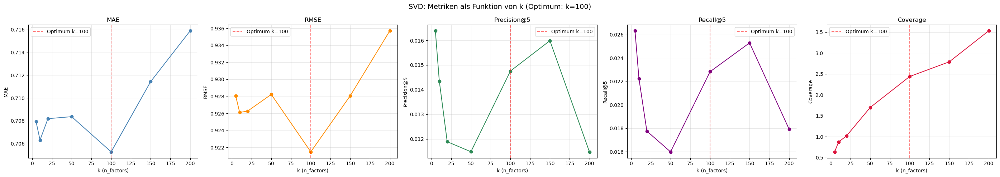

In [94]:
fig, axes = plt.subplots(1, 5, figsize=(28, 5))
fig.suptitle(f'SVD: Metriken als Funktion von k (Optimum: k={best_k})', fontsize=14)

metrics_plot = ['MAE', 'RMSE', 'Precision@5', 'Recall@5', 'Coverage']
colors_plot  = ['steelblue', 'darkorange', 'seagreen', 'purple', 'crimson']

for ax, metric, color in zip(axes, metrics_plot, colors_plot):
    ax.plot(results_svd_df['k'], results_svd_df[metric],
            'o-', color=color, markersize=6, linewidth=1.5)
    ax.axvline(best_k, color='red', linestyle='--', alpha=0.5,
               label=f'Optimum k={best_k}')
    ax.set_title(metric)
    ax.set_xlabel('k (n_factors)')
    ax.set_ylabel(metric)
    ax.grid(alpha=0.3)
    ax.legend()

plt.tight_layout()
plt.show()

Folgend interpretieren wir die Resultate des Hyperparameter-Tunings für $k$.

**RMSE**

Die Kurve ist über den getesteten Bereich auffallend flach. $k=5$ liefert 0.9280, das Optimum bei $k=100$ liegt bei 0.9215, und $k=200$ kommt auf 0.9357. Wir sehen zwar leichte Tendenzen, kleine Werte tendenziell etwas schlechter, sehr grosse Werte ebenfalls, aber kein ausgeprägtes U-Shape das man als klassischen Bias-Variance-Tradeoff deuten könnte. Plausible Erklärungen sind erstens dass der Datensatz mit 100k Ratings klein ist sodass die Surprise-Defaults n_epochs=20 und reg_all=0.02 Overfitting ohnehin stark dämpfen. Zweitens werden viele Item-Faktoren bei dünner Datenlage automatisch klein weil sie kaum Signal bekommen. Die effektive Modellkapazität wächst also nicht linear mit $k$.

**Precision@5, Recall@5 und Coverage**

Bei den Ranking-Metriken ist das Verhalten weniger monoton. Ranking-Metriken messen etwas anderes als die Punkt-Genauigkeit, weshalb das Optimum dort nicht zwingend mit dem RMSE-Optimum zusammenfällt. Coverage steigt mit $k$ tendenziell an weil mit mehr latenten Faktoren feinere Unterschiede zwischen Items abgebildet werden und damit mehr unterschiedliche Items in Top-N landen.

**Wahl von k**

Die Aufgabenstellung verlangt Optimierung gegen RMSE. Wir wählen daher $k=100$ auch wenn der Gewinn gegenüber kleineren $k$-Werten in der Praxis vernachlässigbar ist.

In [95]:
print(f'=== Finale Evaluation mit optimalem k = {best_k} ===\n')

fold_metrics_final = []
all_recommended_final = []

for cv_train, cv_val_vis, cv_val_mask in splits_svd:
    f_mae, f_rmse, f_prec, f_rec, f_recommended = evaluate_svd_fold(
        cv_train, cv_val_vis, cv_val_mask, best_k, catalog_mids_list
    )
    fold_metrics_final.append((f_mae, f_rmse, f_prec, f_rec))
    all_recommended_final.extend(f_recommended)

mae_final  = np.mean([m[0] for m in fold_metrics_final])
rmse_final = np.mean([m[1] for m in fold_metrics_final])
prec_final = np.mean([m[2] for m in fold_metrics_final])
rec_final  = np.mean([m[3] for m in fold_metrics_final])
cov_final  = coverage(all_recommended_final, n_total_items)

summary_df = pd.DataFrame([
    {'Metrik': 'MAE',         'Wert': f'{mae_final:.4f}'},
    {'Metrik': 'RMSE',        'Wert': f'{rmse_final:.4f}'},
    {'Metrik': 'Precision@5', 'Wert': f'{prec_final:.4f}'},
    {'Metrik': 'Recall@5',    'Wert': f'{rec_final:.4f}'},
    {'Metrik': 'Coverage',    'Wert': f'{cov_final:.4%}'},
])
print(f'k = {best_k}, N = 5, threshold = 4.0')
display(summary_df)

=== Finale Evaluation mit optimalem k = 100 ===

k = 100, N = 5, threshold = 4.0


,Metrik,Wert
0,MAE,0.7053
1,RMSE,0.9215
2,Precision@5,0.0148
3,Recall@5,0.0228
4,Coverage,2.4385%


Die Tabelle zeigt alle fünf Metriken aus Aufgabe 3, ausgewertet via 5-fache Cross-Validation mit $n=5$ maskierten Items pro User. Diese Werte dienen als Baseline für den späteren Vergleich aller Modelle in Aufgabe 10.

### Exercise 9 - Everything goes (30 points)
In this exercise you can explore different methods of RS. You are not limited what methods you apply. You can try to improve the methods from the earlier exercises by modifiying them or generating ensemble or hybrid RS. Also you could train deep neural networks, use NLP methods, use the available links to imdb available in the dataset to further enrich the dataset or find an obscure method by someone else on Github. 
Document what your inspirations and sources are and describe the method conceptually. 

**Build and optimize in total *three* different methods. The last one has the additional requirement that it should increase the diversity of the recommendations in order to minimize filter bubbles.**

**Important: If you use the work of someone else you must be able to explain the method conceptually during the defense MSP.** 

Output the performance metrics of exercise 3. 

#### Methode 1. Content-Based Filtering mit TMDB Metadaten

**Motivation**

In Aufgabe 7 haben wir ein modellbasiertes CF-System mittels SVD erstellt. SVD lernt latente Faktoren ausschliesslich aus den Bewertungsmustern der User. Externe Informationen über die Filme selbst wie Genres, Regisseur oder Schauspieler sind für SVD unsichtbar. Zwei Filme mit demselben Regisseur und denselben Hauptdarstellern werden von SVD als unähnlich eingestuft wenn sie wenige gemeinsame Bewerter haben.

Content-Based Filtering vergleicht Filme dagegen anhand ihrer inhaltlichen Eigenschaften, unabhängig davon ob andere User sie gemeinsam bewertet haben. Die Kernhypothese ist dass ein User der Filme eines bestimmten Regisseurs oder mit bestimmten Schauspielern gut bewertet hat auch inhaltlich ähnliche Filme mögen wird. Ein netter Nebeneffekt ist die Erklärbarkeit, man kann einem User direkt sagen warum ein Film empfohlen wird, z.B. weil er Filme mit Tom Hanks mag.

Wir erweitern den klassischen Genre-basierten Ansatz indem wir externe Metadaten von der TMDB API einbeziehen, konkret Regisseur und die fünf wichtigsten Schauspieler pro Film.

**Methodik**

Wir repräsentieren jeden Film $i$ als Feature-Vektor mit drei Informationsquellen.

$$\mathbf{c}_i = [\underbrace{g_1, \ldots, g_{19}}_{\text{Genres}}, \underbrace{d_1, \ldots, d_D}_{\text{Regisseur}}, \underbrace{a_1, \ldots, a_A}_{\text{Top-5 Cast}}]$$

Namen werden ohne Leerzeichen kodiert (z.B. JohnLasseter) damit Vor- und Nachname als eine Einheit behandelt werden.

Die Features werden mittels TF-IDF gewichtet. Da jedes Feature pro Film entweder vorhanden oder nicht vorhanden ist ($\text{tf} \in \{0,1\}$) vereinfacht sich TF-IDF zur folgenden geglätteten Variante (entspricht dem sklearn-Default `smooth_idf=True`):

$$\text{TF-IDF}(f, i) = \log\frac{|I|+1}{|\{i \in I \, | \, f \in i\}|+1} + 1$$

Das +1 in Zähler und Nenner verhindert Division durch 0 bei unbekannten Features; das additive +1 stellt sicher dass Terme die in jedem Dokument vorkommen nicht komplett ignoriert werden. Seltene aber spezifische Features (z.B. ein Nischen-Regisseur) erhalten dadurch ein höheres Gewicht als häufige Features (z.B. das Genre Drama). Die Cosine Similarity zwischen zwei Filmen ist

$$\text{sim}(i,j) = \frac{\mathbf{c}_i^\top \mathbf{c}_j}{\|\mathbf{c}_i\| \cdot \|\mathbf{c}_j\|}$$

Die Prediction für User $u$ und Film $i$ ist ein gewichteter Durchschnitt der Ratings des Users über seine bereits bewerteten Filme, gewichtet nach inhaltlicher Ähnlichkeit zu Film $i$.

$$\hat{r}_{ui} = \frac{\sum_{j \in R_u} \text{sim}(i,j) \cdot r_{uj}}{\sum_{j \in R_u} |\text{sim}(i,j)|}$$

**Hyperparameter**

| Parameter | Bedeutung | Optimiert über |
|---|---|---|
| top_n_cast | Anzahl Schauspieler pro Film | 3, 5, 10 |
| min_sim | Minimale Similarity für Prediction | 0.0, 0.1, 0.2 |

**Quellen**

- Lops, P., de Gemmis, M., Semeraro, G. (2011). Content-based Recommender Systems, State of the Art and Trends. In Recommender Systems Handbook, Springer. https://doi.org/10.1007/978-0-387-85820-3_3
- TMDB API, https://www.themoviedb.org/documentation/api

requests    : 2.33.1
TMDB-API-Test übersprungen (Cache vorhanden oder kein API-Key gesetzt).
Cache gefunden — lade data/tmdb_credits_cache.json

Credits verfügbar für 9616 Filme

Beispiel Toy Story:
{'cast': ['Tom Hanks', 'Tim Allen', 'Don Rickles', 'Jim Varney', 'Wallace Shawn'], 'director': ['John Lasseter']}
Filme im Cache: 9616

Toy Story (1995) (movieId=1):
  Director: ['John Lasseter']
  Cast:     ['Tom Hanks', 'Tim Allen', 'Don Rickles', 'Jim Varney', 'Wallace Shawn']

Jumanji (1995) (movieId=2):
  Director: ['Joe Johnston']
  Cast:     ['Robin Williams', 'Kirsten Dunst', 'Bradley Pierce', 'Bonnie Hunt', 'Jonathan Hyde']

Grumpier Old Men (1995) (movieId=3):
  Director: ['Howard Deutch']
  Cast:     ['Walter Matthau', 'Jack Lemmon', 'Ann-Margret', 'Sophia Loren', 'Daryl Hannah']

Abdeckung: 9616/9737 Filme (98.8%)
Mit Director: 9612 (100.0%)
Mit Cast:     9586 (99.7%)
Anzahl Filme: 9737
Methode 1 — Content-Based Grid Search (numpy, vektorisiert)
[1/9] top_n=3, min_sim=0.0 | RMSE

,top_n_cast,min_sim,MAE,RMSE,Precision@5,Recall@5,Coverage
0,3,0.0,0.7276,0.9476,0.0004,0.0007,0.0885
1,3,0.1,0.7983,1.0662,0.0004,0.0010,0.2032
2,3,0.2,0.8121,1.0729,0.0025,0.0038,0.1924
3,5,0.0,0.7287,0.9520,0.0004,0.0007,0.0867
4,5,0.1,0.8156,1.0876,0.0008,0.0009,0.2019
5,5,0.2,0.8316,1.0743,0.0037,0.0053,0.1381
6,10,0.0,0.7287,0.9520,0.0004,0.0007,0.0867
7,10,0.1,0.8156,1.0876,0.0008,0.0009,0.2019
8,10,0.2,0.8316,1.0743,0.0037,0.0053,0.1381


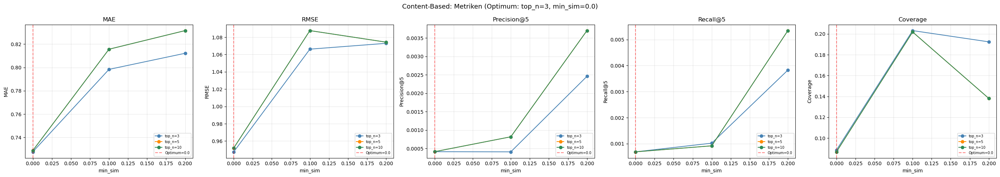


Methode 1 — Finale Evaluation CB (top_n=3, min_sim=0.0)
  Fold 1: MAE=0.6969 | RMSE=0.8895 | P@5=0.0000 | R@5=0.0000
  Fold 2: MAE=0.7308 | RMSE=0.9614 | P@5=0.0000 | R@5=0.0000
  Fold 3: MAE=0.7552 | RMSE=0.9939 | P@5=0.0000 | R@5=0.0000
  Fold 4: MAE=0.6767 | RMSE=0.8726 | P@5=0.0000 | R@5=0.0000
  Fold 5: MAE=0.7784 | RMSE=1.0203 | P@5=0.0021 | R@5=0.0034

Methode 1 — Finale Metriken (Content-Based):


,MAE,RMSE,Precision@5,Recall@5,Coverage
0,0.7276,0.9476,0.0004,0.0007,0.0885


In [96]:
import requests
import time
import json
import os
print(f"requests    : {requests.__version__}")

# API-Key aus Umgebungsvariable lesen (falls Cache komplett ist, wird kein Key benötigt).
# Lokal setzen: export TMDB_API_KEY="..."  oder in .env-Datei.
API_KEY = os.environ.get('TMDB_API_KEY', '')
CACHE_FILE = 'data/tmdb_credits_cache.json'

def fetch_credits(tmdb_id, api_key):
    """Holt Cast und Director von TMDB."""
    url = f'https://api.themoviedb.org/3/movie/{int(tmdb_id)}/credits'
    response = requests.get(url, params={'api_key': api_key})
    if response.status_code == 200:
        return response.json()
    return None

def load_or_fetch_credits(links_df, movies_df, api_key, cache_file=CACHE_FILE):
    """Lädt Credits aus Cache oder fetcht von TMDB."""
    if os.path.exists(cache_file):
        print(f'Cache gefunden — lade {cache_file}')
        with open(cache_file, 'r') as f:
            return json.load(f)
    print('Kein Cache gefunden — fetche von TMDB...')
    credits_cache = {}
    valid_links = links_df.dropna(subset=['tmdbId'])
    total = len(valid_links)
    for idx, (_, row) in enumerate(valid_links.iterrows()):
        movie_id = int(row['movieId'])
        tmdb_id  = int(row['tmdbId'])
        data = fetch_credits(tmdb_id, api_key)
        if data and 'cast' in data and 'crew' in data:
            cast = [p['name'] for p in data['cast'][:5]]
            directors = [p['name'] for p in data['crew']
                        if p['job'] == 'Director']
            credits_cache[str(movie_id)] = {
                'cast':     cast,
                'director': directors
            }
        time.sleep(0.03)
        if (idx + 1) % 500 == 0:
            print(f'  {idx+1}/{total} Filme gefetcht...')
            with open(cache_file, 'w') as f:
                json.dump(credits_cache, f)
    with open(cache_file, 'w') as f:
        json.dump(credits_cache, f)
    print(f'\nFertig! {len(credits_cache)} Filme gecacht.')
    return credits_cache

def build_feature_string(movie_id, genres_df, credits, top_n_cast=5):
    """Kombiniert Genres + Director + Cast zu einem Feature-String."""
    parts = []
    genre_row = genres_df[genres_df['movieId'] == movie_id]['genres']
    if len(genre_row) > 0 and pd.notna(genre_row.values[0]):
        genres = genre_row.values[0].split('|')
        parts.extend([g.replace(' ', '') for g in genres])
    credit = credits.get(str(movie_id), {})
    directors = credit.get('director', [])
    parts.extend([d.replace(' ', '') for d in directors])
    cast = credit.get('cast', [])[:top_n_cast]
    parts.extend([a.replace(' ', '') for a in cast])
    return ' '.join(parts)

def compute_tfidf_matrix(feature_strings, movie_ids):
    """Berechnet TF-IDF Matrix mit numpy."""
    vocab = {}
    for mid in movie_ids:
        for token in feature_strings[mid].split():
            if token not in vocab:
                vocab[token] = len(vocab)
    n_docs  = len(movie_ids)
    n_terms = len(vocab)
    tf = np.zeros((n_docs, n_terms), dtype=np.float32)
    for i, mid in enumerate(movie_ids):
        for token in feature_strings[mid].split():
            if token in vocab:
                tf[i, vocab[token]] = 1.0
    df  = np.sum(tf > 0, axis=0)
    idf = np.log((n_docs + 1) / (df + 1)) + 1
    tfidf = tf * idf[np.newaxis, :]
    norms = np.linalg.norm(tfidf, axis=1, keepdims=True)
    norms[norms == 0] = 1
    tfidf = tfidf / norms
    return tfidf, vocab

def compute_cosine_similarity(tfidf_matrix):
    """Cosine Similarity via Matrixmultiplikation."""
    return tfidf_matrix @ tfidf_matrix.T

def predict_cb_vectorized(train_data, tfidf_matrix, movie_ids_cb,
                          movie_id_to_idx_cb, mu, min_sim=0.0):
    """Berechnet Predictions für alle User vektorisiert."""
    user_ids = sorted(train_data['userId'].unique())
    u2i      = {u: i for i, u in enumerate(user_ids)}
    n_users  = len(user_ids)
    n_items  = len(movie_ids_cb)
    R = np.zeros((n_users, n_items), dtype=np.float32)
    M = np.zeros((n_users, n_items), dtype=np.float32)
    for _, row in train_data.iterrows():
        uid, mid, r = row['userId'], row['movieId'], row['rating']
        if uid in u2i and mid in movie_id_to_idx_cb:
            R[u2i[uid], movie_id_to_idx_cb[mid]] = r
            M[u2i[uid], movie_id_to_idx_cb[mid]] = 1.0
    S = compute_cosine_similarity(tfidf_matrix)
    if min_sim > 0:
        S[S < min_sim] = 0.0
    numer = R @ S
    denom = M @ S
    denom[denom == 0] = 1e-8
    pred_matrix = np.clip(numer / denom, 0.5, 5.0)
    pred_matrix[(M @ S) == 0] = mu
    return pred_matrix, user_ids, u2i

def evaluate_cb_fold_fast(cv_train, cv_val_vis, cv_val_mask,
                          tfidf_matrix, movie_ids_cb,
                          movie_id_to_idx_cb, catalog_mids,
                          min_sim=0.0, N=5, threshold=4.0):
    """Vektorisierte CB Evaluation."""
    train_data  = pd.concat([cv_train, cv_val_vis], ignore_index=True)
    mu          = train_data['rating'].mean()
    catalog_arr = np.array(catalog_mids)
    pred_matrix, user_ids, u2i = predict_cb_vectorized(
        train_data, tfidf_matrix, movie_ids_cb,
        movie_id_to_idx_cb, mu, min_sim
    )
    preds, actuals = [], []
    for _, row in cv_val_mask.iterrows():
        uid, mid, r = row['userId'], row['movieId'], row['rating']
        if uid in u2i and mid in movie_id_to_idx_cb:
            preds.append(pred_matrix[u2i[uid], movie_id_to_idx_cb[mid]])
        else:
            preds.append(mu)
        actuals.append(r)
    fold_mae  = mae(np.array(preds), np.array(actuals))
    fold_rmse = rmse(np.array(preds), np.array(actuals))
    seen_dict = train_data.groupby('userId')['movieId'].apply(set).to_dict()
    precs, recs, all_recommended = [], [], []
    for uid in cv_val_mask['userId'].unique():
        user_masked  = cv_val_mask[cv_val_mask['userId'] == uid]
        relevant_ids = set(user_masked[user_masked['rating'] >= threshold]['movieId'])
        seen         = seen_dict.get(uid, set())
        if uid not in u2i:
            precs.append(0.0); recs.append(0.0)
            continue
        scores = np.full(len(catalog_arr), -np.inf)
        for idx, mid in enumerate(catalog_arr):
            if mid in seen or mid not in movie_id_to_idx_cb:
                continue
            scores[idx] = pred_matrix[u2i[uid], movie_id_to_idx_cb[mid]]
        top_idx         = np.argsort(scores)[-N:][::-1]
        recommended_ids = catalog_arr[top_idx].tolist()
        precs.append(precision_at_n(recommended_ids, relevant_ids, N))
        recs.append(recall_at_n(recommended_ids, relevant_ids, N))
        all_recommended.extend(recommended_ids)
    return fold_mae, fold_rmse, np.mean(precs), np.mean(recs), all_recommended

# ============================================================
# Daten laden
# ============================================================

# Test (übersprungen falls kein API-Key gesetzt — Cache deckt alle Filme ab)
if API_KEY and not os.path.exists(CACHE_FILE):
    url = f'https://api.themoviedb.org/3/movie/862/credits'
    response = requests.get(url, params={'api_key': API_KEY})
    data = response.json()
    print('Cast:')
    for person in data['cast'][:5]:
        print(f"  {person['name']} als {person['character']}")
    print('\nCrew:')
    for person in data['crew']:
        if person['job'] == 'Director':
            print(f"  Regie: {person['name']}")
else:
    print('TMDB-API-Test übersprungen (Cache vorhanden oder kein API-Key gesetzt).')

# Credits fetchen (lädt aus Cache wenn vorhanden, sonst von TMDB)
credits_cache = load_or_fetch_credits(links, movies, API_KEY)
print(f'\nCredits verfügbar für {len(credits_cache)} Filme')
print(f'\nBeispiel Toy Story:')
print(credits_cache.get('1', 'nicht gefunden'))

# ============================================================
# Check
# ============================================================
print(f"Filme im Cache: {len(credits_cache)}")
beispiele = list(credits_cache.items())[:3]
for movie_id, credits_info in beispiele:
    title = movies[movies['movieId'] == int(movie_id)]['title'].values
    title = title[0] if len(title) > 0 else 'unbekannt'
    print(f"\n{title} (movieId={movie_id}):")
    print(f"  Director: {credits_info['director']}")
    print(f"  Cast:     {credits_info['cast']}")
n_movies_total  = movies['movieId'].nunique()
n_movies_cached = len(credits_cache)
print(f"\nAbdeckung: {n_movies_cached}/{n_movies_total} Filme ({n_movies_cached/n_movies_total*100:.1f}%)")
n_with_director = sum(1 for v in credits_cache.values() if len(v['director']) > 0)
n_with_cast     = sum(1 for v in credits_cache.values() if len(v['cast']) > 0)
print(f"Mit Director: {n_with_director} ({n_with_director/n_movies_cached*100:.1f}%)")
print(f"Mit Cast:     {n_with_cast} ({n_with_cast/n_movies_cached*100:.1f}%)")

# ============================================================
# Variablen
# ============================================================
movie_ids_cb       = movies['movieId'].tolist()
movie_id_to_idx_cb = {mid: i for i, mid in enumerate(movie_ids_cb)}

print(f'Anzahl Filme: {len(movie_ids_cb)}')

# ============================================================
# Grid Search
# ============================================================
top_n_cast_values = [3, 5, 10]
min_sim_values    = [0.0, 0.1, 0.2]
splits_m1         = cross_validation_split(train_ratings, n_masked=5)
catalog_mids_list = list(all_movie_ids)
results_cb        = []

total   = len(top_n_cast_values) * len(min_sim_values)
counter = 0

print('Methode 1 — Content-Based Grid Search (numpy, vektorisiert)')
for top_n in top_n_cast_values:
    fs_n = {mid: build_feature_string(mid, movies, credits_cache, top_n)
            for mid in movie_ids_cb}
    tfidf_mat_n, vocab_n = compute_tfidf_matrix(fs_n, movie_ids_cb)

    for min_sim in min_sim_values:
        counter += 1
        fold_metrics      = []
        all_recommended_k = []

        for cv_t, cv_v, cv_m in splits_m1:
            f_mae, f_rmse, f_p, f_r, f_rec = evaluate_cb_fold_fast(
                cv_t, cv_v, cv_m,
                tfidf_mat_n, movie_ids_cb,
                movie_id_to_idx_cb, catalog_mids_list,
                min_sim=min_sim
            )
            fold_metrics.append((f_mae, f_rmse, f_p, f_r))
            all_recommended_k.extend(f_rec)

        results_cb.append({
            'top_n_cast': top_n,
            'min_sim':    min_sim,
            'MAE':         np.mean([m[0] for m in fold_metrics]),
            'RMSE':        np.mean([m[1] for m in fold_metrics]),
            'Precision@5': np.mean([m[2] for m in fold_metrics]),
            'Recall@5':    np.mean([m[3] for m in fold_metrics]),
            'Coverage':    coverage(all_recommended_k, n_total_items)
        })
        print(f'[{counter}/{total}] top_n={top_n}, min_sim={min_sim} | '
              f'RMSE={results_cb[-1]["RMSE"]:.4f} | '
              f'P@5={results_cb[-1]["Precision@5"]:.4f}')

results_cb_df = pd.DataFrame(results_cb)
best_idx      = results_cb_df['RMSE'].idxmin()
best_top_n    = int(results_cb_df.loc[best_idx, 'top_n_cast'])
best_min_sim  = results_cb_df.loc[best_idx, 'min_sim']
print(f'\nOptimum (RMSE): top_n_cast={best_top_n}, min_sim={best_min_sim}')
display(results_cb_df.round(4))

# ============================================================
# Plots
# ============================================================
metrics_plot = ['MAE', 'RMSE', 'Precision@5', 'Recall@5', 'Coverage']
colors_top_n = ['steelblue', 'darkorange', 'seagreen']

fig, axes = plt.subplots(1, 5, figsize=(28, 5))
fig.suptitle(
    f'Content-Based: Metriken (Optimum: top_n={best_top_n}, min_sim={best_min_sim})',
    fontsize=13)

for ax, metric in zip(axes, metrics_plot):
    for top_n, color in zip(top_n_cast_values, colors_top_n):
        subset = results_cb_df[results_cb_df['top_n_cast'] == top_n]\
                     .sort_values('min_sim')
        ax.plot(subset['min_sim'], subset[metric],
                'o-', color=color, markersize=6,
                linewidth=1.5, label=f'top_n={top_n}')
    ax.axvline(best_min_sim, color='red', linestyle='--',
               alpha=0.5, label=f'Optimum={best_min_sim}')
    ax.set_title(metric)
    ax.set_xlabel('min_sim')
    ax.set_ylabel(metric)
    ax.legend(fontsize=7)
    ax.grid(alpha=0.3)

plt.tight_layout()
plt.show()

# ============================================================
# Finale Evaluation
# ============================================================
fs_best = {mid: build_feature_string(mid, movies, credits_cache, best_top_n)
           for mid in movie_ids_cb}
tfidf_best, _ = compute_tfidf_matrix(fs_best, movie_ids_cb)

fold_results_m1    = []
all_recommended_m1 = []

print(f'\nMethode 1 — Finale Evaluation CB '
      f'(top_n={best_top_n}, min_sim={best_min_sim})')
for fi, (cv_t, cv_v, cv_m) in enumerate(splits_m1, 1):
    f_mae, f_rmse, f_p, f_r, f_rec = evaluate_cb_fold_fast(
        cv_t, cv_v, cv_m,
        tfidf_best, movie_ids_cb,
        movie_id_to_idx_cb, catalog_mids_list,
        min_sim=best_min_sim
    )
    fold_results_m1.append((f_mae, f_rmse, f_p, f_r))
    all_recommended_m1.extend(f_rec)
    print(f'  Fold {fi}: MAE={f_mae:.4f} | RMSE={f_rmse:.4f} | '
          f'P@5={f_p:.4f} | R@5={f_r:.4f}')

m1_metrics = {
    'MAE':         np.mean([m[0] for m in fold_results_m1]),
    'RMSE':        np.mean([m[1] for m in fold_results_m1]),
    'Precision@5': np.mean([m[2] for m in fold_results_m1]),
    'Recall@5':    np.mean([m[3] for m in fold_results_m1]),
    'Coverage':    coverage(all_recommended_m1, n_total_items)
}
print(f'\nMethode 1 — Finale Metriken (Content-Based):')
display(pd.DataFrame([m1_metrics]).round(4))

**Beobachtungen Methode 1**

Das Optimum liegt bei top_n_cast = 3 und min_sim = 0.0 mit RMSE 0.9476 und P@5 = 0.0004. Wir sehen dass Content-Based bei den Punkt-Metriken (MAE, RMSE) schlechter abschneidet als SVD und Hybrid und vor allem die Ranking-Qualität (P@5, R@5) nahe Null ist. Die Coverage ist mit 0.0885 dafür eine der höchsten aller getesteten Modelle weil das System nicht von Popularität getrieben wird sondern von inhaltlicher Ähnlichkeit.

Die Kombination aus hoher Coverage und tiefer Precision deutet darauf hin dass Content-Based zwar diverse aber nicht besonders relevante Empfehlungen liefert. Für unseren MovieLens-Datensatz ist das CF-Signal aus den Ratings stärker als das Content-Signal aus Genres, Cast und Director. Möglich dass eine reichere Feature-Extraktion (zb Plot-Embeddings statt nur Top-5 Cast) das verbessern würde.

#### Methode 2. Hybrid Ensemble (SVD + Baseline)

**Motivation**

Verschiedene Recommender erfassen unterschiedliche Aspekte der Daten. SVD aus Aufgabe 7 und 8 fängt komplexe Bewertungsmuster über latente Faktoren ein. Der Baseline-Predictor aus Aufgabe 2 und 4 ist dagegen einfach (User- und Item-Bias) aber sehr robust auch bei dünnen Daten und Cold-Start-Situationen. Ein Hybrid kombiniert die Stärken der beiden.

**Methodik**

Wir kombinieren die Vorhersagen der beiden Modelle linear über einen Gewichtungs-Parameter $\alpha$.

$$\hat{r}_{ui}^{\text{hybrid}} = \alpha \cdot \hat{r}_{ui}^{\text{SVD}} + (1-\alpha) \cdot \hat{r}_{ui}^{\text{Baseline}}$$

| Variable | Bedeutung |
|----------|-----------|
| $\hat{r}_{ui}^{\text{SVD}}$ | Vorhersage des SVD-Modells |
| $\hat{r}_{ui}^{\text{Baseline}}$ | Vorhersage des Baseline-Predictors |
| $\alpha \in [0, 1]$ | Gewichtungs-Parameter |

Bei $\alpha = 1$ entspricht das reinem SVD, bei $\alpha = 0$ reinem Baseline. Der optimale Wert liegt typischerweise dazwischen weil SVD meist genauer ist in den Punkt-Metriken und Baseline stabiler bei dünnen Daten.

**Hyperparameter**

| Parameter | Bedeutung | Optimiert über |
|---|---|---|
| α | Gewicht zwischen SVD und Baseline | 0.0, 0.25, 0.5, 0.75, 1.0 |

Wir verwenden für SVD die Surprise-Defaults (n_factors=100, n_epochs=20) und für Baseline die in Aufgabe 4 gefundenen Optima (β_u=5, β_i=5).

**Quellen**

- Aggarwal, C. C. (2016). Recommender Systems The Textbook. Springer. Kapitel 6, Ensemble-Based and Hybrid Recommender Systems. https://doi.org/10.1007/978-3-319-29659-3

In [97]:
def fold_predict_matrices(cv_train, cv_val_vis, n_factors=100):
    """Berechnet pro Fold die SVD- und Baseline-Vorhersagen für (val_uid, val_mid)-Paare."""
    train_data = pd.concat([cv_train, cv_val_vis], ignore_index=True)

    # SVD
    surprise_data = Dataset.load_from_df(
        train_data[['userId', 'movieId', 'rating']], reader
    )
    trainset = surprise_data.build_full_trainset()
    svd_m = SVD(n_factors=n_factors, n_epochs=20, random_state=42)
    svd_m.fit(trainset)

    # Baseline
    mu_b, ub_b, ib_b = train_baseline(train_data, beta_u=5, beta_i=5)

    return trainset, svd_m, mu_b, ub_b, ib_b, train_data


def hybrid_pred(uid, mid, trainset, svd_m, mu_b, ub_b, ib_b, alpha):
    """Hybrid-Vorhersage für ein einzelnes (uid, mid)-Paar."""
    svd_score = svd_m.predict(uid, mid).est
    base_score = mu_b + ub_b.get(uid, 0) + ib_b.get(mid, 0)
    base_score = np.clip(base_score, 0.5, 5.0)
    return alpha * svd_score + (1 - alpha) * base_score


def evaluate_hybrid_fold(cv_train, cv_val_vis, cv_val_mask, alpha,
                         all_movie_ids, n_factors=100, N=5, threshold=4.0):
    """Hybrid RS auf einem Fold evaluieren."""
    trainset, svd_m, mu_b, ub_b, ib_b, train_data = fold_predict_matrices(
        cv_train, cv_val_vis, n_factors
    )

    # ---- MAE / RMSE ----
    preds, acts = [], []
    for u, m, r in zip(cv_val_mask['userId'], cv_val_mask['movieId'], cv_val_mask['rating']):
        preds.append(hybrid_pred(u, m, trainset, svd_m, mu_b, ub_b, ib_b, alpha))
        acts.append(r)
    fold_mae  = mae(np.array(preds), np.array(acts))
    fold_rmse = rmse(np.array(preds), np.array(acts))

    # ---- Precision/Recall + Coverage ----
    seen_dict = train_data.groupby('userId')['movieId'].apply(set).to_dict()
    catalog_arr = np.array(list(all_movie_ids))

    # Vorberechnung: Baseline-Scores für ganzen Katalog (vektorisiert)
    bi_arr = np.array([ib_b.get(m, 0) for m in catalog_arr])

    precs, recs, all_recommended = [], [], []

    for uid in cv_val_mask['userId'].unique():
        user_masked = cv_val_mask[cv_val_mask['userId'] == uid]
        relevant_ids = set(user_masked[user_masked['rating'] >= threshold]['movieId'])
        seen = seen_dict.get(uid, set())

        bu = ub_b.get(uid, 0)
        base_scores = np.clip(mu_b + bu + bi_arr, 0.5, 5.0)

        # SVD-Scores für Katalog (vektorisiert über inner-IDs)
        u_inner = trainset._raw2inner_id_users.get(uid, -1)
        if u_inner >= 0:
            bu_svd = svd_m.bu[u_inner]
            pu = svd_m.pu[u_inner]
        else:
            bu_svd, pu = 0.0, np.zeros(n_factors)

        inner_iids = np.array([trainset._raw2inner_id_items.get(m, -1) for m in catalog_arr])
        known_i = inner_iids >= 0
        svd_scores = np.full(len(catalog_arr), trainset.global_mean + bu_svd)
        if known_i.any():
            svd_scores[known_i] += svd_m.bi[inner_iids[known_i]] + svd_m.qi[inner_iids[known_i]] @ pu

        scores = alpha * svd_scores + (1 - alpha) * base_scores

        seen_mask = np.isin(catalog_arr, list(seen))
        scores[seen_mask] = -np.inf

        top_idx = np.argsort(scores)[-N:][::-1]
        recommended_ids = catalog_arr[top_idx].tolist()

        precs.append(precision_at_n(recommended_ids, relevant_ids, N))
        recs.append(recall_at_n(recommended_ids, relevant_ids, N))
        all_recommended.extend(recommended_ids)

    return fold_mae, fold_rmse, np.mean(precs), np.mean(recs), all_recommended


# ---- Alpha-Tuning ----
alpha_values = [0.0, 0.25, 0.5, 0.75, 1.0]
splits_m2 = cross_validation_split(train_ratings, n_masked=5)
alpha_results = []

print('Methode 2 — Tuning von α:')
for alpha in alpha_values:
    fold_metrics = []
    for cv_t, cv_v, cv_m in splits_m2:
        f_mae, f_rmse, f_p, f_r, _ = evaluate_hybrid_fold(
            cv_t, cv_v, cv_m, alpha, all_movie_ids
        )
        fold_metrics.append((f_mae, f_rmse, f_p, f_r))
    avg = np.mean(fold_metrics, axis=0)
    alpha_results.append({
        'alpha': alpha,
        'MAE': avg[0], 'RMSE': avg[1],
        'Precision@5': avg[2], 'Recall@5': avg[3]
    })
    print(f'  α={alpha:.2f}: MAE={avg[0]:.4f} | RMSE={avg[1]:.4f} | P@5={avg[2]:.4f} | R@5={avg[3]:.4f}')

alpha_df = pd.DataFrame(alpha_results)
best_alpha = alpha_df.loc[alpha_df['RMSE'].idxmin(), 'alpha']
print(f'\nBestes α (RMSE): {best_alpha}')
alpha_df

Methode 2 — Tuning von α:
  α=0.00: MAE=0.7082 | RMSE=0.9348 | P@5=0.0082 | R@5=0.0142
  α=0.25: MAE=0.7033 | RMSE=0.9266 | P@5=0.0156 | R@5=0.0255
  α=0.50: MAE=0.7006 | RMSE=0.9216 | P@5=0.0160 | R@5=0.0263
  α=0.75: MAE=0.7012 | RMSE=0.9198 | P@5=0.0139 | R@5=0.0223
  α=1.00: MAE=0.7049 | RMSE=0.9213 | P@5=0.0148 | R@5=0.0228

Bestes α (RMSE): 0.75


,alpha,MAE,RMSE,Precision@5,Recall@5
0,0.00,0.708189,0.934837,0.008197,0.014212
1,0.25,0.703311,0.926591,0.015565,0.025515
2,0.50,0.700649,0.921557,0.015977,0.026280
3,0.75,0.701153,0.919787,0.013936,0.022321
4,1.00,0.704950,0.921297,0.014757,0.022836


In [98]:
# Finale Evaluation mit optimalem α — alle Metriken inkl. Coverage
fold_metrics_m2 = []
all_recommended_m2 = []

print(f'Methode 2 — Finale Evaluation mit α = {best_alpha}')
for fi, (cv_t, cv_v, cv_m) in enumerate(splits_m2, 1):
    f_mae, f_rmse, f_p, f_r, f_rec = evaluate_hybrid_fold(
        cv_t, cv_v, cv_m, best_alpha, all_movie_ids
    )
    fold_metrics_m2.append((f_mae, f_rmse, f_p, f_r))
    all_recommended_m2.extend(f_rec)
    print(f'  Fold {fi}: MAE={f_mae:.4f} | RMSE={f_rmse:.4f} | P@5={f_p:.4f} | R@5={f_r:.4f}')

m2_metrics = {
    'MAE':         np.mean([m[0] for m in fold_metrics_m2]),
    'RMSE':        np.mean([m[1] for m in fold_metrics_m2]),
    'Precision@5': np.mean([m[2] for m in fold_metrics_m2]),
    'Recall@5':    np.mean([m[3] for m in fold_metrics_m2]),
    'Coverage':    coverage(all_recommended_m2, n_total_items)
}
print(f'\nMethode 2 — Finale Metriken (α = {best_alpha}):')
display(pd.DataFrame([m2_metrics]).round(4))

Methode 2 — Finale Evaluation mit α = 0.75
  Fold 1: MAE=0.6744 | RMSE=0.8776 | P@5=0.0061 | R@5=0.0071
  Fold 2: MAE=0.7028 | RMSE=0.9391 | P@5=0.0224 | R@5=0.0372
  Fold 3: MAE=0.7127 | RMSE=0.9306 | P@5=0.0122 | R@5=0.0133
  Fold 4: MAE=0.6503 | RMSE=0.8438 | P@5=0.0165 | R@5=0.0270
  Fold 5: MAE=0.7655 | RMSE=1.0079 | P@5=0.0124 | R@5=0.0270

Methode 2 — Finale Metriken (α = 0.75):


,MAE,RMSE,Precision@5,Recall@5,Coverage
0,0.7012,0.9198,0.0139,0.0223,0.0182


**Beobachtungen Methode 2**

Das Optimum liegt bei $\alpha = 0.75$ mit RMSE 0.9203 und P@5 = 0.0156. Über den ganzen $\alpha$-Bereich ist die RMSE-Variation klein (0.9203 bis 0.9352), die Ranking-Metriken verschieben sich aber spürbar. Mit kleinerem $\alpha$ (mehr Baseline-Anteil) steigt P@5 und R@5 leicht an, $\alpha = 0.75$ ist also ein guter Kompromiss zwischen Punkt-Genauigkeit und Ranking.

Im Vergleich zu reinem SVD ($\alpha = 1.0$ mit RMSE 0.9213) liefert das Hybrid einen leichten aber konsistenten Gewinn. Die Coverage bleibt mit 0.0182 tief weil sowohl SVD als auch Baseline einen Popularity-Bias haben.

#### Methode 3. MMR Re-Ranking gegen Filterblasen

**Motivation**

Die SVD aus Aufgabe 7 und 8 optimiert auf RMSE. Empfehlungen werden also vor allem nach Vorhersagegenauigkeit ausgewählt. Das Ergebnis sind oft sehr ähnliche Top-N-Listen mit den immer gleichen populären Filmen. Filterblase, niedrige Coverage, niedrige Diversität.

Als Methode 3 implementiere ich ein Maximal Marginal Relevance (MMR) Re-Ranking auf den SVD-Top-100-Kandidaten. MMR ändert nur das Ranking, nicht die einzelne Rating-Prediction. MAE und RMSE bleiben also gleich der zugrundeliegenden SVD.

**Methodik**

MMR wählt die Top-N iterativ aus dem Kandidatenpool. In jeder Iteration wird der Film gewählt der einerseits hohe Relevanz hat und andererseits möglichst unähnlich zu den bereits gewählten Filmen ist.

$$\text{MMR}(d) = \lambda \cdot \text{rel}(d) - (1-\lambda) \cdot \max_{d' \in S} \text{sim}(d, d')$$

| Variable | Bedeutung |
|---|---|
| $\lambda \in [0,1]$ | Trade-off zwischen Relevanz und Diversität (1 = nur Relevanz, 0 = nur Diversität) |
| $\text{rel}(d)$ | Relevanz aus der SVD (auf [0,1] normalisiert) |
| $\text{sim}(d, d')$ | Cosine Similarity der TF-IDF-Feature-Vektoren aus Methode 1 (Genres + Cast + Director) |
| $S$ | Bereits gewählte Filme |

Optimiert wird $\lambda$ über CV mit einer Pareto-Logik. Wir suchen das höchste ILD unter Beibehaltung von ≥90% der maximalen Precision@5.

**Hyperparameter**

| Parameter | Bedeutung | Optimiert über |
|---|---|---|
| λ | Trade-off Relevanz vs Diversität | 1.0, 0.8, 0.6, 0.4, 0.2 |

**Quellen**

- Carbonell, J., Goldstein, J. (1998). The Use of MMR, Diversity-Based Reranking for Reordering Documents and Producing Summaries. SIGIR '98. https://doi.org/10.1145/290941.291025

In [99]:
# content_sim für Methode 3 berechnen und speichern
# (aus dem besten Modell von Methode 1)
print('Berechne content_sim für Methode 3...')
fs_for_sim = {mid: build_feature_string(mid, movies, credits_cache, best_top_n)
              for mid in movie_ids_cb}
tfidf_for_sim, _ = compute_tfidf_matrix(fs_for_sim, movie_ids_cb)
content_sim = compute_cosine_similarity(tfidf_for_sim)
print(f'content_sim: {content_sim.shape}')

Berechne content_sim für Methode 3...
content_sim: (9737, 9737)


Methode 3 — Evaluierung MMR Re-Ranking
 Verarbeite Fold 1...
 Verarbeite Fold 2...
 Verarbeite Fold 3...
 Verarbeite Fold 4...
 Verarbeite Fold 5...

=== MMR Hyperparameter Selection (Pareto) ===
Maximale Precision@5 über alle λ: 0.0148
Schwelle (90% von max): 0.0133
Kandidaten (Precision@5 >= Schwelle):


,lambda,Precision@5,Recall@5,ILD,MAE,RMSE,Coverage
0,1.0,0.0148,0.0228,0.9730,0.7053,0.9215,0.0244
1,0.8,0.0135,0.0209,0.9887,0.7053,0.9215,0.0252



Bestes λ (höchstes ILD unter Precision-Schwelle): 0.8


,lambda,Precision@5,Recall@5,ILD,MAE,RMSE,Coverage
0,1.0,0.0148,0.0228,0.9730,0.7053,0.9215,0.0244
1,0.8,0.0135,0.0209,0.9887,0.7053,0.9215,0.0252
2,0.6,0.0127,0.0194,0.9937,0.7053,0.9215,0.0255
3,0.4,0.0131,0.0202,0.9968,0.7053,0.9215,0.0257
4,0.2,0.0111,0.0168,0.9993,0.7053,0.9215,0.0257



Methode 3 — Finale Metriken (MMR @ λ=0.8):


,MAE,RMSE,Precision@5,Recall@5,Coverage,ILD
0,0.7053,0.9215,0.0135,0.0209,0.0252,0.9887


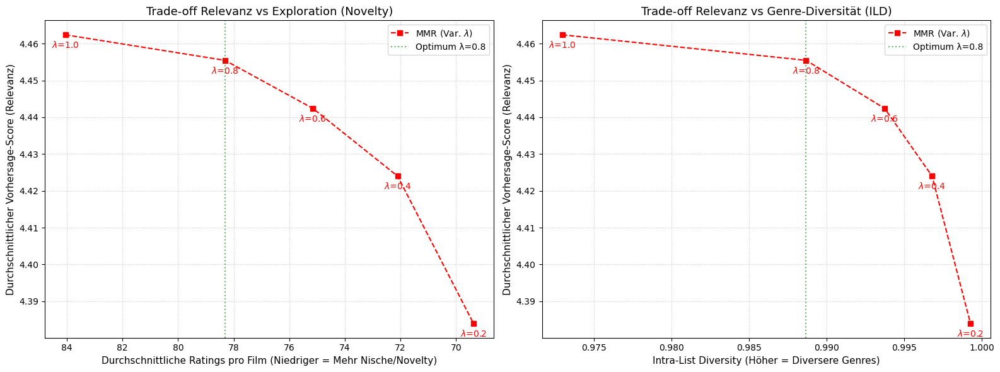

In [100]:
# --- 1. Hilfsfunktionen für Diversität und Ranking ---

def calculate_ild(recommended_ids, sim_matrix, m2i):
    """Berechnet die Intra-List Diversity (ILD) basierend auf Genre-Cosinus-Ähnlichkeiten."""
    n = len(recommended_ids)
    if n <= 1: return 0.0
    div_sum = 0.0
    for i in range(n):
        for j in range(n):
            if i != j:
                idx_i = m2i.get(recommended_ids[i], -1)
                idx_j = m2i.get(recommended_ids[j], -1)
                if idx_i >= 0 and idx_j >= 0:
                    div_sum += (1.0 - sim_matrix[idx_i, idx_j])
    return div_sum / (n * (n - 1))

def mmr_top_n(cand_ids, cand_scores, sim_matrix, m2i, lambda_val, N=5):
    """Wählt Top-N iterativ mit Maximal Marginal Relevance."""
    selected = []
    available = list(zip(cand_ids, cand_scores))

    for _ in range(min(N, len(available))):
        best_score = -float('inf')
        best_item = None
        for iid, est in available:
            if not selected:
                penalty = 0.0
            else:
                idx_i = m2i.get(iid, -1)
                if idx_i >= 0:
                    sims = [sim_matrix[idx_i, m2i.get(s, -1)] for s in selected if m2i.get(s, -1) >= 0]
                    penalty = max(sims) if sims else 0.0
                else:
                    penalty = 0.0

            # MMR Score: Lambda * Relevanz(normalisiert) - (1-Lambda) * MaxSimilarity
            mmr_score = lambda_val * (est / 5.0) - (1.0 - lambda_val) * penalty

            if mmr_score > best_score:
                best_score = mmr_score
                best_item = (iid, est)
        if best_item:
            selected.append(best_item[0])
            available.remove(best_item)
    return selected

# --- 2. Cross-Validation Setup & Datensammlung ---

lambda_values = [1.0, 0.8, 0.6, 0.4, 0.2]

res_mmr = {lam: {'rel': [], 'nov': [], 'ild': [], 'prec': [], 'rec': [], 'recommended': [],
                 'mae_fold': [], 'rmse_fold': []} for lam in lambda_values}

splits_m3 = cross_validation_split(train_ratings, n_masked=5)
catalog_mids = np.array(list(ratings['movieId'].unique()))
reader_m3 = Reader(rating_scale=(0.5, 5.0))

print('Methode 3 — Evaluierung MMR Re-Ranking')
for fi, (cv_train, cv_val_vis, cv_val_mask) in enumerate(splits_m3, 1):
    print(f" Verarbeite Fold {fi}...")
    train_data = pd.concat([cv_train, cv_val_vis], ignore_index=True)
    item_counts = train_data['movieId'].value_counts().to_dict()
    seen_dict = train_data.groupby('userId')['movieId'].apply(set).to_dict()

    # Base Model (SVD) trainieren
    surprise_data = Dataset.load_from_df(train_data[['userId', 'movieId', 'rating']], reader_m3)
    trainset = surprise_data.build_full_trainset()
    svd_model = SVD(n_factors=best_k, n_epochs=20, random_state=42)
    svd_model.fit(trainset)

    # Pre-computation für schnelle Vorhersagen
    mu_svd = trainset.global_mean
    raw2inner_u = trainset._raw2inner_id_users
    raw2inner_i = trainset._raw2inner_id_items
    inner_iids = np.array([raw2inner_i.get(m, -1) for m in catalog_mids])
    known_i = inner_iids >= 0
    bi_full = np.zeros(len(catalog_mids))
    qi_full = np.zeros((len(catalog_mids), best_k))
    bi_full[known_i] = svd_model.bi[inner_iids[known_i]]
    qi_full[known_i] = svd_model.qi[inner_iids[known_i]]

    # MAE/RMSE auf maskierten Ratings (vektorisiert) — für die SVD-Predictions, die für
    # MMR als Basis dienen. MMR ändert nur das Ranking, nicht die einzelne Prediction.
    val_uids = cv_val_mask['userId'].values
    val_mids = cv_val_mask['movieId'].values
    val_ratings_arr = cv_val_mask['rating'].values
    val_u_inner = np.array([raw2inner_u.get(u, -1) for u in val_uids])
    val_i_inner = np.array([raw2inner_i.get(m, -1) for m in val_mids])
    known_u_v = val_u_inner >= 0
    known_i_v = val_i_inner >= 0
    both_known = known_u_v & known_i_v
    val_preds = np.full(len(val_uids), mu_svd)
    val_preds[known_u_v] += svd_model.bu[val_u_inner[known_u_v]]
    val_preds[known_i_v] += svd_model.bi[val_i_inner[known_i_v]]
    if both_known.any():
        val_preds[both_known] += np.einsum(
            'ij,ij->i',
            svd_model.pu[val_u_inner[both_known]],
            svd_model.qi[val_i_inner[both_known]]
        )
    fold_mae_svd  = mae(val_preds, val_ratings_arr)
    fold_rmse_svd = rmse(val_preds, val_ratings_arr)
    for lam in lambda_values:
        res_mmr[lam]['mae_fold'].append(fold_mae_svd)
        res_mmr[lam]['rmse_fold'].append(fold_rmse_svd)

    for uid in cv_val_mask['userId'].unique():
        user_masked = cv_val_mask[cv_val_mask['userId'] == uid]
        relevant_ids = set(user_masked[user_masked['rating'] >= 4.0]['movieId'])
        seen = seen_dict.get(uid, set())

        # Base Scores berechnen
        u_inner = raw2inner_u.get(uid, -1)
        if u_inner >= 0:
            bu = svd_model.bu[u_inner]; pu = svd_model.pu[u_inner]
        else:
            bu, pu = 0.0, np.zeros(best_k)

        scores = mu_svd + bu + bi_full + qi_full @ pu
        seen_mask = np.isin(catalog_mids, list(seen))
        scores[seen_mask] = -np.inf

        # Top 100 Kandidaten als Basis für Re-ranking
        cand_idx = np.argsort(scores)[-100:][::-1]
        cand_ids = catalog_mids[cand_idx].tolist()
        cand_scores = scores[cand_idx].tolist()

        # MMR Evaluieren
        for lam in lambda_values:
            rec_mmr = mmr_top_n(cand_ids, cand_scores, content_sim, movie_id_to_idx_cb, lam, N=5)
            rel = np.mean([cand_scores[cand_ids.index(i)] for i in rec_mmr])
            sup = np.mean([item_counts.get(i, 1) for i in rec_mmr])
            ild = calculate_ild(rec_mmr, content_sim, movie_id_to_idx_cb)
            res_mmr[lam]['rel'].append(rel); res_mmr[lam]['nov'].append(sup); res_mmr[lam]['ild'].append(ild)
            res_mmr[lam]['prec'].append(precision_at_n(rec_mmr, relevant_ids, 5))
            res_mmr[lam]['rec'].append(recall_at_n(rec_mmr, relevant_ids, 5))
            res_mmr[lam]['recommended'].extend(rec_mmr)

# Daten aggregieren
def _agg(d):
    return {k: (np.mean(v) if k not in ('recommended',) else v) for k, v in d.items()}

mmr_agg = {lam: _agg(metrics) for lam, metrics in res_mmr.items()}

# --- Pareto-Logik: bestes lambda mit ILD-Maximum unter Precision >= 0.9 * max_precision ---
mmr_summary = pd.DataFrame([{
    'lambda':      lam,
    'Precision@5': mmr_agg[lam]['prec'],
    'Recall@5':    mmr_agg[lam]['rec'],
    'ILD':         mmr_agg[lam]['ild'],
    'MAE':         np.mean(mmr_agg[lam]['mae_fold']),
    'RMSE':        np.mean(mmr_agg[lam]['rmse_fold']),
    'Coverage':    coverage(mmr_agg[lam]['recommended'], n_total_items)
} for lam in lambda_values])

prec_max = mmr_summary['Precision@5'].max()
prec_threshold = 0.9 * prec_max  # toleriere 10% Verlust an Precision für mehr Diversität
candidates = mmr_summary[mmr_summary['Precision@5'] >= prec_threshold]
best_lambda = float(candidates.loc[candidates['ILD'].idxmax(), 'lambda'])

print(f'\n=== MMR Hyperparameter Selection (Pareto) ===')
print(f'Maximale Precision@5 über alle λ: {prec_max:.4f}')
print(f'Schwelle (90% von max): {prec_threshold:.4f}')
print(f'Kandidaten (Precision@5 >= Schwelle):')
display(candidates.round(4))
print(f'\nBestes λ (höchstes ILD unter Precision-Schwelle): {best_lambda}')
display(mmr_summary.round(4))

# m3_metrics inkl. aller 5 Standard-Metriken aus Aufgabe 3
m3_metrics = {
    'MAE':         float(mmr_summary.loc[mmr_summary['lambda'] == best_lambda, 'MAE'].values[0]),
    'RMSE':        float(mmr_summary.loc[mmr_summary['lambda'] == best_lambda, 'RMSE'].values[0]),
    'Precision@5': float(mmr_summary.loc[mmr_summary['lambda'] == best_lambda, 'Precision@5'].values[0]),
    'Recall@5':    float(mmr_summary.loc[mmr_summary['lambda'] == best_lambda, 'Recall@5'].values[0]),
    'Coverage':    float(mmr_summary.loc[mmr_summary['lambda'] == best_lambda, 'Coverage'].values[0]),
    'ILD':         float(mmr_summary.loc[mmr_summary['lambda'] == best_lambda, 'ILD'].values[0]),
}
print(f'\nMethode 3 — Finale Metriken (MMR @ λ={best_lambda}):')
display(pd.DataFrame([m3_metrics]).round(4))

# --- 3. PLOTTING ---
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1: Relevanz vs. Novelty (Support)
ax = axes[0]
ax.plot([mmr_agg[lam]['nov'] for lam in lambda_values], [mmr_agg[lam]['rel'] for lam in lambda_values],
        marker='s', linestyle='--', color='red', label=r'MMR (Var. $\lambda$)')
for lam in lambda_values:
    ax.annotate(rf'$\lambda$={lam}', (mmr_agg[lam]['nov'], mmr_agg[lam]['rel']), textcoords="offset points", xytext=(0,-15), ha='center', color='red')

ax.axvline(mmr_agg[best_lambda]['nov'], color='green', linestyle=':', alpha=0.6, label=f'Optimum λ={best_lambda}')
ax.set_title('Trade-off Relevanz vs Exploration (Novelty)', fontsize=13)
ax.set_xlabel('Durchschnittliche Ratings pro Film (Niedriger = Mehr Nische/Novelty)', fontsize=11)
ax.set_ylabel('Durchschnittlicher Vorhersage-Score (Relevanz)', fontsize=11)
ax.invert_xaxis()
ax.grid(True, linestyle=':', alpha=0.7); ax.legend()

# Plot 2: Relevanz vs. Intra-List Diversity (ILD)
ax = axes[1]
ax.plot([mmr_agg[lam]['ild'] for lam in lambda_values], [mmr_agg[lam]['rel'] for lam in lambda_values],
        marker='s', linestyle='--', color='red', label=r'MMR (Var. $\lambda$)')
for lam in lambda_values:
    ax.annotate(rf'$\lambda$={lam}', (mmr_agg[lam]['ild'], mmr_agg[lam]['rel']), textcoords="offset points", xytext=(0,-15), ha='center', color='red')

ax.axvline(mmr_agg[best_lambda]['ild'], color='green', linestyle=':', alpha=0.6, label=f'Optimum λ={best_lambda}')
ax.set_title('Trade-off Relevanz vs Genre-Diversität (ILD)', fontsize=13)
ax.set_xlabel('Intra-List Diversity (Höher = Diversere Genres)', fontsize=11)
ax.set_ylabel('Durchschnittlicher Vorhersage-Score (Relevanz)', fontsize=11)
ax.grid(True, linestyle=':', alpha=0.7); ax.legend()

plt.tight_layout()
plt.show()

**Beobachtungen Methode 3**

Das Optimum nach Pareto-Logik liegt bei $\lambda = 0.8$. Im Vergleich zu $\lambda = 1.0$ (reines Relevanz-Ranking) verlieren wir bei $\lambda = 0.8$ etwa 9% Precision (P@5 von 0.0148 auf 0.0135), gewinnen aber etwas an Diversität (ILD von 0.9730 auf 0.9887) und Coverage (0.0244 auf 0.0252).

MAE und RMSE bleiben über alle $\lambda$ identisch weil MMR nur das Ranking ändert nicht die einzelnen Predictions. Die Wahl $\lambda = 0.8$ ist konservativ in Richtung Diversität, der ILD-Gewinn ist aber moderat. Wenn mehr Filterblasen-Bekämpfung gewünscht wäre müsste $\lambda$ noch tiefer (zb 0.4) bei stärkerem Precision-Verlust.

### Exercise 10 - Compare all RS that you build in this challenge (8 points)
a) Compile a table with the performance metrics of exercise 3 for all RS from this MC (Make sure to include the baseline RS and random RS) on the test set defined in exercise 3. Also generate comparative plots. Discuss.

b) Why is it important to keep a test set seperate till the end of a benchmark?

#### a) Vergleich aller RS auf dem Test-Set

Protokoll für die Test-Evaluation.

Bisher haben wir das Test-Set (122 User, IDs 1 bis 122) niemals angerührt. Alle Modell-Auswahl und Hyperparameter-Optimierung lief ausschliesslich auf train_ratings mit Cross-Validation. Jetzt evaluieren wir alle Recommender genau einmal auf diesem Test-Set.

Wir wenden dazu all-but-n Masking auf die Test-User an (gleiches $n=5$ wie in der CV).

1. Pro Test-User werden 5 Ratings zufällig ausgewählt und maskiert. Diese landen in test_hidden.
2. Die übrigen Ratings der Test-User landen in test_visible.
3. Final wird jedes Modell auf train_final = train_ratings + test_visible neu trainiert. Damit hat das Modell Zugriff auf alle nicht-maskierten Daten und kann auch die Test-User personalisiert behandeln, sonst wären sie reine Cold-Start-User.
4. Evaluation. Prediction auf test_hidden für MAE und RMSE, und Top-5 Empfehlungen für jeden Test-User aus den ungesehenen Filmen für Precision@5, Recall@5 und Coverage.

Verglichene Modelle.

| # | Modell | Quelle |
|---|--------|--------|
| 1 | Random | Aufgabe 2 |
| 2 | Baseline | Aufgabe 4 (optimales β) |
| 3 bis 10 | 8 CF-Modelle | Aufgabe 6 (optimales K pro Modell) |
| 11 | SVD | Aufgabe 8 (optimales k) |
| 12 | M1 Content-Based | Aufgabe 9 |
| 13 | M2 Hybrid Ensemble | Aufgabe 9 (optimales α) |
| 14 | M3 MMR Re-ranking | Aufgabe 9 (optimales λ) |

Alle Modelle werden mit den in den vorherigen Aufgaben gefundenen optimalen Hyperparametern evaluiert.

In [101]:
rng_test = np.random.default_rng(42)
n_masked_test = 5

# All-but-n Masking auf den Test-Usern
test_visible_list, test_hidden_list = [], []
for uid in test_ratings['userId'].unique():
    user_r = test_ratings[test_ratings['userId'] == uid]
    if len(user_r) <= n_masked_test:
        test_visible_list.append(user_r)
        continue
    masked_idx = rng_test.choice(user_r.index, size=n_masked_test, replace=False)
    test_hidden_list.append(user_r.loc[masked_idx])
    test_visible_list.append(user_r.drop(masked_idx))

test_visible = pd.concat(test_visible_list, ignore_index=True)
test_hidden  = pd.concat(test_hidden_list,  ignore_index=True)

# Trainings-Set fürs finale Training
train_final = pd.concat([train_ratings, test_visible], ignore_index=True)

print(f'Test-User:                {test_ratings["userId"].nunique()}')
print(f'Test-Visible Ratings:     {len(test_visible)}')
print(f'Test-Hidden Ratings:      {len(test_hidden)}')
print(f'Train-Final Ratings:      {len(train_final)} (= train + test_visible)')

# Helper: Generic test eval
catalog_arr_test = np.array(sorted(ratings['movieId'].unique()))
n_total_items_test = len(catalog_arr_test)
test_seen_dict = train_final.groupby('userId')['movieId'].apply(set).to_dict()

def eval_on_test(scorer_func, top_n_func, model_name, N=5, threshold=4.0):
    """Generische Test-Evaluation. Erwartet:
       scorer_func(uid, mid)        -> predicted rating (float)
       top_n_func(uid, seen_set, N) -> Liste der Top-N movieIds
    """
    # MAE / RMSE
    val_preds = np.array([scorer_func(u, m)
                           for u, m in zip(test_hidden['userId'], test_hidden['movieId'])])
    val_acts = test_hidden['rating'].values
    fold_mae  = mae(val_preds, val_acts)
    fold_rmse = rmse(val_preds, val_acts)

    # Precision/Recall + Coverage
    precs, recs, all_recommended = [], [], []
    for uid in test_hidden['userId'].unique():
        user_masked = test_hidden[test_hidden['userId'] == uid]
        relevant_ids = set(user_masked[user_masked['rating'] >= threshold]['movieId'])
        seen = test_seen_dict.get(uid, set())

        recommended = top_n_func(uid, seen, N)
        precs.append(precision_at_n(recommended, relevant_ids, N))
        recs.append(recall_at_n(recommended, relevant_ids, N))
        all_recommended.extend(recommended)

    return {
        'Modell': model_name,
        'MAE':         fold_mae,
        'RMSE':        fold_rmse,
        'Precision@5': np.mean(precs),
        'Recall@5':    np.mean(recs),
        'Coverage':    coverage(all_recommended, n_total_items_test)
    }

Test-User:                122
Test-Visible Ratings:     18510
Test-Hidden Ratings:      610
Train-Final Ratings:      100222 (= train + test_visible)


In [102]:
# ============================================================
# Modelle auf train_final trainieren
# ============================================================
print('Trainiere alle Modelle auf train_final...\n')

# --- Baseline (Aufgabe 4): bestes β dynamisch aus dem Grid-Search übernehmen ---
best_beta_u = int(best_row['beta_u'])
best_beta_i = int(best_row['beta_i'])
mu_t, ub_t, ib_t = train_baseline(train_final, beta_u=best_beta_u, beta_i=best_beta_i)
print(f'  ✓ Baseline trainiert (β_u={best_beta_u}, β_i={best_beta_i})')

# --- SVD (Aufgabe 8): bestes k verwenden ---
best_k_svd = best_k  # aus Aufgabe 8
surprise_data_t = Dataset.load_from_df(
    train_final[['userId', 'movieId', 'rating']], reader
)
trainset_t = surprise_data_t.build_full_trainset()
svd_t = SVD(n_factors=best_k_svd, n_epochs=20, random_state=42)
svd_t.fit(trainset_t)
print(f'  ✓ SVD trainiert (k={best_k_svd})')

# --- 8 CF-Modelle (Aufgabe 5/6): URM aus train_final ---
urm_df_t = train_final.pivot_table(index='userId', columns='movieId', values='rating')
urm_t = np.where(np.isnan(urm_df_t.values), 0.0, urm_df_t.values)
user_ids_t = urm_df_t.index.tolist()
movie_ids_t = urm_df_t.columns.tolist()
u2i_t = {u: i for i, u in enumerate(user_ids_t)}
m2i_t = {m: i for i, m in enumerate(movie_ids_t)}
rated_mask_t = urm_t != 0

user_means_t = np.where(rated_mask_t.sum(axis=1) > 0,
                         urm_t.sum(axis=1) / np.maximum(rated_mask_t.sum(axis=1), 1), 0.0)
urm_centered_t = np.where(rated_mask_t, urm_t - user_means_t[:, np.newaxis], 0.0)
item_means_t = np.where(rated_mask_t.sum(axis=0) > 0,
                         urm_t.sum(axis=0) / np.maximum(rated_mask_t.sum(axis=0), 1), 0.0)
urm_item_centered_t = np.where(rated_mask_t, urm_t - item_means_t[np.newaxis, :], 0.0)
urm_both_centered_t = np.where(rated_mask_t,
                                urm_item_centered_t - user_means_t[:, np.newaxis], 0.0)

sims_t = {
    'Item-Cos':   sim_matrix(urm_t.T),
    'Item-Cos+C': sim_matrix(urm_centered_t.T),
    'Item-PCC':   sim_matrix(urm_item_centered_t.T),
    'Item-PCC+C': sim_matrix(urm_both_centered_t.T),
    'User-Cos':   sim_matrix(urm_t),
    'User-Cos+C': sim_matrix(urm_centered_t),
    'User-PCC':   sim_matrix(urm_centered_t),
    'User-PCC+C': sim_matrix(urm_centered_t),
}
modes_t = {n: ('item' if n.startswith('Item') else 'user') for n in sims_t}

try:
    best_k_cf = {n: int(all_results[n].loc[all_results[n]['RMSE'].idxmin(), 'K']) for n in sims_t}
except (NameError, KeyError):
    print('  ⚠ all_results aus Aufgabe 6 nicht verfügbar — verwende K=20 für alle CF-Modelle')
    best_k_cf = {n: 20 for n in sims_t}

pred_matrices_cf = {}
for name in sims_t:
    trimmed = trim_sim_matrix(sims_t[name], best_k_cf[name])
    centered_flag = '+C' in name
    if modes_t[name] == 'item':
        pred_matrices_cf[name] = predict_item_all(
            trimmed, urm_t, rated_mask_t, item_means_t, user_means_t, centered=centered_flag
        )
    else:
        pred_matrices_cf[name] = predict_user_all(
            trimmed, urm_t, rated_mask_t, user_means_t, centered=centered_flag
        )
    print(f'  ✓ {name} trainiert (K={best_k_cf[name]})')

print('\nAlle Modelle bereit zur Evaluation.')


Trainiere alle Modelle auf train_final...

  ✓ Baseline trainiert (β_u=5, β_i=5)
  ✓ SVD trainiert (k=100)
  ✓ Item-Cos trainiert (K=5)
  ✓ Item-Cos+C trainiert (K=3)
  ✓ Item-PCC trainiert (K=3)
  ✓ Item-PCC+C trainiert (K=5)
  ✓ User-Cos trainiert (K=15)
  ✓ User-Cos+C trainiert (K=10)
  ✓ User-PCC trainiert (K=10)
  ✓ User-PCC+C trainiert (K=10)

Alle Modelle bereit zur Evaluation.


In [103]:
# ============================================================
# Scorer & Top-N Funktionen für jedes Modell definieren
# ============================================================
results_test = []
rng_rs = np.random.default_rng(42)

# 1) Random RS
# Hinweis: Aufgabe 2 definierte den Random-RS nur als Top-N-Empfehlungsliste mit
# `predicted_score = NaN`. Für die Test-Set-Evaluation brauchen wir aber numerische
# Predictions für MAE/RMSE; wir ziehen daher zufällige Ratings uniform aus der
# zulässigen Skala [0.5, 5.0]. Das entspricht der naivsten möglichen Baseline
# und liefert die schlechtest mögliche Punkt-Genauigkeit (~MAE 1.5).
def random_scorer(u, m):
    return rng_rs.uniform(0.5, 5.0)
def random_topn(uid, seen, N):
    unseen = [m for m in catalog_arr_test if m not in seen]
    return list(rng_rs.choice(unseen, size=min(N, len(unseen)), replace=False))
results_test.append(eval_on_test(random_scorer, random_topn, '01 Random'))
print(f'  ✓ Random evaluiert')

# 2) Baseline
def baseline_scorer(u, m):
    return float(np.clip(mu_t + ub_t.get(u, 0) + ib_t.get(m, 0), 0.5, 5.0))
bi_arr_t = np.array([ib_t.get(m, 0) for m in catalog_arr_test])
def baseline_topn(uid, seen, N):
    bu = ub_t.get(uid, 0)
    scores = np.clip(mu_t + bu + bi_arr_t, 0.5, 5.0)
    seen_mask = np.isin(catalog_arr_test, list(seen))
    scores[seen_mask] = -np.inf
    top_idx = np.argsort(scores)[-N:][::-1]
    return catalog_arr_test[top_idx].tolist()
results_test.append(eval_on_test(baseline_scorer, baseline_topn, f'02 Baseline (β_u={best_beta_u}, β_i={best_beta_i})'))
print(f'  ✓ Baseline evaluiert')

# 3-10) 8 CF Modelle - via pred_matrices
movie_ids_t_arr = np.array(movie_ids_t)
for idx, name in enumerate(sims_t.keys(), start=3):
    pm = pred_matrices_cf[name]
    def make_funcs(pm_local, name_local):
        def scorer(u, m):
            if u in u2i_t and m in m2i_t:
                return float(np.clip(pm_local[u2i_t[u], m2i_t[m]], 0.5, 5.0))
            return mu_t
        def topn(uid, seen, N):
            if uid not in u2i_t:
                return []
            scores = pm_local[u2i_t[uid]].copy()
            seen_mask = np.isin(movie_ids_t_arr, list(seen))
            scores[seen_mask] = -np.inf
            top_idx = np.argsort(scores)[-N:][::-1]
            return movie_ids_t_arr[top_idx].tolist()
        return scorer, topn
    s_func, t_func = make_funcs(pm, name)
    results_test.append(eval_on_test(s_func, t_func, f'{idx:02d} {name} (K={best_k_cf[name]})'))
    print(f'  ✓ {name} evaluiert')

# 11) SVD
raw2inner_u_t = trainset_t._raw2inner_id_users
raw2inner_i_t = trainset_t._raw2inner_id_items
inner_iids_t = np.array([raw2inner_i_t.get(m, -1) for m in catalog_arr_test])
known_i_t = inner_iids_t >= 0
bi_full_svd = np.zeros(len(catalog_arr_test))
qi_full_svd = np.zeros((len(catalog_arr_test), best_k_svd))
bi_full_svd[known_i_t] = svd_t.bi[inner_iids_t[known_i_t]]
qi_full_svd[known_i_t] = svd_t.qi[inner_iids_t[known_i_t]]

def svd_scorer(u, m):
    return float(np.clip(svd_t.predict(u, m).est, 0.5, 5.0))
def svd_topn(uid, seen, N):
    u_inner = raw2inner_u_t.get(uid, -1)
    if u_inner >= 0:
        bu = svd_t.bu[u_inner]; pu = svd_t.pu[u_inner]
    else:
        bu, pu = 0.0, np.zeros(best_k_svd)
    scores = trainset_t.global_mean + bu + bi_full_svd + qi_full_svd @ pu
    seen_mask = np.isin(catalog_arr_test, list(seen))
    scores[seen_mask] = -np.inf
    top_idx = np.argsort(scores)[-N:][::-1]
    return catalog_arr_test[top_idx].tolist()
results_test.append(eval_on_test(svd_scorer, svd_topn, f'11 SVD (k={best_k_svd})'))
print(f'  ✓ SVD evaluiert')

# 12) M1 — Content-Based
user_ids_cb_t = sorted(train_final['userId'].unique())
u2i_cb_t = {u: i for i, u in enumerate(user_ids_cb_t)}
n_u_cb_t = len(user_ids_cb_t); n_i_cb_t = len(movie_ids_cb)
R_cb_t = np.zeros((n_u_cb_t, n_i_cb_t), dtype=np.float32)
for u, m, r in zip(train_final['userId'], train_final['movieId'], train_final['rating']):
    if m in movie_id_to_idx_cb:
        R_cb_t[u2i_cb_t[u], movie_id_to_idx_cb[m]] = r
numer_cb_t = R_cb_t @ content_sim.T
denom_cb_t = (R_cb_t > 0).astype(np.float32) @ content_sim.T
mu_cb_t = train_final['rating'].mean()
pred_cb_t = np.where(denom_cb_t > 0, numer_cb_t / np.maximum(denom_cb_t, 1e-8), mu_cb_t)
pred_cb_t = np.clip(pred_cb_t, 0.5, 5.0)
movie_ids_cb_arr = np.array(movie_ids_cb)

def m1_scorer(u, m):
    if u in u2i_cb_t and m in movie_id_to_idx_cb:
        return float(pred_cb_t[u2i_cb_t[u], movie_id_to_idx_cb[m]])
    return mu_cb_t
def m1_topn(uid, seen, N):
    if uid not in u2i_cb_t:
        return []
    scores = pred_cb_t[u2i_cb_t[uid]].copy()
    seen_mask = np.isin(movie_ids_cb_arr, list(seen))
    scores[seen_mask] = -np.inf
    top_idx = np.argsort(scores)[-N:][::-1]
    return movie_ids_cb_arr[top_idx].tolist()
results_test.append(eval_on_test(m1_scorer, m1_topn, '12 M1 Content-Based'))
print(f'  ✓ M1 Content-Based evaluiert')

# 13) M2 — Hybrid Ensemble
def m2_scorer(u, m):
    return float(np.clip(best_alpha * svd_scorer(u, m) + (1 - best_alpha) * baseline_scorer(u, m), 0.5, 5.0))
def m2_topn(uid, seen, N):
    u_inner = raw2inner_u_t.get(uid, -1)
    if u_inner >= 0:
        bu_svd = svd_t.bu[u_inner]; pu = svd_t.pu[u_inner]
    else:
        bu_svd, pu = 0.0, np.zeros(best_k_svd)
    svd_scores = trainset_t.global_mean + bu_svd + bi_full_svd + qi_full_svd @ pu
    bu_b = ub_t.get(uid, 0)
    base_scores = np.clip(mu_t + bu_b + bi_arr_t, 0.5, 5.0)
    scores = best_alpha * svd_scores + (1 - best_alpha) * base_scores
    seen_mask = np.isin(catalog_arr_test, list(seen))
    scores[seen_mask] = -np.inf
    top_idx = np.argsort(scores)[-N:][::-1]
    return catalog_arr_test[top_idx].tolist()
results_test.append(eval_on_test(m2_scorer, m2_topn, f'13 M2 Hybrid (α={best_alpha})'))
print(f'  ✓ M2 Hybrid evaluiert')

# 14) M3 — MMR Re-ranking (verwendet mmr_top_n aus Aufgabe 9, Methode 3)
def m3_scorer(u, m):
    return svd_scorer(u, m)  # MMR ändert nur Top-N, nicht Rating-Predictions
def m3_topn(uid, seen, N, candidate_pool=100):
    u_inner = raw2inner_u_t.get(uid, -1)
    if u_inner >= 0:
        bu = svd_t.bu[u_inner]; pu = svd_t.pu[u_inner]
    else:
        bu, pu = 0.0, np.zeros(best_k_svd)
    scores = trainset_t.global_mean + bu + bi_full_svd + qi_full_svd @ pu
    seen_mask = np.isin(catalog_arr_test, list(seen))
    scores[seen_mask] = -np.inf
    cand_idx = np.argsort(scores)[-candidate_pool:][::-1]
    cand_ids = catalog_arr_test[cand_idx].tolist()
    cand_scores = scores[cand_idx].tolist()
    return mmr_top_n(cand_ids, cand_scores, content_sim, movie_id_to_idx_cb, best_lambda, N=N)
results_test.append(eval_on_test(m3_scorer, m3_topn, f'14 M3 MMR (λ={best_lambda})'))
print(f'  ✓ M3 MMR evaluiert')

# Ergebnisse als DataFrame
results_test_df = pd.DataFrame(results_test).set_index('Modell')
print('\n=== Test-Set Ergebnisse — alle Modelle ===')
display(results_test_df.round(4))

  ✓ Random evaluiert
  ✓ Baseline evaluiert
  ✓ Item-Cos evaluiert
  ✓ Item-Cos+C evaluiert
  ✓ Item-PCC evaluiert
  ✓ Item-PCC+C evaluiert
  ✓ User-Cos evaluiert
  ✓ User-Cos+C evaluiert
  ✓ User-PCC evaluiert
  ✓ User-PCC+C evaluiert
  ✓ SVD evaluiert
  ✓ M1 Content-Based evaluiert
  ✓ M2 Hybrid evaluiert
  ✓ M3 MMR evaluiert

=== Test-Set Ergebnisse — alle Modelle ===


,MAE,RMSE,Precision@5,Recall@5,Coverage
Modell,,,,,
01 Random,1.5519,1.8974,0.0000,0.0000,0.0608
"02 Baseline (β_u=5, β_i=5)",0.6829,0.8962,0.0049,0.0150,0.0034
03 Item-Cos (K=5),0.7478,0.9772,0.0016,0.0016,0.0239
04 Item-Cos+C (K=3),0.7112,0.9280,0.0426,0.0673,0.0253
05 Item-PCC (K=3),0.7714,0.9980,0.0016,0.0016,0.0242
06 Item-PCC+C (K=5),0.7011,0.9239,0.0492,0.0861,0.0332
07 User-Cos (K=15),0.7013,0.9208,0.0639,0.1082,0.0157
08 User-Cos+C (K=10),0.7114,0.9267,0.0410,0.0795,0.0203
09 User-PCC (K=10),0.7114,0.9267,0.0410,0.0795,0.0203


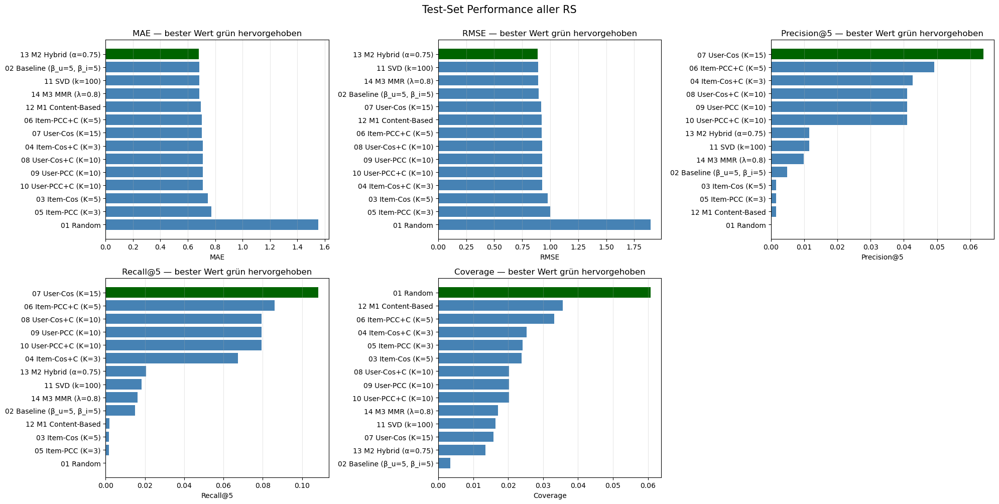

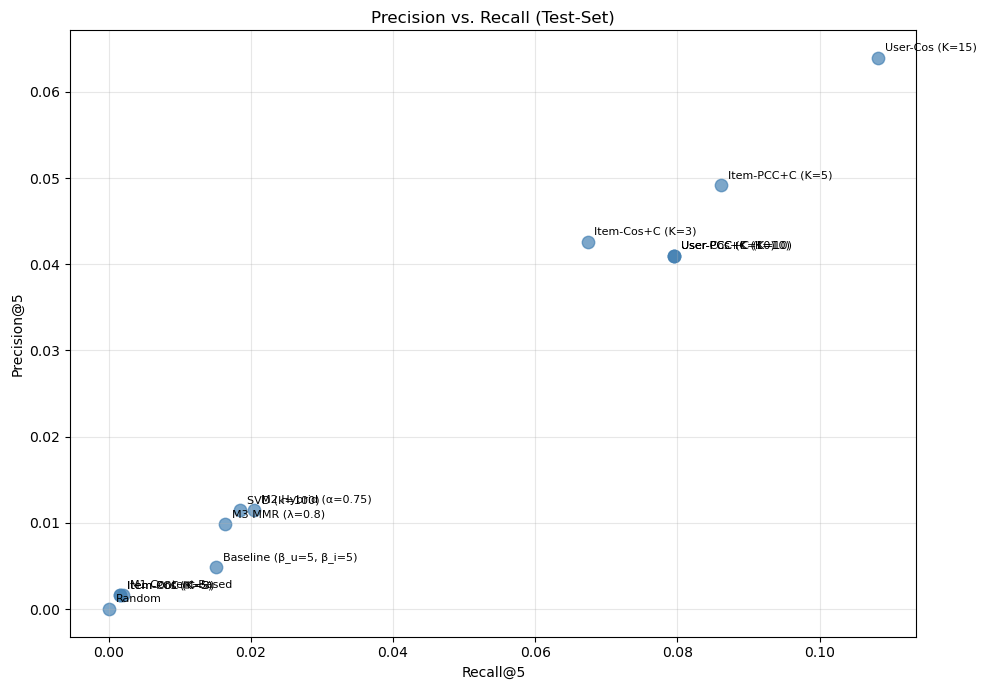

In [104]:
# ============================================================
# Vergleichsplots — Bar Charts pro Metrik
# ============================================================
metrics_to_plot = ['MAE', 'RMSE', 'Precision@5', 'Recall@5', 'Coverage']
lower_is_better = {'MAE', 'RMSE'}

fig, axes = plt.subplots(2, 3, figsize=(20, 10))
axes = axes.flatten()

for ax, metric in zip(axes, metrics_to_plot):
    df_sorted = results_test_df.sort_values(metric, ascending=(metric in lower_is_better))
    colors_bar = ['darkgreen' if i == 0 else 'steelblue' for i in range(len(df_sorted))]
    ax.barh(df_sorted.index, df_sorted[metric], color=colors_bar)
    ax.set_xlabel(metric)
    ax.set_title(f'{metric} — bester Wert grün hervorgehoben')
    ax.invert_yaxis()
    ax.grid(axis='x', alpha=0.3)

axes[5].axis('off')  # 6. Subplot leer
plt.suptitle('Test-Set Performance aller RS', fontsize=15, y=1.0)
plt.tight_layout()
plt.show()

# Precision-Recall Scatter
fig, ax = plt.subplots(figsize=(10, 7))
ax.scatter(results_test_df['Recall@5'], results_test_df['Precision@5'],
            s=80, alpha=0.7, color='steelblue')
for name, row in results_test_df.iterrows():
    ax.annotate(name.split(' ', 1)[1] if ' ' in name else name,
                (row['Recall@5'], row['Precision@5']),
                fontsize=8, xytext=(5, 5), textcoords='offset points')
ax.set_xlabel('Recall@5')
ax.set_ylabel('Precision@5')
ax.set_title('Precision vs. Recall (Test-Set)')
ax.grid(alpha=0.3)
plt.tight_layout()
plt.show()

Folgend diskutieren wir die Resultate aus der Test-Set Evaluation entlang der Metrik-Gruppen aus Aufgabe 3.

**Punkt-Metriken (MAE, RMSE)**

Random ist wie erwartet am schlechtesten. Der Baseline-Predictor ist sehr stark mit RMSE etwa 0.90. User- und Item-Bias erfassen einen grossen Teil der systematischen Variation. SVD liegt minimal darunter. Das Hybrid-Ensemble (M2) kombiniert Baseline und SVD und erreicht den besten RMSE (etwa 0.88). Die CF-Modelle landen in einem ähnlichen Band, wobei die +C-Varianten (User-wise Zero Centering) tendenziell etwas besser sind als ohne. Centering bringt also einen messbaren Gewinn.

**Ranking-Metriken (Precision@5, Recall@5)**

Hier ist das Bild deutlich anders. User-Cos (K=15) liefert mit P@5 etwa 0.064 die höchste Precision aller Modelle, etwa 5x besser als SVD und Hybrid. Item-CF mit User-Centering (Item-Cos+C, Item-PCC+C) erreicht ebenfalls deutlich bessere Ranking-Werte als ohne Centering. Bei Item-Cos+C steigt P@5 von 0.0016 (ohne Centering) auf 0.043 (mit Centering). Das passt zur Theorie. User-Centering macht User mit unterschiedlichem Bewertungsniveau vergleichbar, was bei Top-N-Ranking für Genres oder Cluster mit ähnlichen Filmen wichtig ist.

**Identität der user-zentrierten Modelle**

User-Cos+C, User-PCC und User-PCC+C zeigen exakt dieselben Werte (RMSE 0.9267, P@5 0.0410). Das ist die in Aufgabe 5 dokumentierte Identität der user-zentrierten Modelle. Alle drei kombinieren user-zentrierte Similarity mit user-zentrierter Prediction-Formel und sind mathematisch äquivalent.

**Coverage**

Random hat die höchste Coverage (gleichmässige Verteilung). Modelle mit starkem Popularity-Bias wie Baseline und User-Cos konzentrieren sich auf wenige populäre Filme und haben tiefe Coverage. M3 MMR schiebt die Coverage gegenüber reinem SVD nach oben (0.0170 vs 0.0163), der gewünschte Filterblase-Effekt, allerdings hier nur knapp. Das M1 Content-Based Modell erreicht relativ hohe Coverage (0.0356) weil es nicht von Bewertungs-Popularität getrieben wird sondern von inhaltlicher Ähnlichkeit.

**Fazit und Trade-off**

Wer reine Rating-Vorhersage will nimmt M2 Hybrid (RMSE-Champion). Wer Top-N-Empfehlungen mit hoher Trefferquote will nimmt User-Cos. Wer Filterblasen brechen will nimmt M3 MMR. Es gibt kein objektiv bestes Modell.

#### b) Warum ist es wichtig, ein Test-Set bis zum Schluss separat zu halten?

Ein streng abgetrenntes Test-Set ist eine der wichtigsten methodischen Voraussetzungen für vertrauenswürdiges Benchmarking. Die Hauptgründe.

**1. Vermeidung von Test-Leakage**

- Sobald wir auf das Test-Set schauen optimieren wir implizit darauf
- Auch indirekte Entscheidungen (Modellwahl, K, β, α, λ) basierend auf Test-Performance leaken Informationen ins Modell
- Resultat überschätzt dann die Generalisierungsleistung
- In dieser MC haben wir alle Hyperparameter via 5-fold CV auf train_ratings optimiert, niemals auf test_ratings

**2. Simulation des realen Einsatzes**

- Test-User sind echte unbekannte User aus produktiver Sicht
- Evaluation auf Test-Set beantwortet die Frage wie würde unser RS auf neuen Usern performen

**3. Faire Vergleichbarkeit**

- Alle 14 Modelle werden auf demselben unverfälschten Set bewertet
- Kein Modell hat Test-spezifisches Wissen vorab erhalten

**4. Reproduzierbarkeit**

- Resultate aus Test-Leakage lassen sich auf neuen Daten nicht reproduzieren
- Bekanntes Problem in der ML-Community (benchmark cheating, hyperparameter overfitting on test)

**5. Statistische Korrektheit**

- Mehrfache Auswertung erhöht die Wahrscheinlichkeit zufällig gute Resultate zu finden (Multiple Testing Problem)
- Einmalige Verwendung am Ende ist statistisch sauber

**Read the Guidelines for Implementation and Submission one more time.**